In [1]:
# Data Analysis and Visualization tool
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
from tqdm import tqdm

# import missingno library which helps us to visualize the missing values
# import missingno as msno
import matplotlib.pyplot as plt
import missingno
import seaborn as sns
# from pandas.tools.plotting import scatter_matrix
from mpl_toolkits.mplot3d import Axes3D
from statsmodels.graphics.mosaicplot import mosaic


pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 200)


# Stats Framework
from scipy import stats
from scipy.stats import ttest_ind
from statsmodels.stats.weightstats import ztest as ztest
from scipy.stats import chi2_contingency
from scipy.stats import chi2
from statsmodels.stats.outliers_influence import variance_inflation_factor


# scikit learn framework
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score    #to measure model performance
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from scipy.stats import randint as sp_randint
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Machine learning model selection and implementation
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier



from pprint import pprint
import time


# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

# 1) Loading Datasets

In [2]:
data_1 = pd.read_csv("Data.csv")
data_2 = pd.read_csv("Data 2.csv")

In [3]:
# Dataset Overview 

data_1

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,17.09,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,18.19,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,17.74,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,15.98,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,17.20,s,y,w,u,w,t,p,NaN,d,w
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61064,p,1.18,s,s,y,f,f,f,f,3.93,6.22,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61065,p,1.27,f,s,y,f,f,f,f,3.18,5.43,NaN,NaN,y,NaN,NaN,f,f,NaN,d,a
61066,p,1.27,s,s,y,f,f,f,f,3.86,6.37,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
61067,p,1.24,f,s,y,f,f,f,f,3.56,5.44,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u


In [4]:
data_2

,family,name,class,cap-diameter,cap-shape,Cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,Spore-print-color,habitat,season
0,Amanita Family,Fly Agaric,p,[10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Amanita Family,Panther Cap,p,[5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Amanita Family,False Panther Cap,p,[10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Amanita Family,The Blusher,e,[5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Amanita Family,Death Cap,p,[5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Amanita Family,False Death Cap,e,[4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Amanita Family,Destroying Angel,p,[5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Amanita Family,Tawny Grisette,e,[4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Lepiota Family,Parasol Mushroom,e,[10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Lepiota Family,Shaggy Parasol,e,[12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## a) Attribute Description

### For data_1

 Class information:
        
### 1. class    :    poisonous=p, edibile=e (binary)


### 2. Variable Information:
   (n: nominal, m: metrical; nominal values as sets of values)
   
   1. cap-diameter (m):			float number in cm
   
   2. cap-shape (n):            bell=b, conical=c, convex=x, flat=f, sunken=s, spherical=p, others=o
                                
   3. cap-surface (n):          fibrous=i, grooves=g, scaly=y, smooth=s, shiny=h, leathery=l, silky=k, sticky=t, wrinkled=w, fleshy=e
                                
   4. cap-color (n):            brown=n, buff=b, gray=g, green=r, pink=p, purple=u, red=e, white=w, yellow=y, blue=l,orange=o,  black=k
                                
   5. does-bruise-bleed (n):	bruises-or-bleeding=t,no=f
   
   6. gill-attachment (n):      adnate=a, adnexed=x, decurrent=d, free=e, sinuate=s, pores=p, none=f, unknown=?
                                
   7. gill-spacing (n):         close=c, distant=d, none=f
   
   8. gill-color (n):           see cap-color + none=f
   
   9. stem-height (m):			float number in cm
   
   10. stem-width (m):			float number in mm  
   
   11. stem-root (n):           bulbous=b, swollen=s, club=c, cup=u, equal=e, rhizomorphs=z, rooted=r
                                
   12. stem-surface (n): 		see cap-surface + none=f
   
   13. stem-color (n):			see cap-color + none=f
   
   14. veil-type (n):           partial=p, universal=u
   
   15. veil-color (n):          see cap-color + none=f
   
   16. has-ring (n):            ring=t, none=f
   
   17. ring-type (n):           cobwebby=c, evanescent=e, flaring=r, grooved=g, large=l, pendant=p, sheathing=s, zone=z, scaly=y, movable=m, none=f, unknown=?
                                
   18. spore-print-color (n):   see cap color
   
   19. habitat (n):             grasses=g, leaves=l, meadows=m, paths=p, heaths=h,urban=u, waste=w, woods=d
                                
   20. season (n):				spring=s, summer=u, autumn=a, winter=w

### For data_2

### Class information:
    1. family		String of the name of the family of mushroom species (multinomial)
	2. name			String of the of the mushroom species (multinomial)
	3. class		poisonous=p, edibile=e (binary)

### Variable Information:
   (n: nominal, m: metrical; nominal values as sets of values)
   1. cap-diameter (m):			float number(s) in cm two values=min max, one value=mean
   
   2. cap-shape (n):            bell=b, conical=c, convex=x, flat=f, sunken=s, spherical=p, others=o
   
   3. cap-surface (n):          fibrous=i, grooves=g, scaly=y, smooth=s,
								shiny=h, leathery=l, silky=k, sticky=t,
								wrinkled=w, fleshy=e
                                
   4. cap-color (n):            brown=n, buff=b, gray=g, green=r, pink=p,
								purple=u, red=e, white=w, yellow=y, blue=l, 
								orange=o,  black=k
                                
   5. does-bruise-bleed (n):	bruises-or-bleeding=t,no=f
   
   6. gill-attachment (n):      adnate=a, adnexed=x, decurrent=d, free=e, 
								sinuate=s, pores=p, none=f, unknown=?
                                
   7. gill-spacing (n):         close=c, distant=d, none=f
   
   8. gill-color (n):           see cap-color + none=f
   
   9. stem-height (m):			float number(s) in cm	two values=min max, one value=mean
                                
   10. stem-width (m):			float number(s) in mm
								two values=min max, one value=mean	
                                
   11. stem-root (n):           bulbous=b, swollen=s, club=c, cup=u, equal=e, rhizomorphs=z, rooted=r
                                
   12. stem-surface (n): 		see cap-surface + none=f
   
   13. stem-color (n):			see cap-color + none=f
   
   14. veil-type (n):           partial=p, universal=u
   
   15. veil-color (n):          see cap-color + none=f
   
   16. has-ring (n):            ring=t, none=f
   
   17. ring-type (n):           cobwebby=c, evanescent=e, flaring=r, grooved=g, large=l, pendant=p, sheathing=s, zone=z, scaly=y, movable=m, none=f, unknown=?
                                
   18. spore-print-color (n):   see cap color
   
   19. habitat (n):             grasses=g, leaves=l, meadows=m, paths=p, heaths=h, urban=u, waste=w, woods=d
                                
   20. season (n):				spring=s, summer=u, autumn=a, winter=w

## b)Dataset Rows and Columns count

### For data_1

In [5]:
print(f"Shape of the data : {data_1.shape}")
print(f"No. of data points : {data_1.shape[0]}")
print(f"Number of features in the data : {data_1.shape[1]}")
print("*******************************************************************")
print(f"Attributes in the data : {data_1.columns}")

Shape of the data : (61069, 21)
No. of data points : 61069
Number of features in the data : 21
*******************************************************************
Attributes in the data : Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')


In [6]:
# Dataset Rows & Columns count
print(f"Cardiovascular Dataset: Rows= {data_1.shape[0]}, Columns= {data_1.shape[1]}")

Cardiovascular Dataset: Rows= 61069, Columns= 21


### For data_2

In [7]:
print(f"Shape of the data : {data_2.shape}")
print(f"No. of data points : {data_2.shape[0]}")
print(f"Number of features in the data : {data_2.shape[1]}")
print("*******************************************************************")
print(f"Attributes in the data : {data_2.columns}")

Shape of the data : (173, 23)
No. of data points : 173
Number of features in the data : 23
*******************************************************************
Attributes in the data : Index(['family', 'name', 'class', 'cap-diameter', 'cap-shape', 'Cap-surface',
       'cap-color', 'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing',
       'gill-color', 'stem-height', 'stem-width', 'stem-root', 'stem-surface',
       'stem-color', 'veil-type', 'veil-color', 'has-ring', 'ring-type',
       'Spore-print-color', 'habitat', 'season'],
      dtype='object')


In [8]:
# Dataset Rows & Columns count
print(f"Cardiovascular Dataset: Rows= {data_2.shape[0]}, Columns= {data_2.shape[1]}")

Cardiovascular Dataset: Rows= 173, Columns= 23


## c) Dataset Information

### For data_1

In [9]:
# Dataset Info
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61069 entries, 0 to 61068
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   class                 61069 non-null  object 
 1   cap-diameter          61069 non-null  float64
 2   cap-shape             61069 non-null  object 
 3   cap-surface           46949 non-null  object 
 4   cap-color             61069 non-null  object 
 5   does-bruise-or-bleed  61069 non-null  object 
 6   gill-attachment       51185 non-null  object 
 7   gill-spacing          36006 non-null  object 
 8   gill-color            61069 non-null  object 
 9   stem-height           61069 non-null  float64
 10  stem-width            61069 non-null  float64
 11  stem-root             9531 non-null   object 
 12  stem-surface          22945 non-null  object 
 13  stem-color            61069 non-null  object 
 14  veil-type             3177 non-null   object 
 15  veil-color         

In [10]:
# Check Unique Values for each variable.
print(f"The number of unique values in: ")
print("-"*35)
for i in data_1.columns:
    print(f"'{i}' : {data_1[i].nunique()}")

The number of unique values in: 
-----------------------------------
'class' : 2
'cap-diameter' : 2571
'cap-shape' : 7
'cap-surface' : 11
'cap-color' : 12
'does-bruise-or-bleed' : 2
'gill-attachment' : 7
'gill-spacing' : 3
'gill-color' : 12
'stem-height' : 2226
'stem-width' : 4630
'stem-root' : 5
'stem-surface' : 8
'stem-color' : 13
'veil-type' : 1
'veil-color' : 6
'has-ring' : 2
'ring-type' : 8
'spore-print-color' : 7
'habitat' : 8
'season' : 4


In [11]:
# Check Unique Values for each variable.
print(f"The unique values in: ")
print("-"*35)
for i in data_1.columns:
    print(f"'{i}' : {data_1[i].unique()}")
    print("-"*50)

The unique values in: 
-----------------------------------
'class' : ['p' 'e']
--------------------------------------------------
'cap-diameter' : [15.26 16.6  14.07 ... 22.85 21.8  20.42]
--------------------------------------------------
'cap-shape' : ['x' 'f' 'p' 'b' 'c' 's' 'o']
--------------------------------------------------
'cap-surface' : ['g' 'h' nan 't' 'y' 'e' 's' 'l' 'd' 'w' 'i' 'k']
--------------------------------------------------
'cap-color' : ['o' 'e' 'n' 'g' 'r' 'w' 'y' 'p' 'u' 'b' 'l' 'k']
--------------------------------------------------
'does-bruise-or-bleed' : ['f' 't']
--------------------------------------------------
'gill-attachment' : ['e' nan 'a' 'd' 's' 'x' 'p' 'f']
--------------------------------------------------
'gill-spacing' : [nan 'c' 'd' 'f']
--------------------------------------------------
'gill-color' : ['w' 'n' 'p' 'u' 'b' 'g' 'y' 'r' 'e' 'o' 'k' 'f']
--------------------------------------------------
'stem-height' : [16.95 17.99 17.8  ...  

In [12]:
# Check Unique Values for each variable.
print(f"The unique values in: ")
print("-"*35)
for i in data_1.columns:
    print(f"'{i}' : {data_1[i].value_counts()}")
    print("-"*50)

The unique values in: 
-----------------------------------
'class' : class
p    33888
e    27181
Name: count, dtype: int64
--------------------------------------------------
'cap-diameter' : cap-diameter
3.18     103
3.14      98
3.13      96
3.85      95
3.25      95
        ... 
51.39      1
47.85      1
50.18      1
45.67      1
20.42      1
Name: count, Length: 2571, dtype: int64
--------------------------------------------------
'cap-shape' : cap-shape
x    26934
f    13404
s     7164
b     5694
o     3460
p     2598
c     1815
Name: count, dtype: int64
--------------------------------------------------
'cap-surface' : cap-surface
t    8196
s    7608
y    6341
h    4974
g    4724
d    4432
e    2584
k    2303
i    2225
w    2150
l    1412
Name: count, dtype: int64
--------------------------------------------------
'cap-color' : cap-color
n    24218
y     8543
w     7666
g     4420
e     4035
o     3656
r     1782
u     1709
p     1703
k     1279
b     1230
l      828
Name: count, 

### For data_2

In [13]:
# Dataset Info
data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 173 entries, 0 to 172
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   family                173 non-null    object 
 1   name                  173 non-null    object 
 2   class                 173 non-null    object 
 3   cap-diameter          173 non-null    object 
 4   cap-shape             1 non-null      object 
 5   Cap-surface           1 non-null      object 
 6   cap-color             1 non-null      object 
 7   does-bruise-or-bleed  1 non-null      object 
 8   gill-attachment       1 non-null      object 
 9   gill-spacing          0 non-null      float64
 10  gill-color            1 non-null      object 
 11  stem-height           1 non-null      object 
 12  stem-width            0 non-null      float64
 13  stem-root             0 non-null      float64
 14  stem-surface          0 non-null      float64
 15  stem-color            0

In [14]:
# Check Unique Values for each variable.
print(f"The number of unique values in: ")
print("-"*35)
for i in data_2.columns:
    print(f"'{i}' : {data_2[i].nunique()}")

The number of unique values in: 
-----------------------------------
'family' : 23
'name' : 173
'class' : 2
'cap-diameter' : 14
'cap-shape' : 1
'Cap-surface' : 1
'cap-color' : 1
'does-bruise-or-bleed' : 1
'gill-attachment' : 1
'gill-spacing' : 0
'gill-color' : 1
'stem-height' : 1
'stem-width' : 0
'stem-root' : 0
'stem-surface' : 0
'stem-color' : 0
'veil-type' : 0
'veil-color' : 0
'has-ring' : 0
'ring-type' : 0
'Spore-print-color' : 0
'habitat' : 0
'season' : 0


In [15]:
# Check Unique Values for each variable.
print(f"The unique values in: ")
print("-"*35)
for i in data_2.columns:
    print(f"'{i}' : {data_2[i].unique()}")
    print("-"*35)

The unique values in: 
-----------------------------------
'family' : ['Amanita Family' 'Lepiota Family' 'Tricholoma Family' 'Wax Gill Family'
 'Russula Family' 'Pluteus Family' 'Entoloma Family' 'Bolbitius Family'
 'Stropharia Family' 'Cortinarius Family' 'Mushroom Family'
 'Ink Cap Family' 'Bolete Family' 'Paxillus Family' 'Chanterelle Family'
 'Oyster Mushroom Family' 'Crepidotus Family' 'Hydnum Family'
 'Ear-Pick Family' 'Bracket Fungi' 'Saddle-Cup Family' 'Morel Family'
 'Jelly Discs Family']
-----------------------------------
'name' : ['Fly Agaric' 'Panther Cap' 'False Panther Cap' 'The Blusher' 'Death Cap'
 'False Death Cap' 'Destroying Angel' 'Tawny Grisette' 'Parasol Mushroom'
 'Shaggy Parasol' 'Stinking Parasol' 'Saffron Parasol' 'The Deceiver'
 'Amethyst Deceiver' 'Wood Blewit' 'Field Blewit' 'Clouded Agaric'
 'Club-footed Funnel Cap' 'Common Funnel Cap' 'Aniseed Funnel Cap'
 'Ivory Clitocybe' 'Wood Woolly-foot' 'Russet Tough Shank'
 'Clustered Tough Shank' 'Greasy Tough Sh

In [16]:
# Check Unique Values for each variable.
print(f"The unique values in: ")
print("-"*35)
for i in data_2.columns:
    print(f"'{i}' : {data_2[i].value_counts()}")
    print("-"*50)

The unique values in: 
-----------------------------------
'family' : family
Tricholoma Family         43
Russula Family            27
Bolete Family             14
Ink Cap Family            13
Cortinarius Family        11
Stropharia Family          8
Amanita Family             8
Wax Gill Family            8
Entoloma Family            7
Bracket Fungi              7
Mushroom Family            5
Bolbitius Family           3
Lepiota Family             3
Paxillus Family            3
Chanterelle Family         3
Pluteus Family             2
Oyster Mushroom Family     2
Crepidotus Family          1
Hydnum Family              1
Ear-Pick Family            1
Saddle-Cup Family          1
Morel Family               1
Jelly Discs Family         1
Name: count, dtype: int64
--------------------------------------------------
'name' : name
Fly Agaric                  1
Field Mushroom              1
Red-staining Inocybe        1
Straw-coloured Inocybe      1
Common White Inocybe        1
Poison Pie     

## d) Duplicate Values

### For data_1

In [17]:
dups = data_1.duplicated()
print("No of duplicate rows = %d" %(dups.sum()))
data_1[dups]

No of duplicate rows = 146


,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
9863,p,1.14,x,g,w,f,a,d,w,3.13,1.78,NaN,NaN,e,NaN,NaN,f,f,NaN,d,u
12978,p,0.72,x,g,y,f,NaN,NaN,y,3.51,0.77,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
56526,p,4.27,o,s,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56533,p,4.29,o,t,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56576,p,4.59,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56582,p,3.92,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,a
56602,p,4.62,o,t,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56637,p,4.74,o,t,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56663,p,4.49,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56670,p,3.50,o,s,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,a


In [18]:
# Dataset Duplicate Value Count
print(f"The total number of duplicated observations in the dataset: {data_1.duplicated().sum()}")

The total number of duplicated observations in the dataset: 146


### for data_2

In [19]:
# Dataset Duplicate Value Count
print(f"The total number of duplicated observations in the dataset: {data_2.duplicated().sum()}")

The total number of duplicated observations in the dataset: 0


## e) Statistical Analysis for Datasets

### For data_1

In [20]:
data_1.describe(include="all")

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
count,61069,61069.000000,61069,46949,61069,61069,51185,36006,61069,61069.000000,61069.000000,9531,22945,61069,3177,7413,61069,58598,6354,61069,61069
unique,2,NaN,7,11,12,2,7,3,12,NaN,NaN,5,8,13,1,6,2,8,7,8,4
top,p,NaN,x,t,n,f,a,c,w,NaN,NaN,s,s,w,u,w,f,f,k,d,a
freq,33888,NaN,26934,8196,24218,50479,12698,24710,18521,NaN,NaN,3177,6025,22926,3177,5474,45890,48361,2118,44209,30177
mean,NaN,6.733854,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.581538,12.149410,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,5.264845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.370017,10.035955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,0.380000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,3.480000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.640000,5.210000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,5.860000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.950000,10.190000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,8.540000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.740000,16.570000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### For data_2

In [21]:
data_2.describe()

,gill-spacing,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,Spore-print-color,habitat,season
count,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## f) Missing Values/ Null Values

### For data_1

In [22]:
# Missing Values/Null Values Count

print('Is there any missing value present or not?',data_1.isnull().values.any())
print("-"*50)
missing_percentage = data_1.isnull().sum()/len(data_1)*100
missing_percentage_sort = missing_percentage.sort_values(ascending=False)
missing_value_df1 = pd.DataFrame({'missing_count': data_1.isnull().sum().sort_values(ascending=False),
                                 'missing_percentage': missing_percentage_sort})
print("Null value count in each of the variable: ")
print("-"*50)
missing_value_df1

Is there any missing value present or not? True
--------------------------------------------------
Null value count in each of the variable: 
--------------------------------------------------


,missing_count,missing_percentage
veil-type,57892,94.797688
spore-print-color,54715,89.595376
veil-color,53656,87.861272
stem-root,51538,84.393064
stem-surface,38124,62.427746
gill-spacing,25063,41.040462
cap-surface,14120,23.121387
gill-attachment,9884,16.184971
ring-type,2471,4.046243
class,0,0.000000


In [23]:
missing_value_df1[missing_value_df1.missing_count != 0]

,missing_count,missing_percentage
veil-type,57892,94.797688
spore-print-color,54715,89.595376
veil-color,53656,87.861272
stem-root,51538,84.393064
stem-surface,38124,62.427746
gill-spacing,25063,41.040462
cap-surface,14120,23.121387
gill-attachment,9884,16.184971
ring-type,2471,4.046243


<Axes: >

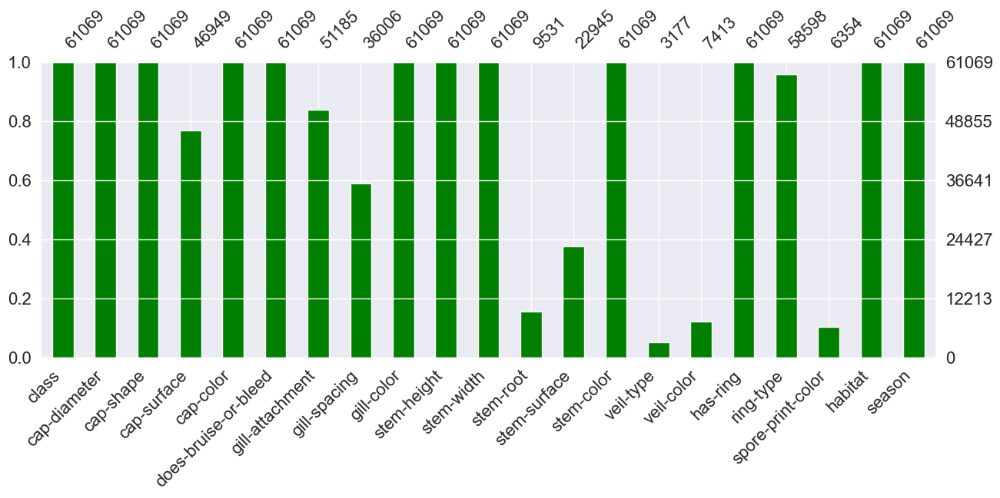

In [24]:
# Visualizing the missing values
missingno.bar(data_1,figsize=(15,5), color="green")

As veil-type, spore-print-color, veil-color, stem-root, stem-surface, gill-spacing are have more than 25% missing value, so these columns are dropped.

cap-surface, gill-attachment, ring-type	attributes have missing values less than 25%, here we can impute mode for missing values.

In [25]:
data_1c = data_1.copy()
data_2c = data_2.copy()

In [26]:
print("Before Imputation")
print("*"*50)
print("*"*50)
print(" "*50)
print(" "*50)
cap_surface_mode = data_1c["cap-surface"].mode()[0]
print(f"The mode in cap-surface : {cap_surface_mode}")
print("*"*50)
gill_attachment_mode = data_1c["gill-attachment"].mode()[0]
print(f"The mode in gill-attachment : {gill_attachment_mode}")
print("*"*50)
ring_type_mode = data_1c["ring-type"].mode()[0]
print(f"The mode in ring-type : {ring_type_mode}")

Before Imputation
**************************************************
**************************************************
                                                  
                                                  
The mode in cap-surface : t
**************************************************
The mode in gill-attachment : a
**************************************************
The mode in ring-type : f


In [27]:
# mode before impution
features_bf_imp = ["cap-surface", "gill-attachment", "ring-type"]
mode = ["t", "a", "f"]
df_data = {"features" : features_bf_imp, "mode" : mode}
df_bf_clt = pd.DataFrame(df_data)
df_bf_clt

,features,mode
0,cap-surface,t
1,gill-attachment,a
2,ring-type,f


In [28]:
# Filling up the NaN values of each feature
data_1c['cap-surface'].fillna(data_1c['cap-surface'].mode()[0], inplace=True)
data_1c['gill-attachment'].fillna(data_1c['gill-attachment'].mode()[0], inplace=True)
data_1c['ring-type'].fillna(data_1c['ring-type'].mode()[0], inplace=True)

In [29]:
print("After Imputation")
print("*"*50)
print("*"*50)
print(" "*50)
print(" "*50)
cap_surface_mode_af = data_1c["cap-surface"].mode()[0]
print(f"The mode in cap-surface : {cap_surface_mode_af}")
print("*"*50)
gill_attachment_mode_af = data_1c["gill-attachment"].mode()[0]
print(f"The mode in gill-attachment : {gill_attachment_mode_af}")
print("*"*50)
ring_type_mode_af = data_1c["ring-type"].mode()[0]
print(f"The mode in ring-type : {ring_type_mode_af}")

After Imputation
**************************************************
**************************************************
                                                  
                                                  
The mode in cap-surface : t
**************************************************
The mode in gill-attachment : a
**************************************************
The mode in ring-type : f


In [30]:
# mode before impution
features_af_imp = ["cap-surface", "gill-attachment", "ring-type"]
mode = ["t", "a", "f"]
df_data = {"features" : features_af_imp, "mode" : mode}
df_af_clt = pd.DataFrame(df_data)
df_af_clt

,features,mode
0,cap-surface,t
1,gill-attachment,a
2,ring-type,f


In [31]:
# Missing Values/Null Values Count

print('Is there any missing value present or not?',data_1.isnull().values.any())
print("-"*50)
missing_percentage = data_1c.isnull().sum()/len(data_1c)*100
missing_percentage_sort = missing_percentage.sort_values(ascending=False)
missing_value_df1 = pd.DataFrame({'missing_count': data_1c.isnull().sum().sort_values(ascending=False),
                                 'missing_percentage': missing_percentage_sort})
print("Null value count in each of the variable: ")
print("-"*50)
missing_value_df1[missing_value_df1.missing_count != 0]

Is there any missing value present or not? True
--------------------------------------------------
Null value count in each of the variable: 
--------------------------------------------------


,missing_count,missing_percentage
veil-type,57892,94.797688
spore-print-color,54715,89.595376
veil-color,53656,87.861272
stem-root,51538,84.393064
stem-surface,38124,62.427746
gill-spacing,25063,41.040462


### For data_2

In [32]:
# Missing Values/Null Values Count

print('Is there any missing value present or not?',data_1.isnull().values.any())
print("-"*50)
missing_percentage = data_2.isnull().sum()/len(data_2)*100
missing_percentage_sort = missing_percentage.sort_values(ascending=False)
missing_value_df2 = pd.DataFrame({'missing_count': data_2.isnull().sum().sort_values(ascending=False),
                                 'missing_percentage': missing_percentage_sort})
print("Null value count in each of the variable: ")
print("-"*50)
missing_value_df2

Is there any missing value present or not? True
--------------------------------------------------
Null value count in each of the variable: 
--------------------------------------------------


,missing_count,missing_percentage
season,173,100.000000
stem-width,173,100.000000
habitat,173,100.000000
Spore-print-color,173,100.000000
ring-type,173,100.000000
has-ring,173,100.000000
veil-color,173,100.000000
veil-type,173,100.000000
stem-color,173,100.000000
gill-spacing,173,100.000000


In [33]:
missing_value_df2[missing_value_df2.missing_count != 0]

,missing_count,missing_percentage
season,173,100.000000
stem-width,173,100.000000
habitat,173,100.000000
Spore-print-color,173,100.000000
ring-type,173,100.000000
has-ring,173,100.000000
veil-color,173,100.000000
veil-type,173,100.000000
stem-color,173,100.000000
gill-spacing,173,100.000000


<Axes: >

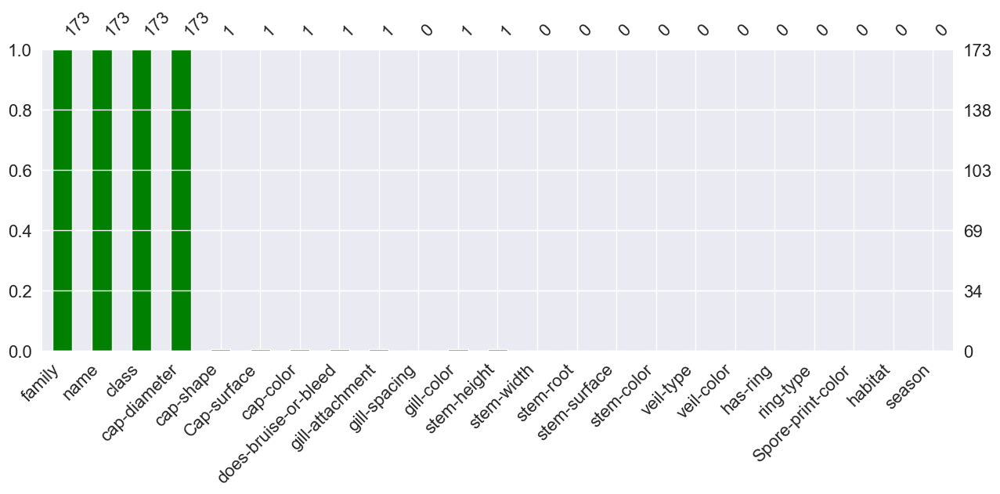

In [34]:
# Visualizing the missing values
missingno.bar(data_2,figsize=(15,5), color="green")

## g) Distribution of Classes

### For data_1

In [35]:
class_count = data_1["class"].value_counts()
print(class_count)
print(f"p : {class_count[0]}, {round(class_count[0]/data_1.shape[0]*100,3)}%")
print(f"e : {class_count[0]}, {round(class_count[1]/data_1.shape[0]*100,3)}%")

class
p    33888
e    27181
Name: count, dtype: int64
p : 33888, 55.491%
e : 33888, 44.509%


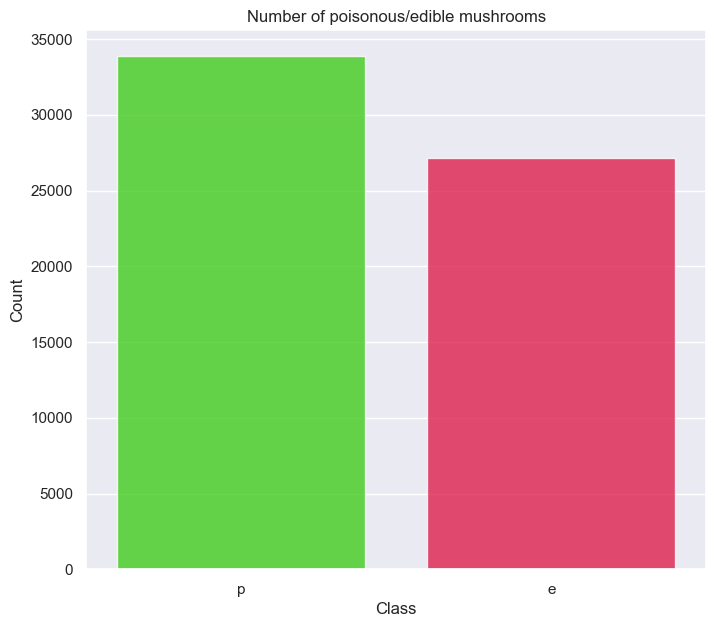

In [36]:
count = data_1['class'].value_counts()
plt.figure(figsize=(8,7))
sns.barplot(x=count.index, y=count.values, alpha=0.8, palette="prism")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Class', fontsize=12)
plt.title('Number of poisonous/edible mushrooms')
#plt.savefig("mushrooms1.png", format='png', dpi=900)
plt.show()

### For data_2

In [37]:
class_count = data_2["class"].value_counts()
print(class_count)
print(f"p : {class_count[0]}, {round(class_count[0]/data_2.shape[0]*100,3)}%")
print(f"e : {class_count[0]}, {round(class_count[1]/data_2.shape[0]*100,3)}%")

class
p    96
e    77
Name: count, dtype: int64
p : 96, 55.491%
e : 96, 44.509%


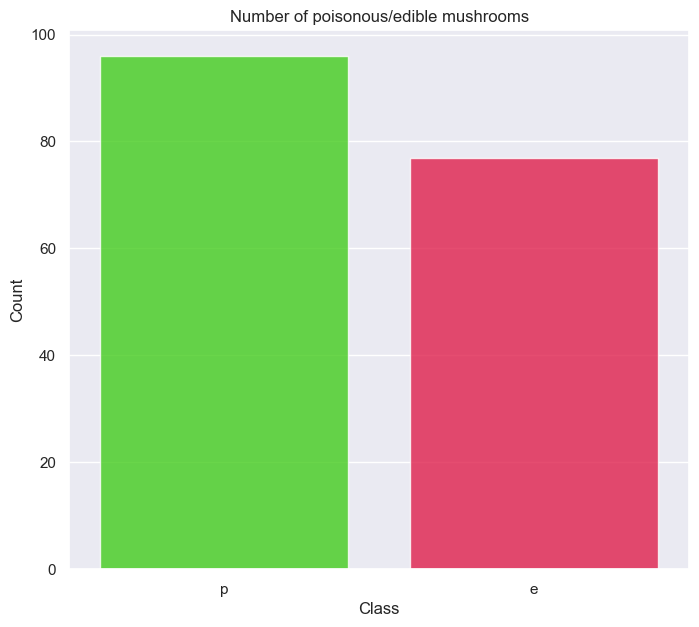

In [38]:
count = data_2['class'].value_counts()
plt.figure(figsize=(8,7))
sns.barplot(x=count.index, y=count.values, alpha=0.8, palette="prism")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Class', fontsize=12)
plt.title('Number of poisonous/edible mushrooms')
#plt.savefig("mushrooms1.png", format='png', dpi=900)
plt.show()

Dataset is balanced.

# Exploratory Data Analysis

In [39]:
data_1d = data_1.copy()
data_1dc = data_1d.copy()
data_1cd = data_1c.copy()

In [40]:
# Function for Univariate Analysis
def Univariate_Analysis1(column_name):
    df_EDA = pd.DataFrame(sorted(list(data_1[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data_1.groupby(column_name)["class"].count())
    df_EDA["% of Total"] = list(data_1[column_name].value_counts()/data_1.shape[0]*100)
    df_EDA['edible'] = list(data_1[data_1["class"]=="e"].groupby(column_name)
                              ["class"].count())
    df_EDA['poisonous'] = list(data_1[data_1["class"]=="p"].groupby(column_name)
                              ["class"].count())
    df_EDA['%edible'] = round(df_EDA['edible']/df_EDA['Total_Count']*100,3)
    df_EDA['%poisonous'] = round(df_EDA['poisonous']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['edible'])
    plt.legend(labels=['Total','edible'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise edible')
    plt.show()
    
    

    return df_EDA

In [41]:
# Function for Univariate Analysis
def Univariate_Analysis1cd(column_name):
    df_EDA = pd.DataFrame(sorted(list(data_1cd[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data_1cd.groupby(column_name)["class"].count())
    df_EDA["% of Total"] = list(data_1cd[column_name].value_counts()/data_1cd.shape[0]*100)
    df_EDA['edible'] = list(data_1cd[data_1cd["class"]=="e"].groupby(column_name)
                              ["class"].count())
    df_EDA['poisonous'] = list(data_1cd[data_1cd["class"]=="p"].groupby(column_name)
                              ["class"].count())
    df_EDA['%edible'] = round(df_EDA['edible']/df_EDA['Total_Count']*100,3)
    df_EDA['%poisonous'] = round(df_EDA['poisonous']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['edible'])
    plt.legend(labels=['Total','edible'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise edible')
    plt.show()
    
    

    return df_EDA

In [42]:
# Function for Univariate Analysis
def Univariate_Analysis1dc(column_name):
    df_EDA = pd.DataFrame(sorted(list(data_1dc[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data_1dc.groupby(column_name)["class"].count())
    df_EDA["% of Total"] = list(data_1dc[column_name].value_counts()/data_1dc.shape[0]*100)
    df_EDA['edible'] = list(data_1dc[data_1dc["class"]=="e"].groupby(column_name)
                              ["class"].count())
    df_EDA['poisonous'] = list(data_1dc[data_1dc["class"]=="p"].groupby(column_name)
                              ["class"].count())
    df_EDA['%edible'] = round(df_EDA['edible']/df_EDA['Total_Count']*100,3)
    df_EDA['%poisonous'] = round(df_EDA['poisonous']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['edible'])
    plt.legend(labels=['Total','edible'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise edible')
    plt.show()
    
    

    return df_EDA

In [43]:
# Function for Univariate Analysis
def Univariate_Analysis2(column_name):
    df_EDA = pd.DataFrame(sorted(list(data_1c[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data_1c.groupby(column_name)["class"].count())
    df_EDA["% of Total"] = list(data_1c[column_name].value_counts()/data_1c.shape[0]*100)
    df_EDA['edible'] = list(data_1c[data_1c["class"]=="e"].groupby(column_name)
                              ["class"].count())
    df_EDA['poisonous'] = list(data_1c[data_1c["class"]=="p"].groupby(column_name)
                              ["class"].count())
    df_EDA['%edible'] = round(df_EDA['edible']/df_EDA['Total_Count']*100,3)
    df_EDA['%poisonous'] = round(df_EDA['poisonous']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['edible'])
    plt.legend(labels=['Total','edible'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise edible')
    plt.show()
    
    

    return df_EDA

In [44]:
# Function for Univariate Analysis
def Univariate_Analysis3(column_name):
    df_EDA = pd.DataFrame(sorted(list(data_2c[column_name].unique())),columns=[column_name])
    df_EDA['Total_Count'] = list(data_2c.groupby(column_name)["class"].count())
    df_EDA["% of Total"] = list(data_2c[column_name].value_counts()/data_2c.shape[0]*100)
    df_EDA['edible'] = list(data_2c[data_2c["class"]=="e"].groupby(column_name)
                              ["class"].count())
    df_EDA['poisonous'] = list(data_2c[data_2c["class"]=="p"].groupby(column_name)
                              ["class"].count())
    df_EDA['%edible'] = round(df_EDA['edible']/df_EDA['Total_Count']*100,3)
    df_EDA['%poisonous'] = round(df_EDA['poisonous']/df_EDA['Total_Count']*100,3)
    df_EDA = df_EDA.sort_values(by='Total_Count', ascending=False)
    
    fig = plt.subplots(figsize =(8, 4))
    plt.barh(df_EDA[column_name],df_EDA['Total_Count'])
    plt.barh(df_EDA[column_name],df_EDA['edible'])
    plt.legend(labels=['Total','edible'])
    plt.xlabel('Counts')
    plt.title(column_name+' wise edible')
    plt.show()
    
    

    return df_EDA

In [45]:
data_1c.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
0,p,15.26,x,g,o,f,e,NaN,w,16.95,17.09,s,y,w,u,w,t,g,NaN,d,w
1,p,16.60,x,g,o,f,e,NaN,w,17.99,18.19,s,y,w,u,w,t,g,NaN,d,u
2,p,14.07,x,g,o,f,e,NaN,w,17.80,17.74,s,y,w,u,w,t,g,NaN,d,w
3,p,14.17,f,h,e,f,e,NaN,w,15.77,15.98,s,y,w,u,w,t,p,NaN,d,w
4,p,14.64,x,h,o,f,e,NaN,w,16.53,17.20,s,y,w,u,w,t,p,NaN,d,w


## Univariate Analysis

### Distribution of each feature

In [46]:
# # Let’s plot the distribution of each feature before Imputation
# import math
# def plot_distribution(dataset, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
#     plt.style.use('seaborn-whitegrid')
#     fig = plt.figure(figsize=(width,height))
#     fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
#     rows = math.ceil(float(dataset.shape[1]) / cols)
#     for i, column in enumerate(dataset.columns):
#         ax = fig.add_subplot(rows, cols, i + 1)
#         ax.set_title(column)
#         if dataset.dtypes[column] == np.object:
#             g = sns.countplot(y=column, data=dataset)
#             substrings = [s.get_text()[:18] for s in g.get_yticklabels()]
#             g.set(yticklabels=substrings)
#             plt.xticks(rotation=25)
#         else:
#             g = sns.distplot(dataset[column])
#             plt.xticks(rotation=25)
    
# plot_distribution(data_1, cols=3, width=20, height=30, hspace=0.45, wspace=0.5)

In [47]:
# mode before impution
features_af_imp = ["cap-surface", "gill-attachment", "ring-type"]
mode = ["t", "a", "f"]
df_data = {"features" : features_af_imp, "mode" : mode}
df_af_clt = pd.DataFrame(df_data)
df_af_clt

,features,mode
0,cap-surface,t
1,gill-attachment,a
2,ring-type,f


In [48]:
# Missing Values/Null Values Count

print('Is there any missing value present or not?',data_1.isnull().values.any())
print("-"*50)
missing_percentage = data_1c.isnull().sum()/len(data_1c)*100
missing_percentage_sort = missing_percentage.sort_values(ascending=False)
missing_value_df1 = pd.DataFrame({'missing_count': data_1c.isnull().sum().sort_values(ascending=False),
                                 'missing_percentage': missing_percentage_sort})
print("Null value count in each of the variable: ")
print("-"*50)
missing_value_df1[missing_value_df1.missing_count != 0]

Is there any missing value present or not? True
--------------------------------------------------
Null value count in each of the variable: 
--------------------------------------------------


,missing_count,missing_percentage
veil-type,57892,94.797688
spore-print-color,54715,89.595376
veil-color,53656,87.861272
stem-root,51538,84.393064
stem-surface,38124,62.427746
gill-spacing,25063,41.040462


In [49]:
# # Let’s plot the distribution of each feature after Imputation
# import math
# def plot_distribution(dataset, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
#     plt.style.use('seaborn-whitegrid')
#     fig = plt.figure(figsize=(width,height))
#     fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
#     rows = math.ceil(float(dataset.shape[1]) / cols)
#     for i, column in enumerate(dataset.columns):
#         ax = fig.add_subplot(rows, cols, i + 1)
#         ax.set_title(column)
#         if dataset.dtypes[column] == np.object:
#             g = sns.countplot(y=column, data=dataset)
#             substrings = [s.get_text()[:18] for s in g.get_yticklabels()]
#             g.set(yticklabels=substrings)
#             plt.xticks(rotation=25)
#         else:
#             g = sns.distplot(dataset[column])
#             plt.xticks(rotation=25)
    
# plot_distribution(data_1c, cols=3, width=20, height=30, hspace=0.45, wspace=0.5)

### cap-diameter

#### For data_1

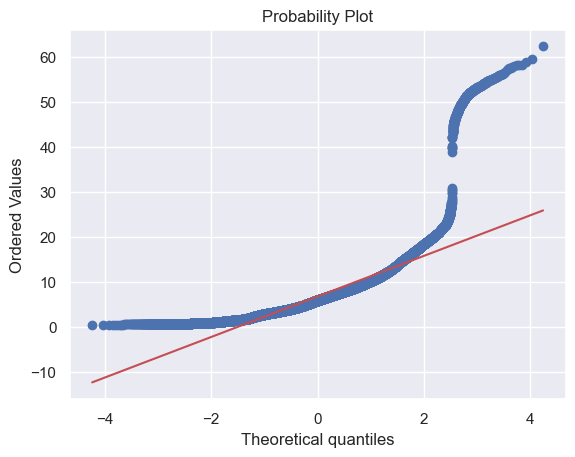

stat=50967.235, p=0.000

probably non gaussian


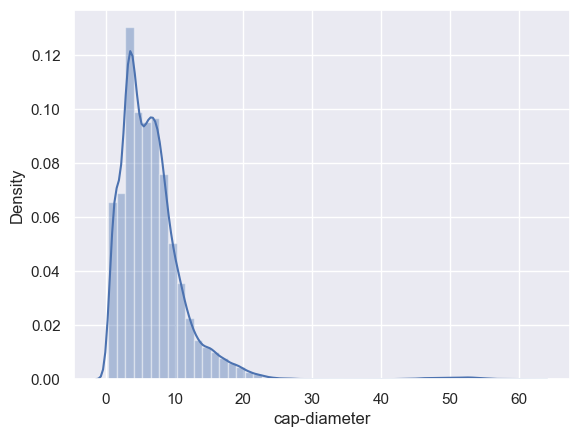

In [50]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = data_1['cap-diameter']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

Text(0.5, 1.0, 'Distribution of cap-diameter')

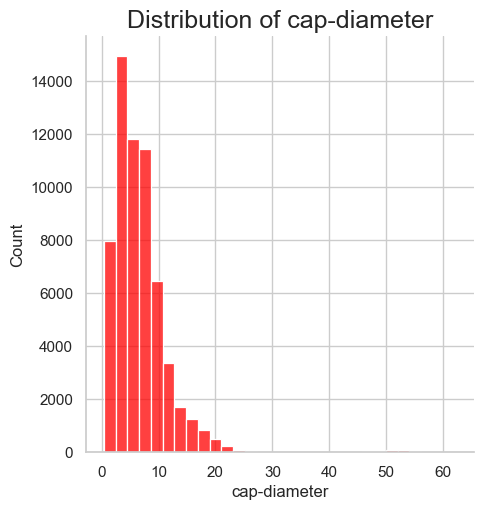

In [51]:
# Distribution of cap-diameter
sns.set_style('whitegrid')
sns.displot(data_1dc["cap-diameter"], kde=False, color='red', bins=30)
plt.title("Distribution of cap-diameter" ,fontsize=18)

Text(0, 0.5, 'stem-height')

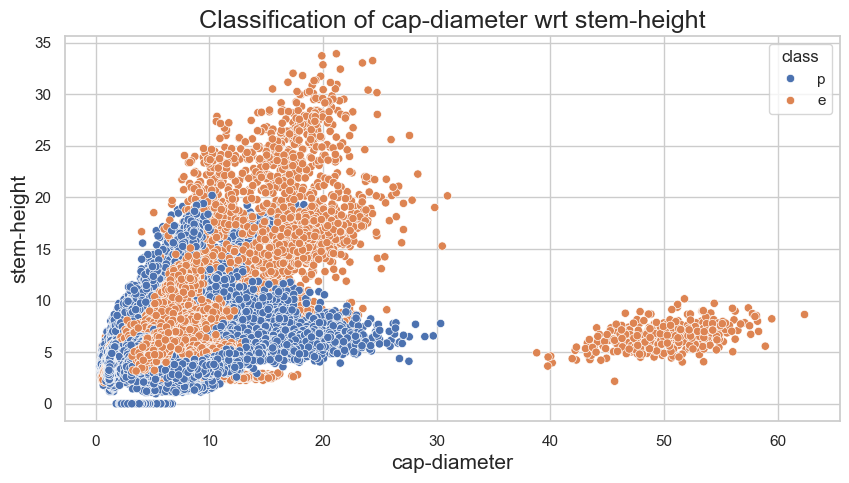

In [52]:

plt.figure(figsize=(10,5))
sns.scatterplot(x = 'cap-diameter', y = 'stem-height', hue = 'class',
               data = data_1c, hue_order = ["p","e"])
plt.title("Classification of cap-diameter wrt stem-height", 
          fontsize=18)
plt.xlabel("cap-diameter", fontsize=15)
plt.ylabel("stem-height", fontsize=15)

Text(0, 0.5, 'stem-width')

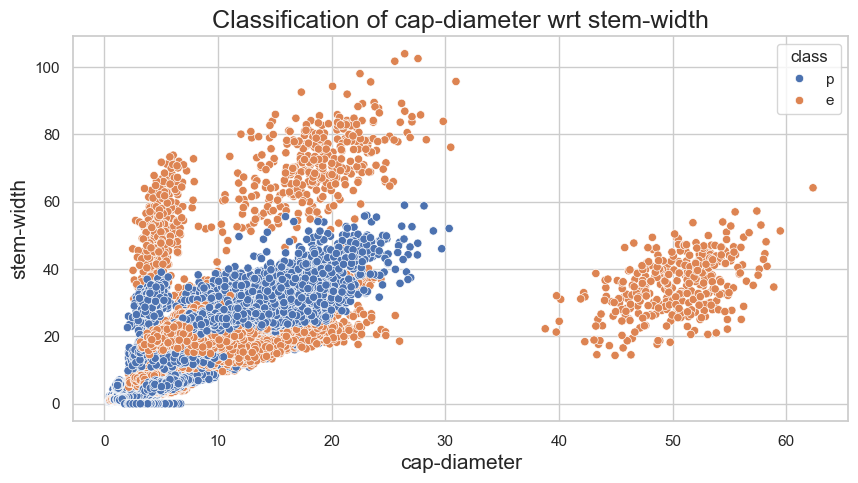

In [53]:
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'cap-diameter', y = 'stem-width', hue = 'class',
               data = data_1, hue_order = ["p","e"])
plt.title("Classification of cap-diameter wrt stem-width", 
          fontsize=18)
plt.xlabel("cap-diameter", fontsize=15)
plt.ylabel("stem-width", fontsize=15)

#### For data_2

In [54]:
data_2c["cap-diameter"] = data_2c["cap-diameter"].str[1]

In [55]:
data_2c["cap-diameter"] = data_2c["cap-diameter"].astype("float")

In [56]:
data_2c.head()

,family,name,class,cap-diameter,cap-shape,Cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,Spore-print-color,habitat,season
0,Amanita Family,Fly Agaric,p,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Amanita Family,Panther Cap,p,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Amanita Family,False Panther Cap,p,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Amanita Family,The Blusher,e,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Amanita Family,Death Cap,p,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


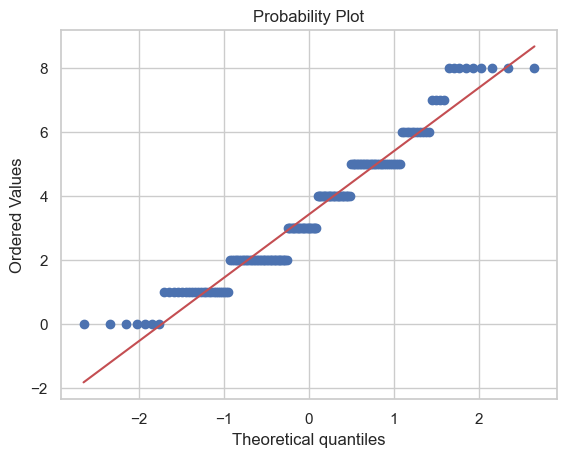

stat=7.418, p=0.024

probably non gaussian


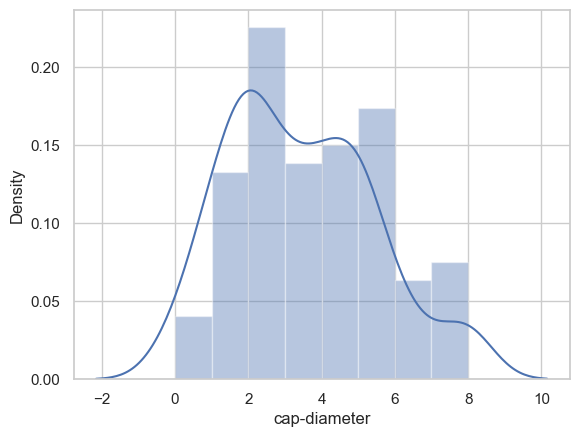

In [57]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = data_2c['cap-diameter']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

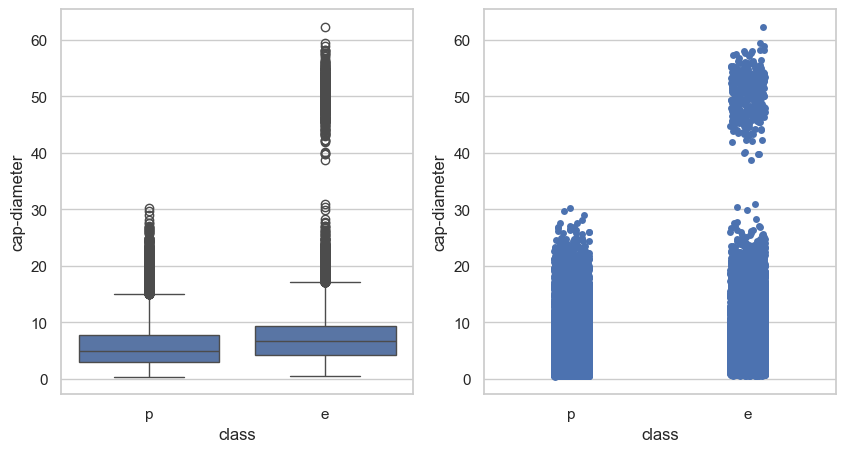

In [58]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
g = sns.boxplot(y="cap-diameter", x="class", data=data_1, ax=ax[0], orient="vertical")
g = sns.stripplot(y="cap-diameter", x="class", data=data_1, ax=ax[1], 
                 orient="vertical")

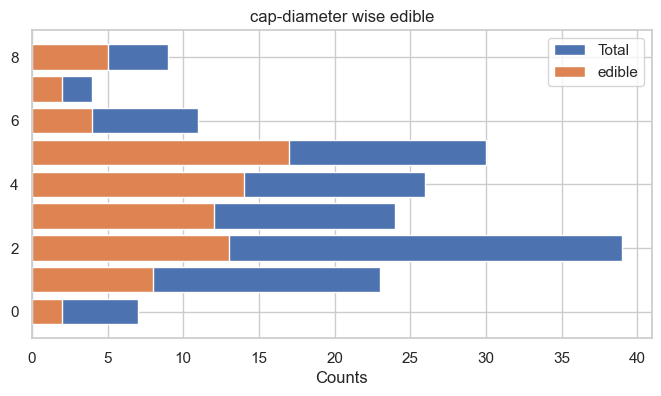

,cap-diameter,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
2,2.0,39,15.028902,13,26,33.333,66.667
5,5.0,30,6.358382,17,13,56.667,43.333
4,4.0,26,13.294798,14,12,53.846,46.154
3,3.0,24,13.872832,12,12,50.000,50.000
1,1.0,23,17.341040,8,15,34.783,65.217
6,6.0,11,5.202312,4,7,36.364,63.636
8,8.0,9,2.312139,5,4,55.556,44.444
0,0.0,7,22.543353,2,5,28.571,71.429
7,7.0,4,4.046243,2,2,50.000,50.000


In [59]:
Univariate_Analysis3("cap-diameter")

In [60]:
data_1.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

### cap-shape

In [61]:
data_1d['cap-shape'] = data_1d['cap-shape']
data_1d.loc[data_1d['cap-shape'] == 'b', 'cap-shape'] = 'bell(b)'
data_1d.loc[data_1d['cap-shape'] == 'c', 'cap-shape'] = 'conical(c)'
data_1d.loc[data_1d['cap-shape'] == 'x', 'cap-shape'] = 'convex(x)'
data_1d.loc[data_1d['cap-shape'] == 'f', 'cap-shape'] = 'flat(f)'
data_1d.loc[data_1d['cap-shape'] == 's', 'cap-shape'] = 'sunken(s)'
data_1d.loc[data_1d['cap-shape'] == 'p', 'cap-shape'] = 'spherical(p)'
data_1d.loc[data_1d['cap-shape'] == 'o', 'cap-shape'] = 'others(o)'


In [62]:
data_1dc = data_1d.copy()

In [63]:
data_1dc.rename(columns = {'cap-shape':'cap_shape'}, inplace = True)
data_1dc.columns

Index(['class', 'cap-diameter', 'cap_shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

cap-shape
convex(x)       26934
flat(f)         13404
sunken(s)        7164
bell(b)          5694
others(o)        3460
spherical(p)     2598
conical(c)       1815
Name: count, dtype: int64
Axes(0.547727,0.201439;0.352273x0.587121)


Text(0.5, 1.0, 'cap-shape ratio Proposanate')

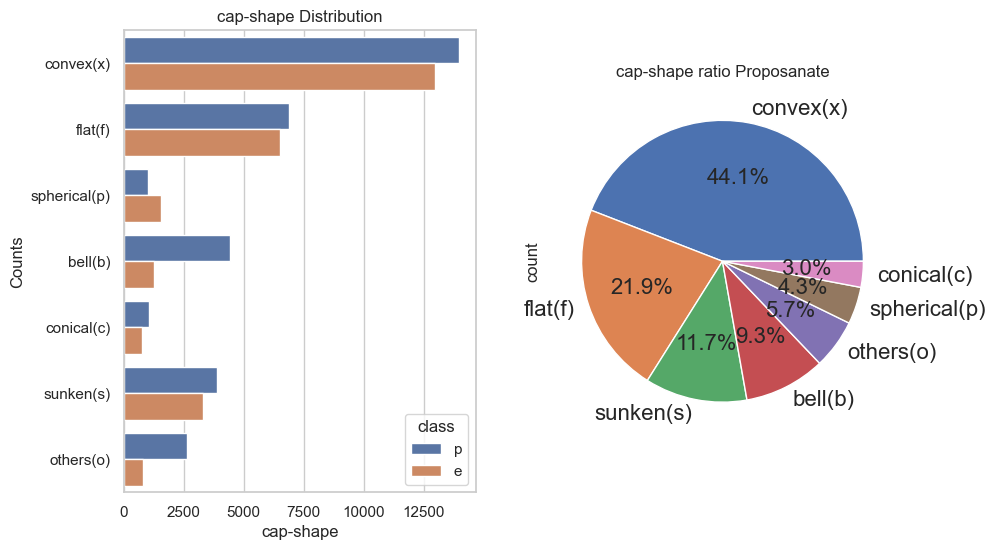

In [64]:
# Distribution of "cap-shape"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="cap-shape", hue="class", data=data_1d)
plt.xlabel('cap-shape')
plt.ylabel('Counts')
plt.title('cap-shape Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1d['cap-shape'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('cap-shape ratio Proposanate')

FEATURE TO BE ANALYSED : cap_shape
['convex(x)' 'flat(f)' 'spherical(p)' 'bell(b)' 'conical(c)' 'sunken(s)'
 'others(o)']
class             e      p
cap_shape                 
bell(b)        1258   4436
conical(c)      774   1041
convex(x)     12960  13974
flat(f)        6502   6902
others(o)       825   2635
spherical(p)   1567   1031
sunken(s)      3295   3869


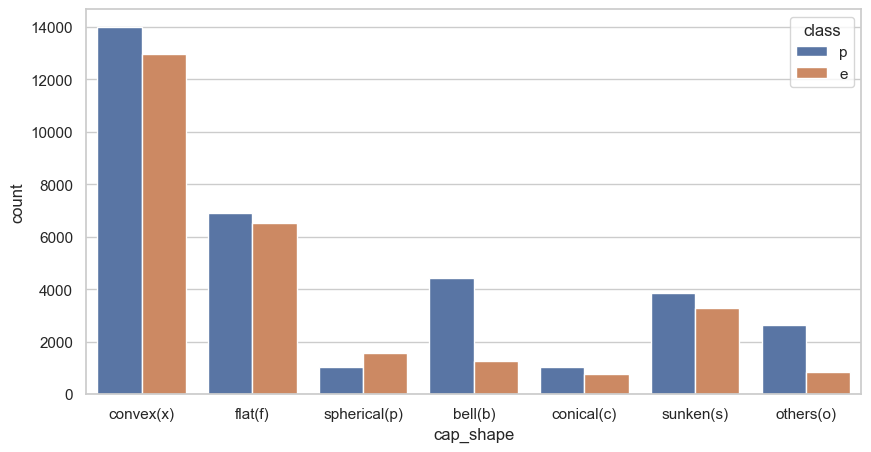

In [65]:
#Exploratory Data Analysis

print('FEATURE TO BE ANALYSED :','cap_shape')
print(data_1dc["cap_shape"].unique())
print(pd.crosstab(index=data_1dc["cap_shape"], columns=data_1dc['class']))
plt.figure(figsize=(10,5))
sns.countplot(x=data_1dc["cap_shape"],hue=data_1dc['class'])
plt.show()

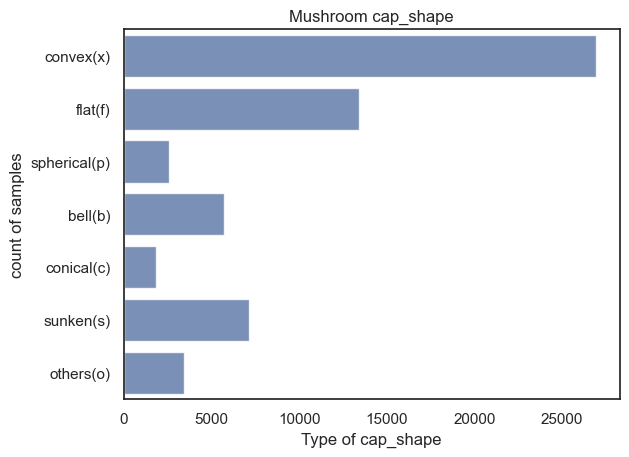

In [66]:

sns.set_style('white')
plt.figure()
sns.countplot(data_1dc["cap_shape"],alpha =.80)
plt.ylabel('count of samples')
plt.title('Mushroom' + ' ' + 'cap_shape')
plt.xlabel('Type of' + ' ' + 'cap_shape')
    

plt.show() 

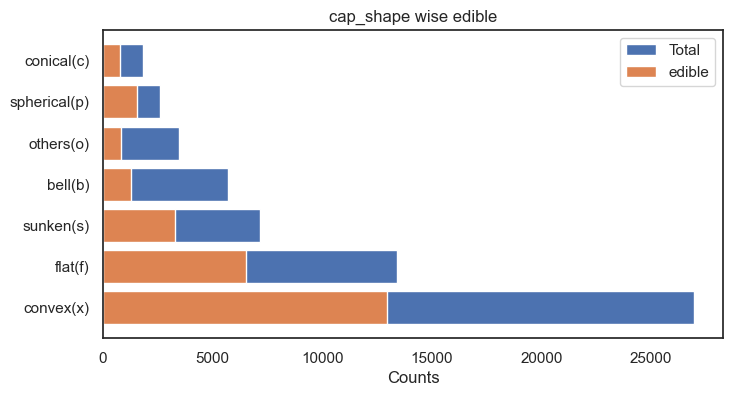

,cap_shape,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
2,convex(x),26934,11.730993,12960,13974,48.118,51.882
3,flat(f),13404,9.323880,6502,6902,48.508,51.492
6,sunken(s),7164,2.972048,3295,3869,45.994,54.006
0,bell(b),5694,44.104210,1258,4436,22.093,77.907
4,others(o),3460,5.665722,825,2635,23.844,76.156
5,spherical(p),2598,4.254204,1567,1031,60.316,39.684
1,conical(c),1815,21.948943,774,1041,42.645,57.355


In [67]:
Univariate_Analysis1dc("cap_shape")

<Axes: xlabel='cap_shape'>

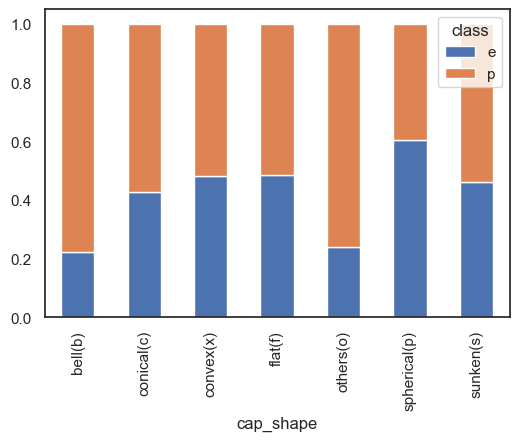

In [68]:

tmp = data_1dc[["class", "cap_shape"]]
tmp["cap_shape"] = tmp["cap_shape"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "cap_shape"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "cap_shape==\""+row["cap_shape"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="cap_shape", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(6,4))

In [69]:
# function for chi suqared test for 2 categorical  variables

def chi_sqred_ind_test(df, col1, col2, alpha=0.05, debug=True, print_result=True):
    contigency_table =  pd.crosstab(df[col1],df[col2],margins = False)
    
    if debug:
        print("Contigency table: \n" , contigency_table)
    stat, p_val, dof, expected_val = chi2_contingency(contigency_table)
    if debug:
        print("Statistic:", stat)
        print("P-value:", p_val)
        print("DOF:", dof)
    critical = chi2.ppf(1-alpha, dof)
    
    if print_result:
        if debug:
            print('probability=%.3f, critical=%.3f, stat=%.3f' % (1-alpha, critical, stat))
        if abs(stat) >= critical:
            print("Dependent (reject Null Hypothesis(H0))")
        else:
            print('Independent (fail to reject Null Hypothesis(H0))')
        if p_val <= alpha:
            print("Dependent (reject Null Hypothesis(H0))")
        else:
            print('Independent (fail to reject Null Hypothesis(H0))')
    return stat, p_val, dof

In [70]:
# Hypothesis testing on "cap_shape" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "cap_shape", "class", 0.05)

Contigency table: 
 class             e      p
cap_shape                 
bell(b)        1258   4436
conical(c)      774   1041
convex(x)     12960  13974
flat(f)        6502   6902
others(o)       825   2635
spherical(p)   1567   1031
sunken(s)      3295   3869
Statistic: 2257.173111831681
P-value: 0.0
DOF: 6
probability=0.950, critical=12.592, stat=2257.173
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### cap-surface

In [71]:
data_1dc.rename(columns = {'cap-surface':'cap_surface'}, inplace = True)
data_1dc.rename(columns = {'cap-color':'cap_color'}, inplace = True)
data_1dc.rename(columns = {'does-bruise-or-bleed':'does_bruise_or_bleed'}, inplace = True)
data_1dc.rename(columns = {'gill-attachment':'gill_attachment'}, inplace = True)
data_1dc.rename(columns = {'gill-spacing':'gill_spacing'}, inplace = True)
data_1dc.rename(columns = {'gill-color':'gill_color'}, inplace = True)
data_1dc.rename(columns = {'stem-height':'stem_height'}, inplace = True)
data_1dc.rename(columns = {'stem-width':'stem_width'}, inplace = True)
data_1dc.rename(columns = {'stem-root':'stem_root'}, inplace = True)
data_1dc.rename(columns = {'stem-surface':'stem_surface'}, inplace = True)
data_1dc.rename(columns = {'stem-color':'stem_color'}, inplace = True)
data_1dc.rename(columns = {'veil-type':'veil_type'}, inplace = True)
data_1dc.rename(columns = {'veil-color':'veil_color'}, inplace = True)
data_1dc.rename(columns = {'has-ring':'has_ring'}, inplace = True)
data_1dc.rename(columns = {'ring-type':'ring_type'}, inplace = True)
data_1dc.rename(columns = {'spore-print-color':'spore_print_color'}, inplace = True)

In [72]:
data_1cd.rename(columns = {'cap-surface':'cap_surface'}, inplace = True)
data_1cd.rename(columns = {'gill-attachment':'gill_attachment'}, inplace = True)
data_1cd.rename(columns = {'ring-type':'ring_type'}, inplace = True)

In [73]:
data_1cd.loc[data_1cd["cap_surface"] == "i", "cap_surface"] = "fibrous(i)"
data_1cd.loc[data_1cd["cap_surface"] == "g", "cap_surface"] = "grooves(g)"
data_1cd.loc[data_1cd["cap_surface"] == "y", "cap_surface"] = "scaly(y)"
data_1cd.loc[data_1cd["cap_surface"] == "s", "cap_surface"] = "smooth(s)"
data_1cd.loc[data_1cd["cap_surface"] == "h", "cap_surface"] = "shiny(h)"
data_1cd.loc[data_1cd["cap_surface"] == "l", "cap_surface"] = "leathery(l)"
data_1cd.loc[data_1cd["cap_surface"] == "k", "cap_surface"] = "silky(k)"
data_1cd.loc[data_1cd["cap_surface"] == "t", "cap_surface"] = "sticky(t)"
data_1cd.loc[data_1cd["cap_surface"] == "w", "cap_surface"] = "wrinkled(w)"
data_1cd.loc[data_1cd["cap_surface"] == "e", "cap_surface"] = "fleshy(e)"

In [74]:
data_1dc.loc[data_1dc["cap_surface"] == "i", "cap_surface"] = "fibrous(i)"
data_1dc.loc[data_1dc["cap_surface"] == "g", "cap_surface"] = "grooves(g)"
data_1dc.loc[data_1dc["cap_surface"] == "y", "cap_surface"] = "scaly(y)"
data_1dc.loc[data_1dc["cap_surface"] == "s", "cap_surface"] = "smooth(s)"
data_1dc.loc[data_1dc["cap_surface"] == "h", "cap_surface"] = "shiny(h)"
data_1dc.loc[data_1dc["cap_surface"] == "l", "cap_surface"] = "leathery(l)"
data_1dc.loc[data_1dc["cap_surface"] == "k", "cap_surface"] = "silky(k)"
data_1dc.loc[data_1dc["cap_surface"] == "t", "cap_surface"] = "sticky(t)"
data_1dc.loc[data_1dc["cap_surface"] == "w", "cap_surface"] = "wrinkled(w)"
data_1dc.loc[data_1dc["cap_surface"] == "e", "cap_surface"] = "fleshy(e)"

##### Distribution of "cap-surface" before imputation

cap_surface
sticky(t)      8196
smooth(s)      7608
scaly(y)       6341
shiny(h)       4974
grooves(g)     4724
d              4432
fleshy(e)      2584
silky(k)       2303
fibrous(i)     2225
wrinkled(w)    2150
leathery(l)    1412
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'cap-surface ratio Proposanate')

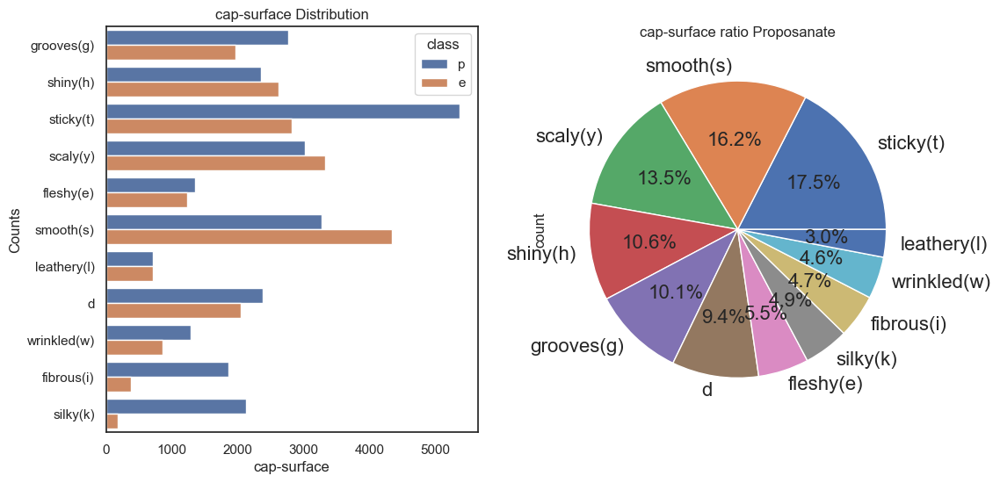

In [75]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="cap_surface", hue="class", data=data_1dc)
plt.xlabel('cap-surface')
plt.ylabel('Counts')
plt.title('cap-surface Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['cap_surface'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('cap-surface ratio Proposanate')

<Axes: xlabel='cap_surface'>

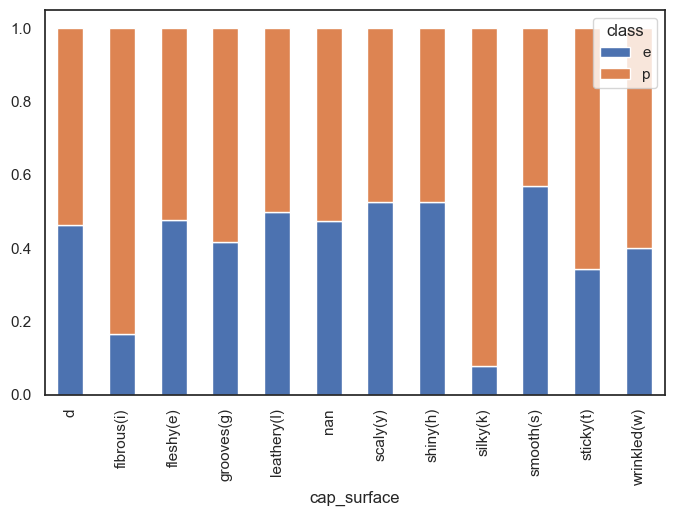

In [76]:

tmp = data_1dc[["class", "cap_surface"]]
tmp["cap_surface"] = tmp["cap_surface"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "cap_surface"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "cap_surface==\""+row["cap_surface"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="cap_surface", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [77]:
# Hypothesis testing on "cap_shape" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "cap_surface", "class", 0.05)

Contigency table: 
 class           e     p
cap_surface            
d            2049  2383
fibrous(i)    369  1856
fleshy(e)    1236  1348
grooves(g)   1964  2760
leathery(l)   706   706
scaly(y)     3329  3012
shiny(h)     2617  2357
silky(k)      181  2122
smooth(s)    4338  3270
sticky(t)    2823  5373
wrinkled(w)   862  1288
Statistic: 3135.15865032641
P-value: 0.0
DOF: 10
probability=0.950, critical=18.307, stat=3135.159
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


##### Distribution of "cap-shape" after imputation

cap_surface
sticky(t)      22316
smooth(s)       7608
scaly(y)        6341
shiny(h)        4974
grooves(g)      4724
d               4432
fleshy(e)       2584
silky(k)        2303
fibrous(i)      2225
wrinkled(w)     2150
leathery(l)     1412
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'cap-surface ratio Proposanate')

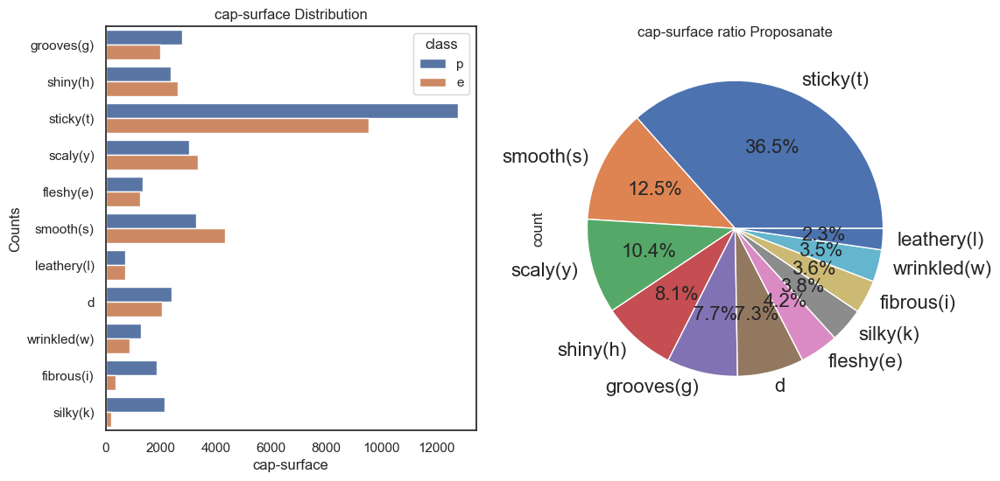

In [78]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="cap_surface", hue="class", data=data_1cd)
plt.xlabel('cap-surface')
plt.ylabel('Counts')
plt.title('cap-surface Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1cd['cap_surface'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('cap-surface ratio Proposanate')

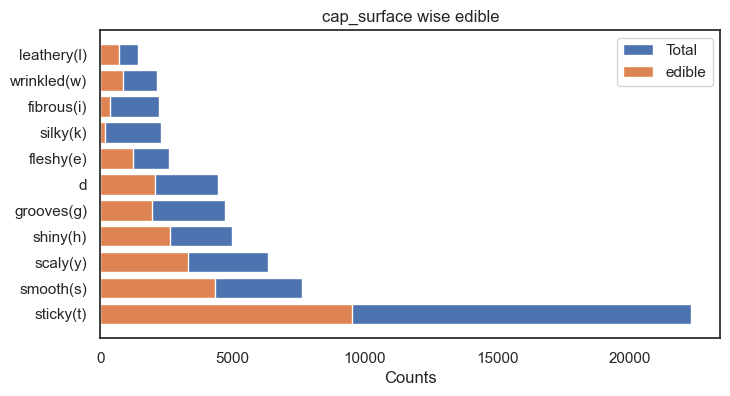

,cap_surface,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
9,sticky(t),22316,3.520608,9530,12786,42.705,57.295
8,smooth(s),7608,3.643420,4338,3270,57.019,42.981
5,scaly(y),6341,7.257365,3329,3012,52.500,47.500
6,shiny(h),4974,4.231279,2617,2357,52.614,47.386
3,grooves(g),4724,8.144885,1964,2760,41.575,58.425
0,d,4432,36.542272,2049,2383,46.232,53.768
2,fleshy(e),2584,10.383337,1236,1348,47.833,52.167
7,silky(k),2303,3.771144,181,2122,7.859,92.141
1,fibrous(i),2225,12.458039,369,1856,16.584,83.416
10,wrinkled(w),2150,2.312139,862,1288,40.093,59.907


In [79]:
Univariate_Analysis1cd("cap_surface")

<Axes: xlabel='cap_surface'>

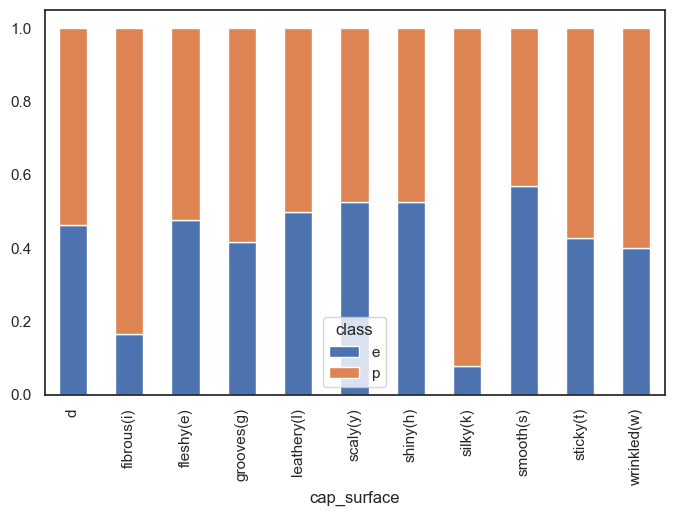

In [80]:

tmp = data_1cd[["class", "cap_surface"]]
tmp["cap_surface"] = tmp["cap_surface"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "cap_surface"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "cap_surface==\""+row["cap_surface"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="cap_surface", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [81]:
data_1cd.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap_surface', 'cap-color',
       'does-bruise-or-bleed', 'gill_attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring_type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

In [82]:
# Hypothesis testing on "cap_shape" column
stat, p_val, dof = chi_sqred_ind_test(data_1cd, "cap_surface", "class", 0.05)

Contigency table: 
 class           e      p
cap_surface             
d            2049   2383
fibrous(i)    369   1856
fleshy(e)    1236   1348
grooves(g)   1964   2760
leathery(l)   706    706
scaly(y)     3329   3012
shiny(h)     2617   2357
silky(k)      181   2122
smooth(s)    4338   3270
sticky(t)    9530  12786
wrinkled(w)   862   1288
Statistic: 2830.2022056922447
P-value: 0.0
DOF: 10
probability=0.950, critical=18.307, stat=2830.202
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### cap-color

In [83]:
data_1dc.loc[data_1dc["cap_color"] == "n", "cap_color"] = "brown(n)"
data_1dc.loc[data_1dc["cap_color"] == "b", "cap_color"] = "buff(b)"
data_1dc.loc[data_1dc["cap_color"] == "g", "cap_color"] = "gray(g)"
data_1dc.loc[data_1dc["cap_color"] == "r", "cap_color"] = "green(r)"
data_1dc.loc[data_1dc["cap_color"] == "p", "cap_color"] = "pink(p)"
data_1dc.loc[data_1dc["cap_color"] == "u", "cap_color"] = "purple(u)"
data_1dc.loc[data_1dc["cap_color"] == "e", "cap_color"] = "red(e)"
data_1dc.loc[data_1dc["cap_color"] == "w", "cap_color"] = "white(w)"
data_1dc.loc[data_1dc["cap_color"] == "y", "cap_color"] = "yellow(y)"
data_1dc.loc[data_1dc["cap_color"] == "l", "cap_color"] = "blue(l)"
data_1dc.loc[data_1dc["cap_color"] == "o", "cap_color"] = "orange(o)"
data_1dc.loc[data_1dc["cap_color"] == "k", "cap_color"] = "black(k)"

##### distribution of cap-color

cap_color
brown(n)     24218
yellow(y)     8543
white(w)      7666
gray(g)       4420
red(e)        4035
orange(o)     3656
green(r)      1782
purple(u)     1709
pink(p)       1703
black(k)      1279
buff(b)       1230
blue(l)        828
Name: count, dtype: int64
Axes(0.547727,0.186761;0.352273x0.616477)


Text(0.5, 1.0, 'cap-color ratio Proposanate')

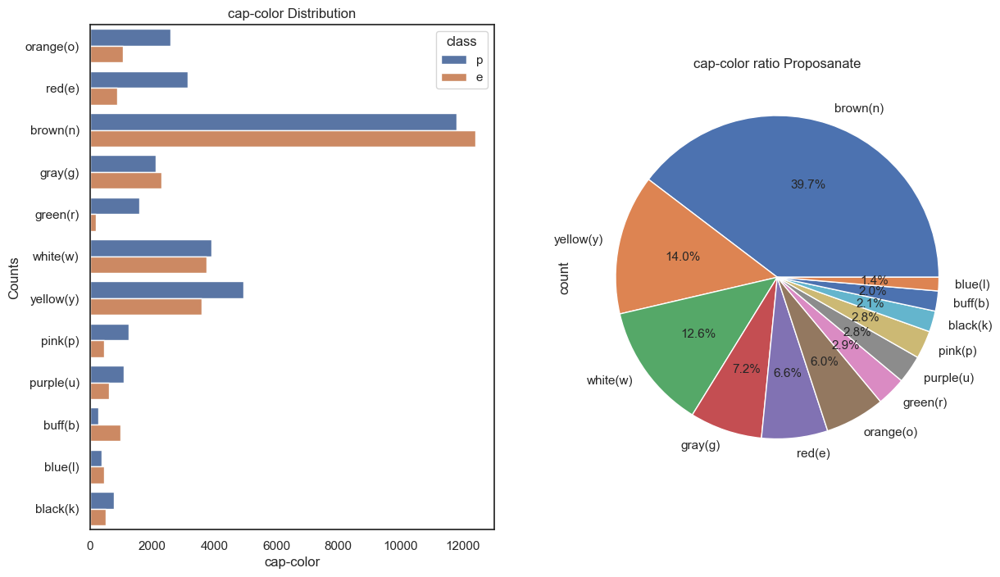

In [84]:
fig, ax = plt.subplots(1,2,figsize=(14,8))
ax1=plt.subplot(1,2,1)
sns.countplot(y="cap_color", hue="class", data=data_1dc)
plt.xlabel('cap-color')
plt.ylabel('Counts')
plt.title('cap-color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['cap_color'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 11))
plt.title('cap-color ratio Proposanate')

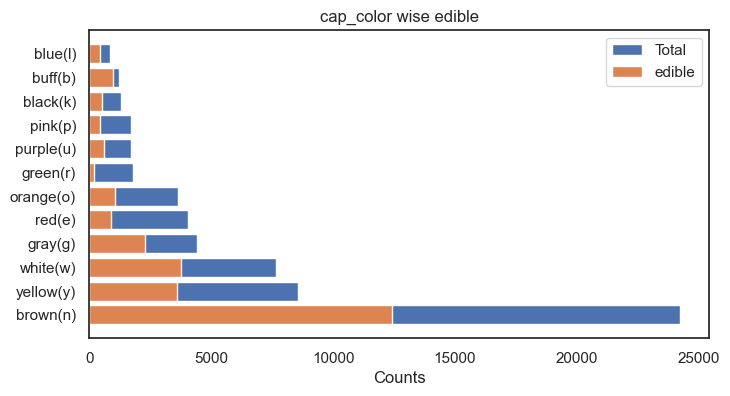

,cap_color,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
2,brown(n),24218,12.553014,12407,11811,51.230,48.770
11,yellow(y),8543,1.355843,3591,4952,42.034,57.966
10,white(w),7666,2.014115,3750,3916,48.917,51.083
4,gray(g),4420,6.607280,2297,2123,51.968,48.032
9,red(e),4035,2.094352,880,3155,21.809,78.191
6,orange(o),3656,2.918011,1071,2585,29.294,70.706
5,green(r),1782,5.986671,198,1584,11.111,88.889
8,purple(u),1709,2.788649,611,1098,35.752,64.248
7,pink(p),1703,2.798474,449,1254,26.365,73.635
0,black(k),1279,39.656782,501,778,39.171,60.829


In [85]:
Univariate_Analysis1dc("cap_color")

<Axes: xlabel='cap_color'>

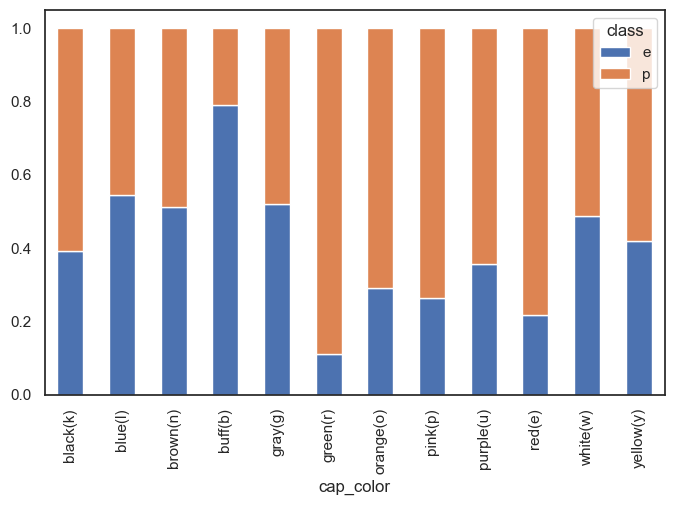

In [86]:

tmp = data_1dc[["class", "cap_color"]]
tmp["cap_color"] = tmp["cap_color"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "cap_color"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "cap_color==\""+row["cap_color"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="cap_color", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [87]:
# Hypothesis testing on "cap_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "cap_color", "class", 0.05)

Contigency table: 
 class          e      p
cap_color              
black(k)     501    778
blue(l)      452    376
brown(n)   12407  11811
buff(b)      974    256
gray(g)     2297   2123
green(r)     198   1584
orange(o)   1071   2585
pink(p)      449   1254
purple(u)    611   1098
red(e)       880   3155
white(w)    3750   3916
yellow(y)   3591   4952
Statistic: 3541.0798182753774
P-value: 0.0
DOF: 11
probability=0.950, critical=19.675, stat=3541.080
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### does-bruise-or-bleed

In [88]:
data_1dc.loc[data_1dc['does_bruise_or_bleed'] == 't', 'does_bruise_or_bleed'] = 'yes(t)'
data_1dc.loc[data_1dc['does_bruise_or_bleed'] == 'f', 'does_bruise_or_bleed'] = 'no(f)'

In [89]:
data_1dc.columns

Index(['class', 'cap-diameter', 'cap_shape', 'cap_surface', 'cap_color',
       'does_bruise_or_bleed', 'gill_attachment', 'gill_spacing', 'gill_color',
       'stem_height', 'stem_width', 'stem_root', 'stem_surface', 'stem_color',
       'veil_type', 'veil_color', 'has_ring', 'ring_type', 'spore_print_color',
       'habitat', 'season'],
      dtype='object')

In [90]:
data_1dc.loc[data_1dc["cap_color"] == "n", "cap_color"] = "brown(n)"
data_1dc.loc[data_1dc["cap_color"] == "b", "cap_color"] = "buff(b)"
data_1dc.loc[data_1dc["cap_color"] == "g", "cap_color"] = "gray(g)"
data_1dc.loc[data_1dc["cap_color"] == "r", "cap_color"] = "green(r)"
data_1dc.loc[data_1dc["cap_color"] == "p", "cap_color"] = "pink(p)"
data_1dc.loc[data_1dc["cap_color"] == "u", "cap_color"] = "purple(u)"
data_1dc.loc[data_1dc["cap_color"] == "e", "cap_color"] = "red(e)"
data_1dc.loc[data_1dc["cap_color"] == "w", "cap_color"] = "white(w)"
data_1dc.loc[data_1dc["cap_color"] == "y", "cap_color"] = "yellow(y)"
data_1dc.loc[data_1dc["cap_color"] == "l", "cap_color"] = "blue(l)"
data_1dc.loc[data_1dc["cap_color"] == "o", "cap_color"] = "orange(o)"
data_1dc.loc[data_1dc["cap_color"] == "k", "cap_color"] = "black(k)"

does_bruise_or_bleed
no(f)     50479
yes(t)    10590
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'does_bruise_or_bleed ratio Proposanate')

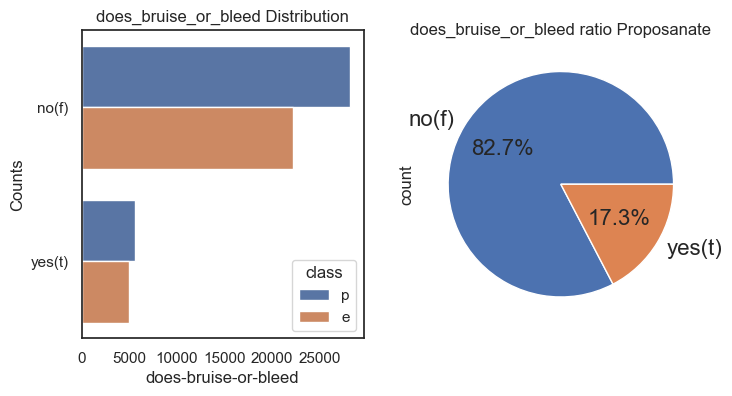

In [91]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax1=plt.subplot(1,2,1)
sns.countplot(y="does_bruise_or_bleed", hue="class", data=data_1dc)
plt.xlabel('does-bruise-or-bleed')
plt.ylabel('Counts')
plt.title('does_bruise_or_bleed Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['does_bruise_or_bleed'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('does_bruise_or_bleed ratio Proposanate')

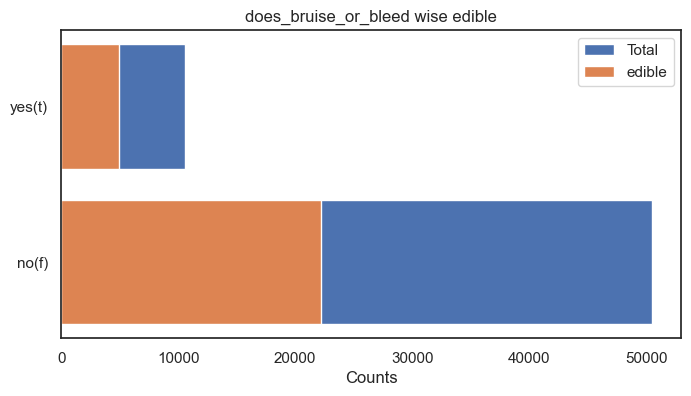

,does_bruise_or_bleed,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
0,no(f),50479,82.65896,22239,28240,44.056,55.944
1,yes(t),10590,17.34104,4942,5648,46.667,53.333


In [92]:
Univariate_Analysis1dc("does_bruise_or_bleed")

<Axes: xlabel='does_bruise_or_bleed'>

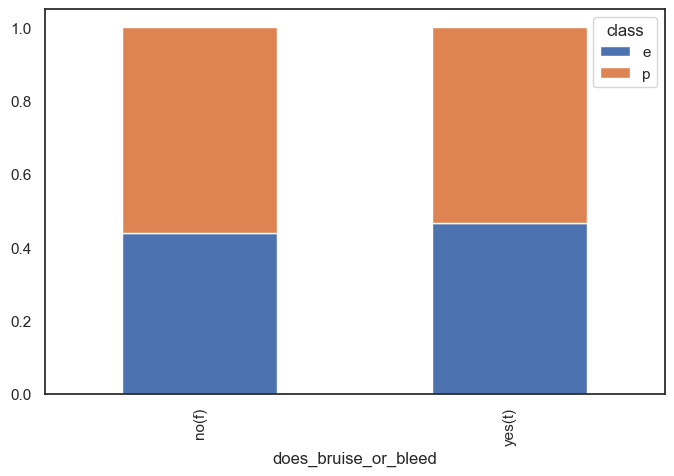

In [93]:

tmp = data_1dc[["class", "does_bruise_or_bleed"]]
tmp["does_bruise_or_bleed"] = tmp["does_bruise_or_bleed"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "does_bruise_or_bleed"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "does_bruise_or_bleed==\""+row["does_bruise_or_bleed"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="does_bruise_or_bleed", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [94]:
# plt.style.use('seaborn-whitegrid')
# fig = plt.figure(figsize=(6,4)) 
# sns.set_context("poster", font_scale=0.8, rc={"lines.linewidth": 2.5})
# g = sns.countplot(y="does_bruise_or_bleed", data=data_1dc, palette="Set2");

In [95]:
# Hypothesis testing on "does_bruise_or_bleed" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "does_bruise_or_bleed", "class", 0.05)

Contigency table: 
 class                     e      p
does_bruise_or_bleed              
no(f)                 22239  28240
yes(t)                 4942   5648
Statistic: 24.051111607407186
P-value: 9.381208881872168e-07
DOF: 1
probability=0.950, critical=3.841, stat=24.051
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### gill-attachment

In [96]:
data_1dc.loc[data_1dc['does_bruise_or_bleed'] == 't', 'Bruises_or_Bleeding'] = 'Bruises_or_Bleeding(t)'
data_1dc.loc[data_1dc['does_bruise_or_bleed'] == 'f', 'no_Bruises_or_Bleeding'] = 'no_Bruises_or_Bleeding(f)'

In [97]:
data_1dc.loc[data_1dc["gill_attachment"] == "a", "gill_attachment"] = "adnate(a)"
data_1dc.loc[data_1dc["gill_attachment"] == "x", "gill_attachment"] = "adnexed(x)"
data_1dc.loc[data_1dc["gill_attachment"] == "d", "gill_attachment"] = "decurrent(d)"
data_1dc.loc[data_1dc["gill_attachment"] == "e", "gill_attachment"] = "free(e)"
data_1dc.loc[data_1dc["gill_attachment"] == "s", "gill_attachment"] = "sinuate(s)"
data_1dc.loc[data_1dc["gill_attachment"] == "p", "gill_attachment"] = "pores(p)"
data_1dc.loc[data_1dc["gill_attachment"] == "f", "gill_attachment"] = "none(f)"

In [98]:
data_1cd.loc[data_1cd["gill_attachment"] == "a", "gill_attachment"] = "adnate(a)"
data_1cd.loc[data_1cd["gill_attachment"] == "x", "gill_attachment"] = "adnexed(x)"
data_1cd.loc[data_1cd["gill_attachment"] == "d", "gill_attachment"] = "decurrent(d)"
data_1cd.loc[data_1cd["gill_attachment"] == "e", "gill_attachment"] = "free(e)"
data_1cd.loc[data_1cd["gill_attachment"] == "s", "gill_attachment"] = "sinuate(s)"
data_1cd.loc[data_1cd["gill_attachment"] == "p", "gill_attachment"] = "pores(p)"
data_1cd.loc[data_1cd["gill_attachment"] == "f", "gill_attachment"] = "none(f)"

##### Distribution of gill-attachment before imputation

gill_attachment
adnate(a)       12698
decurrent(d)    10247
adnexed(x)       7413
pores(p)         6001
free(e)          5648
sinuate(s)       5648
none(f)          3530
Name: count, dtype: int64
Axes(0.59553,0.11;0.256667x0.77)


Text(0.5, 1.0, 'gill-attachment ratio Proposanate')

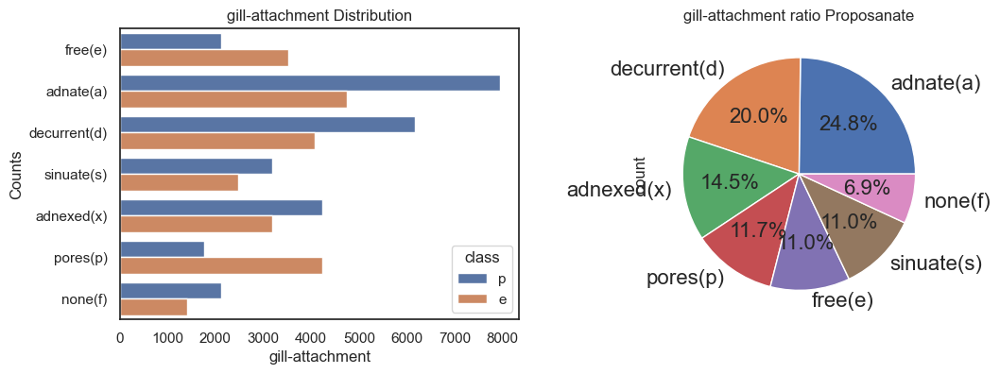

In [99]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax1=plt.subplot(1,2,1)
sns.countplot(y="gill_attachment", hue="class", data=data_1dc)
plt.xlabel('gill-attachment')
plt.ylabel('Counts')
plt.title('gill-attachment Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['gill_attachment'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('gill-attachment ratio Proposanate')

<Axes: xlabel='gill_attachment'>

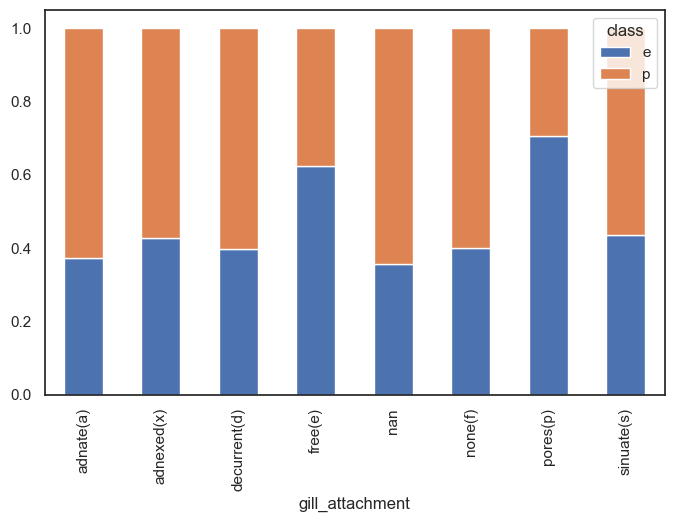

In [100]:

tmp = data_1dc[["class", "gill_attachment"]]
tmp["gill_attachment"] = tmp["gill_attachment"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "gill_attachment"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "gill_attachment==\""+row["gill_attachment"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="gill_attachment", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [101]:
# Hypothesis testing on "does_bruise_or_bleed" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "gill_attachment", "class", 0.05)

Contigency table: 
 class               e     p
gill_attachment            
adnate(a)        4745  7953
adnexed(x)       3177  4236
decurrent(d)     4080  6167
free(e)          3530  2118
none(f)          1412  2118
pores(p)         4236  1765
sinuate(s)       2471  3177
Statistic: 2707.738416445143
P-value: 0.0
DOF: 6
probability=0.950, critical=12.592, stat=2707.738
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


##### Distribution of gill-attachment after imputation

gill_attachment
adnate(a)       22582
decurrent(d)    10247
adnexed(x)       7413
pores(p)         6001
free(e)          5648
sinuate(s)       5648
none(f)          3530
Name: count, dtype: int64
Axes(0.547727,0.201439;0.352273x0.587121)


Text(0.5, 1.0, 'gill-attachment ratio Proposanate')

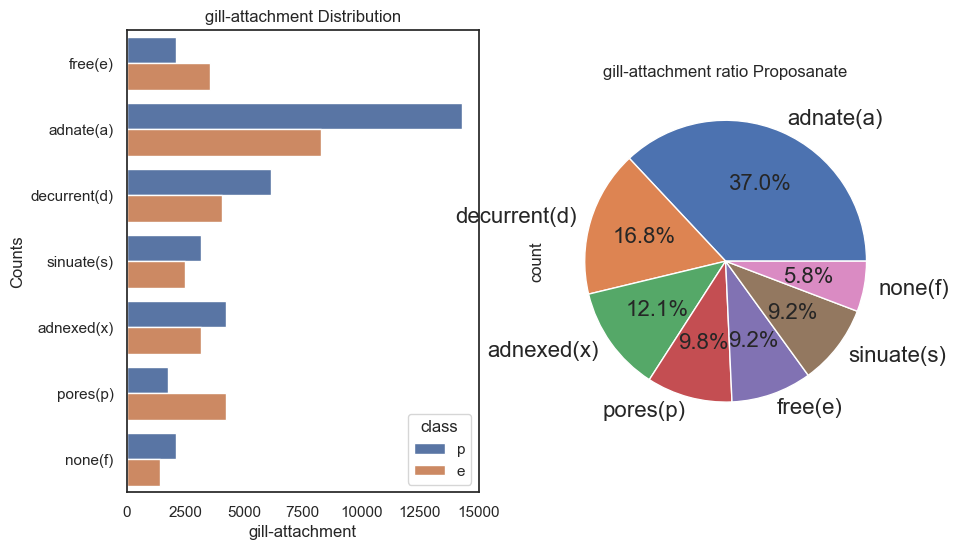

In [102]:
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="gill_attachment", hue="class", data=data_1cd)
plt.xlabel('gill-attachment')
plt.ylabel('Counts')
plt.title('gill-attachment Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1cd['gill_attachment'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('gill-attachment ratio Proposanate')

<Axes: xlabel='gill_attachment'>

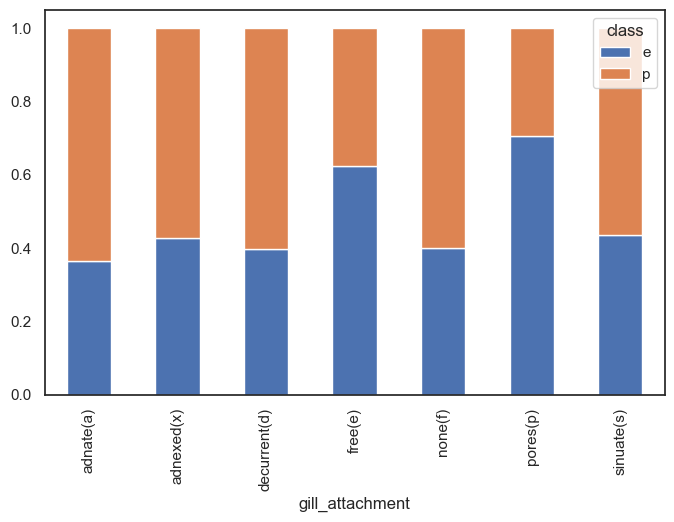

In [103]:

tmp = data_1cd[["class", "gill_attachment"]]
tmp["gill_attachment"] = tmp["gill_attachment"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "gill_attachment"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "gill_attachment==\""+row["gill_attachment"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="gill_attachment", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [104]:
# Hypothesis testing on "does_bruise_or_bleed" column
stat, p_val, dof = chi_sqred_ind_test(data_1cd, "gill_attachment", "class", 0.05)

Contigency table: 
 class               e      p
gill_attachment             
adnate(a)        8275  14307
adnexed(x)       3177   4236
decurrent(d)     4080   6167
free(e)          3530   2118
none(f)          1412   2118
pores(p)         4236   1765
sinuate(s)       2471   3177
Statistic: 3088.146286282159
P-value: 0.0
DOF: 6
probability=0.950, critical=12.592, stat=3088.146
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### gill-spacing

In [105]:
data_1dc.loc[data_1dc['gill_spacing'] == 'c', 'gill_spacing'] = 'close(c)'
data_1dc.loc[data_1dc['gill_spacing'] == 'd', 'gill_spacing'] = 'distant(d)'
data_1dc.loc[data_1dc['gill_spacing'] == 'f', 'gill_spacing'] = 'none(f)'

gill_spacing
close(c)      24710
distant(d)     7766
none(f)        3530
Name: count, dtype: int64
Axes(0.547727,0.213182;0.352273x0.563636)


Text(0.5, 1.0, 'gill-spacing ratio Proposanate')

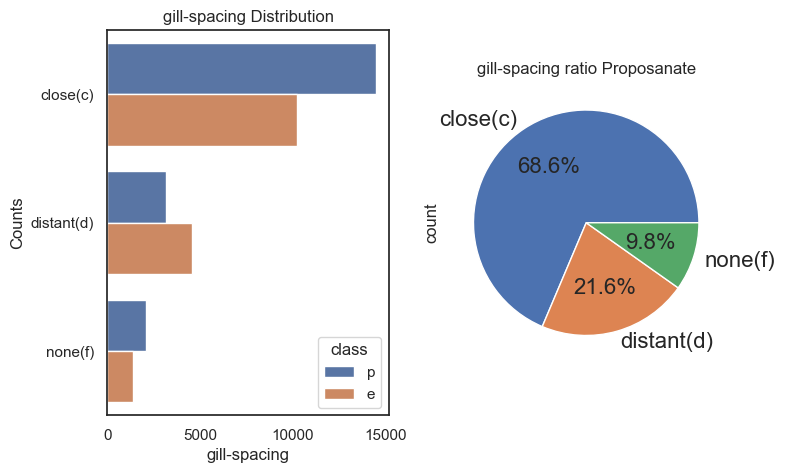

In [106]:
# Distribution of "gill_spacing"
fig, ax = plt.subplots(1,2,figsize=(8,5))
ax1=plt.subplot(1,2,1)
sns.countplot(y="gill_spacing", hue="class", data=data_1dc)
plt.xlabel('gill-spacing')
plt.ylabel('Counts')
plt.title('gill-spacing Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['gill_spacing'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('gill-spacing ratio Proposanate')

<Axes: xlabel='gill_spacing'>

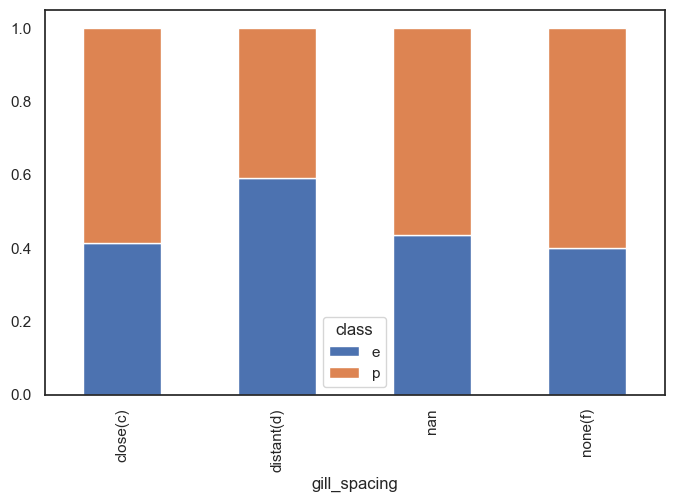

In [107]:

tmp = data_1dc[["class", "gill_spacing"]]
tmp["gill_spacing"] = tmp["gill_spacing"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "gill_spacing"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "gill_spacing==\""+row["gill_spacing"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="gill_spacing", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [108]:
# Hypothesis testing on "gill_spacing" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "gill_spacing", "class", 0.05)

Contigency table: 
 class             e      p
gill_spacing              
close(c)      10237  14473
distant(d)     4589   3177
none(f)        1412   2118
Statistic: 785.5709324836655
P-value: 2.6027918571799056e-171
DOF: 2
probability=0.950, critical=5.991, stat=785.571
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### gill-color

In [109]:
data_1dc['gill_color'] = data_1dc['gill_color']
data_1dc.loc[data_1dc['gill_color'] == 'k', 'gill_color'] = 'black(k)'
data_1dc.loc[data_1dc['gill_color'] == 'n', 'gill_color'] = 'brown(n)'
data_1dc.loc[data_1dc['gill_color'] == 'b', 'gill_color'] = 'buff(b)'
data_1dc.loc[data_1dc['gill_color'] == 'w', 'gill_color'] = 'white(e)'
data_1dc.loc[data_1dc['gill_color'] == 'g', 'gill_color'] = 'gray(g)'
data_1dc.loc[data_1dc['gill_color'] == 'r', 'gill_color'] = 'green(r)'
data_1dc.loc[data_1dc['gill_color'] == 'o', 'gill_color'] = 'orange(o)'
data_1dc.loc[data_1dc['gill_color'] == 'p', 'gill_color'] = 'pink(p)'
data_1dc.loc[data_1dc['gill_color'] == 'u', 'gill_color'] = 'purple(u)'
data_1dc.loc[data_1dc['gill_color'] == 'e', 'gill_color'] = 'red(e)'
data_1dc.loc[data_1dc['gill_color'] == 'y', 'gill_color'] = 'yellow(y)'
data_1dc.loc[data_1dc['gill_color'] == 'f', 'gill_color'] = 'none(f)'

In [110]:
data_1dc["gill_color"].unique()

array(['white(e)', 'brown(n)', 'pink(p)', 'purple(u)', 'buff(b)',
       'gray(g)', 'yellow(y)', 'green(r)', 'red(e)', 'orange(o)',
       'black(k)', 'none(f)'], dtype=object)

gill_color
white(e)     18521
brown(n)      9645
yellow(y)     9546
pink(p)       5983
gray(g)       4118
none(f)       3530
orange(o)     2909
black(k)      2375
green(r)      1399
red(e)        1066
purple(u)     1023
buff(b)        954
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'gill-color ratio Proposanate')

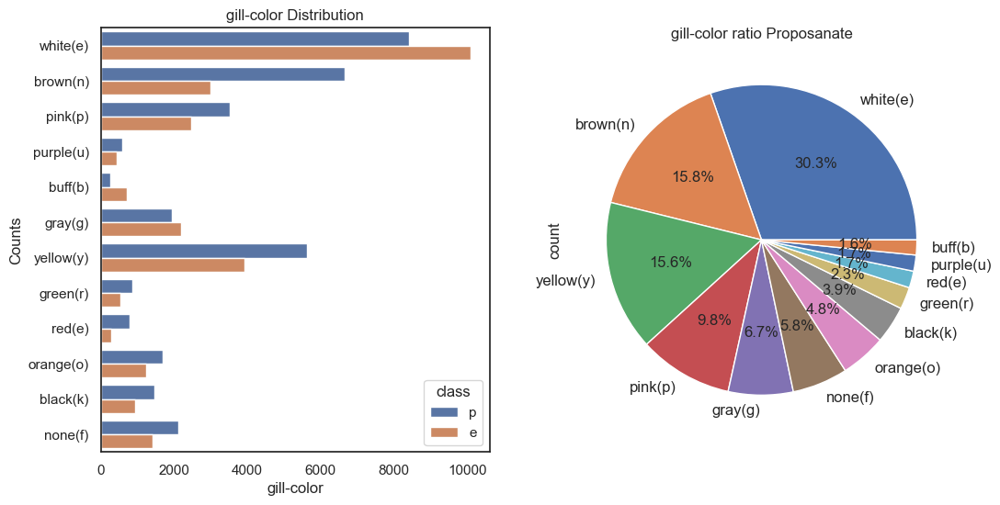

In [111]:
# Distribution of "gill_color"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="gill_color", hue="class", data=data_1dc)
plt.xlabel('gill-color')
plt.ylabel('Counts')
plt.title('gill-color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['gill_color'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('gill-color ratio Proposanate')

<Axes: xlabel='gill_color'>

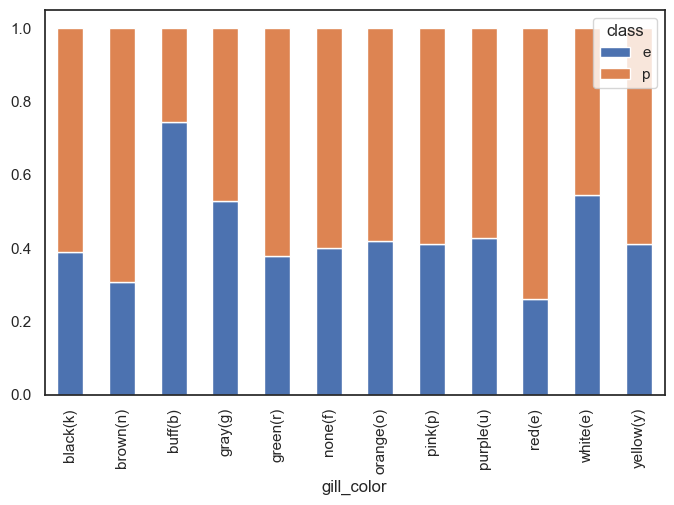

In [112]:

tmp = data_1dc[["class", "gill_color"]]
tmp["gill_color"] = tmp["gill_color"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "gill_color"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "gill_color==\""+row["gill_color"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="gill_color", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [113]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "gill_color", "class", 0.05)

Contigency table: 
 class           e     p
gill_color             
black(k)      928  1447
brown(n)     2983  6662
buff(b)       710   244
gray(g)      2175  1943
green(r)      531   868
none(f)      1412  2118
orange(o)    1223  1686
pink(p)      2465  3518
purple(u)     438   585
red(e)        279   787
white(e)    10107  8414
yellow(y)    3930  5616
Statistic: 2245.0488932836993
P-value: 0.0
DOF: 11
probability=0.950, critical=19.675, stat=2245.049
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### stem-height

Text(0.5, 1.0, 'Distribution of stem_height')

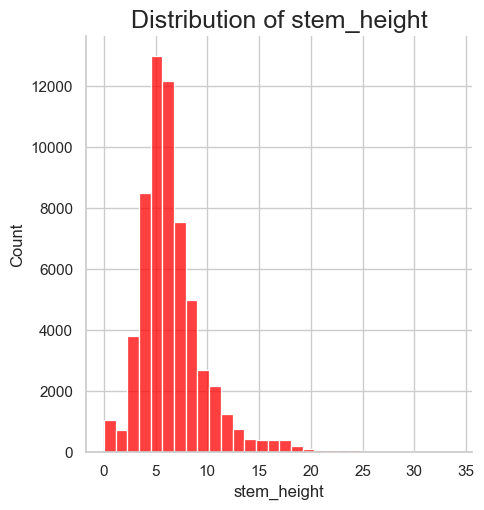

In [114]:
# Distribution of stem_height
sns.set_style('whitegrid')
sns.displot(data_1dc["stem_height"], kde=False, color='red', bins=30)
plt.title("Distribution of stem_height" ,fontsize=18)

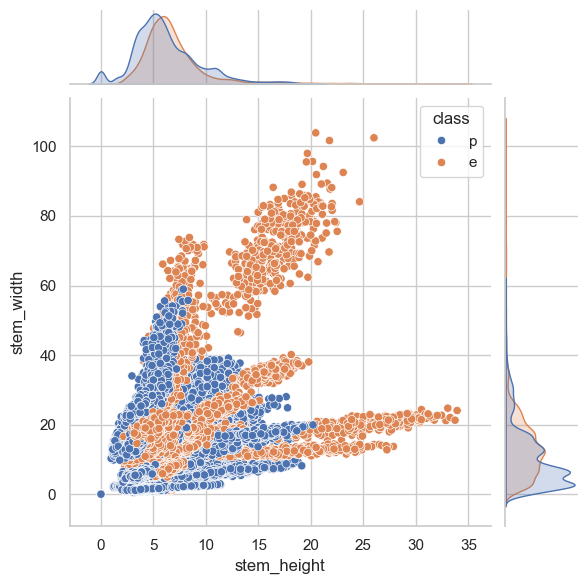

In [115]:


sns.jointplot(x ='stem_height', y ='stem_width', hue="class", data = data_1dc)

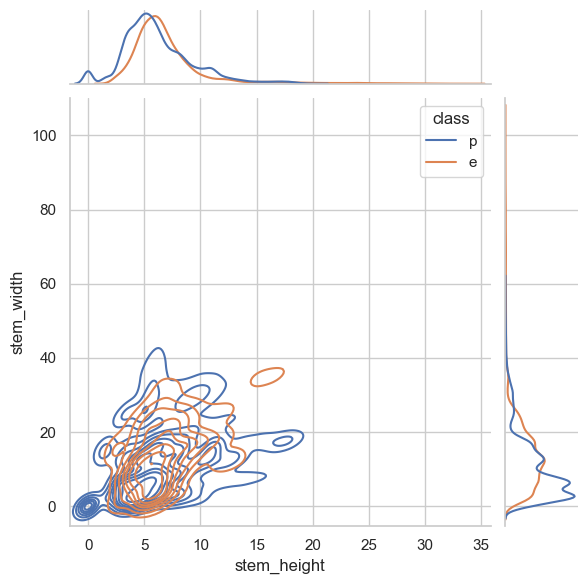

In [116]:


sns.jointplot(x ='stem_height', y ='stem_width',kind="kde", hue="class", data = data_1dc)

### stem-width

Text(0.5, 1.0, 'Distribution of stem_width')

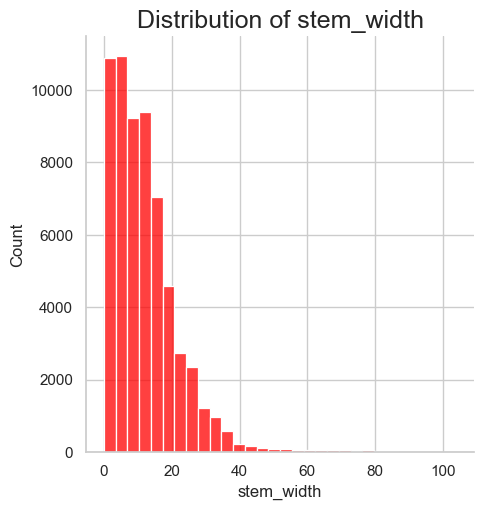

In [117]:
# Distribution of stem_height
sns.set_style('whitegrid')
sns.displot(data_1dc["stem_width"], kde=False, color='red', bins=30)
plt.title("Distribution of stem_width" ,fontsize=18)

<Axes: xlabel='stem_height', ylabel='stem_width'>

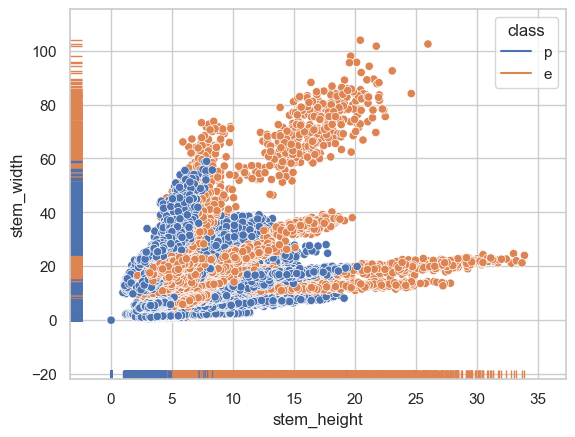

In [118]:
sns.scatterplot(data=data_1dc, x='stem_height', y='stem_width', hue='class')
sns.rugplot(data=data_1dc, x='stem_height', y='stem_width', hue='class')

Text(0, 0.5, 'stem_width')

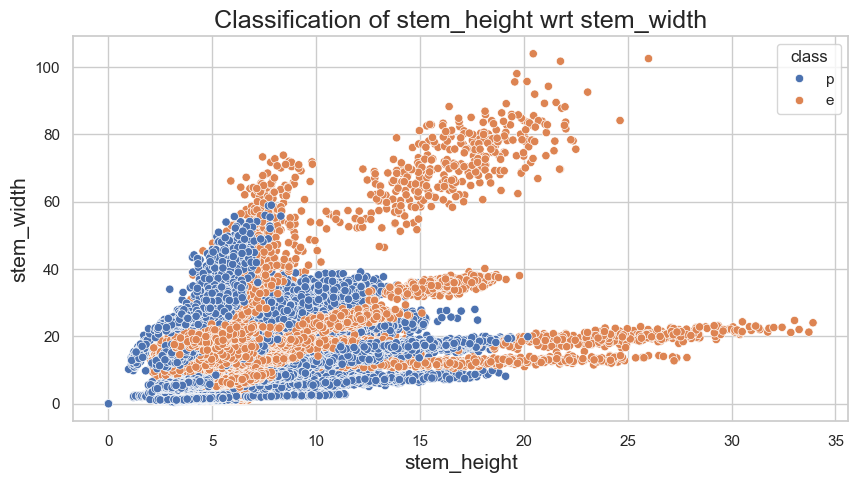

In [119]:

plt.figure(figsize=(10,5))
sns.scatterplot(x = 'stem_height', y = 'stem_width', hue = 'class',
               data = data_1dc, hue_order = ["p","e"])
plt.title("Classification of stem_height wrt stem_width", 
          fontsize=18)
plt.xlabel("stem_height", fontsize=15)
plt.ylabel("stem_width", fontsize=15)

### stem-root

In [120]:
data_1dc['stem_root'] = data_1dc['stem_root']
data_1dc.loc[data_1dc['stem_root'] == 'b', 'stem_root'] = 'bulbous(b)'
data_1dc.loc[data_1dc['stem_root'] == 'c', 'stem_root'] = 'club(c)'
data_1dc.loc[data_1dc['stem_root'] == 'u', 'stem_root'] = 'cup(u)'
data_1dc.loc[data_1dc['stem_root'] == 'e', 'stem_root'] = 'equal(e)'
data_1dc.loc[data_1dc['stem_root'] == 'z', 'stem_root'] = 'rhizomorphs(z)'
data_1dc.loc[data_1dc['stem_root'] == 'r', 'stem_root'] = 'rooted(r)'
data_1dc.loc[data_1dc['stem_root'] == 's', 'stem_root'] = 'swollen(s)'
data_1dc.loc[data_1dc['stem_root'] == 'f', 'stem_root'] = 'none(f)'

In [121]:
data_1dc["stem_root"].unique()

array(['swollen(s)', nan, 'bulbous(b)', 'rooted(r)', 'club(c)', 'none(f)'],
      dtype=object)

stem_root
swollen(s)    3177
bulbous(b)    3177
rooted(r)     1412
none(f)       1059
club(c)        706
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'stem-root ratio Proposanate')

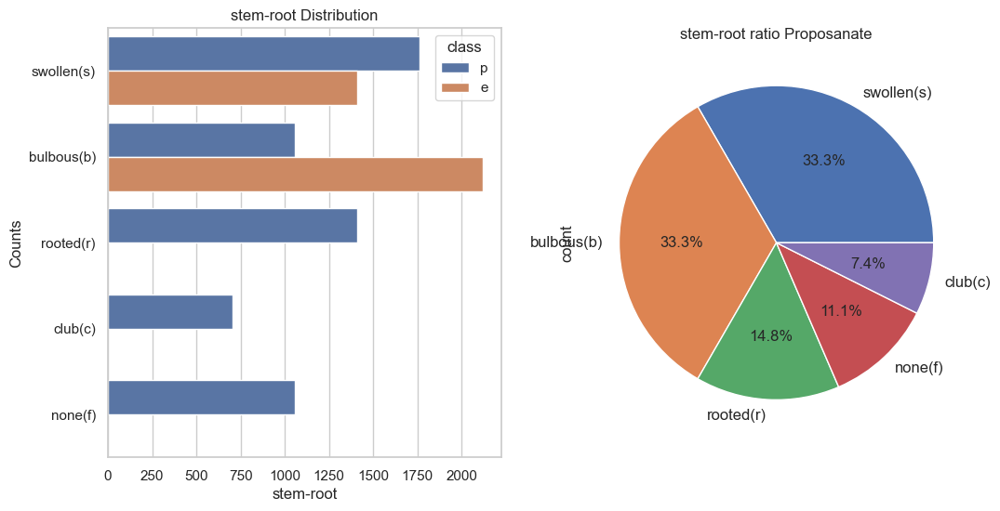

In [122]:
# Distribution of "stem_root"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="stem_root", hue="class", data=data_1dc)
plt.xlabel('stem-root')
plt.ylabel('Counts')
plt.title('stem-root Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['stem_root'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('stem-root ratio Proposanate')

<Axes: xlabel='stem_root'>

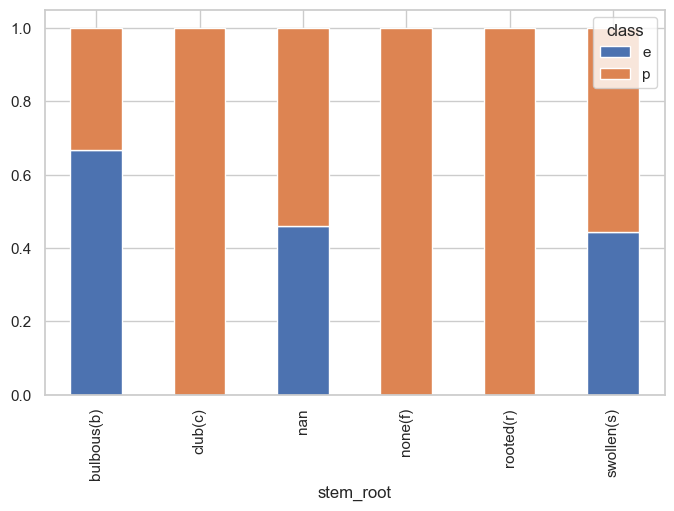

In [123]:

tmp = data_1dc[["class", "stem_root"]]
tmp["stem_root"] = tmp["stem_root"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "stem_root"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "stem_root==\""+row["stem_root"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="stem_root", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [124]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "gill_color", "class", 0.05)

Contigency table: 
 class           e     p
gill_color             
black(k)      928  1447
brown(n)     2983  6662
buff(b)       710   244
gray(g)      2175  1943
green(r)      531   868
none(f)      1412  2118
orange(o)    1223  1686
pink(p)      2465  3518
purple(u)     438   585
red(e)        279   787
white(e)    10107  8414
yellow(y)    3930  5616
Statistic: 2245.0488932836993
P-value: 0.0
DOF: 11
probability=0.950, critical=19.675, stat=2245.049
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### 'stem-surface'

In [125]:
data_1dc.loc[data_1dc["stem_surface"] == "i", "stem_surface"] = "fibrous(i)"
data_1dc.loc[data_1dc["stem_surface"] == "g", "stem_surface"] = "grooves(g)"
data_1dc.loc[data_1dc["stem_surface"] == "y", "stem_surface"] = "scaly(y)"
data_1dc.loc[data_1dc["stem_surface"] == "s", "stem_surface"] = "smooth(s)"
data_1dc.loc[data_1dc["stem_surface"] == "h", "stem_surface"] = "shiny(h)"
data_1dc.loc[data_1dc["stem_surface"] == "l", "stem_surface"] = "leathery(l)"
data_1dc.loc[data_1dc["stem_surface"] == "k", "stem_surface"] = "silky(k)"
data_1dc.loc[data_1dc["stem_surface"] == "t", "stem_surface"] = "sticky(t)"
data_1dc.loc[data_1dc["stem_surface"] == "w", "stem_surface"] = "wrinkled(w)"
data_1dc.loc[data_1dc["stem_surface"] == "e", "stem_surface"] = "fleshy(e)"
data_1dc.loc[data_1dc["stem_surface"] == "f", "stem_surface"] = "none(f)"

In [126]:
data_1dc["stem_surface"].unique()

array(['scaly(y)', nan, 'smooth(s)', 'silky(k)', 'fibrous(i)', 'shiny(h)',
       'sticky(t)', 'grooves(g)', 'none(f)'], dtype=object)

stem_surface
smooth(s)     6025
scaly(y)      4940
fibrous(i)    4396
sticky(t)     2644
grooves(g)    1765
silky(k)      1581
none(f)       1059
shiny(h)       535
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'stem_surface ratio Proposanate')

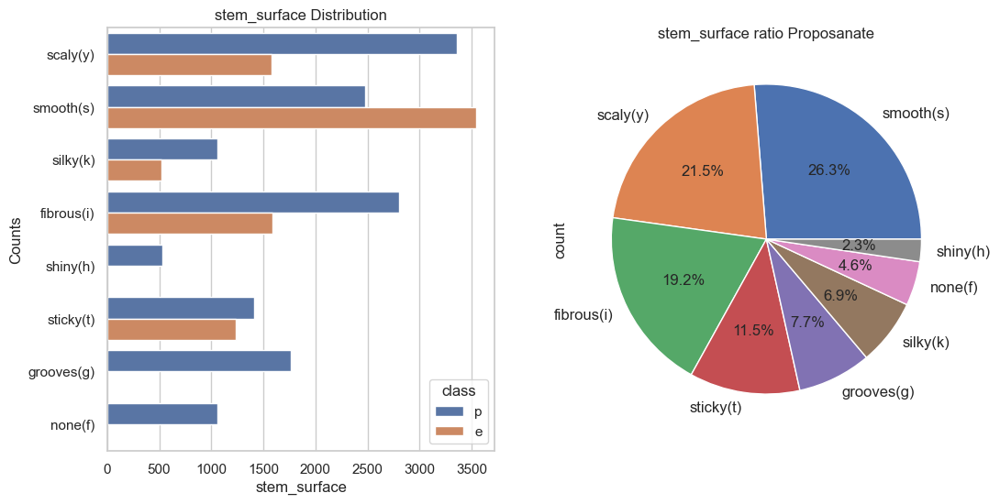

In [127]:
# Distribution of "stem_root"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="stem_surface", hue="class", data=data_1dc)
plt.xlabel('stem_surface')
plt.ylabel('Counts')
plt.title('stem_surface Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['stem_surface'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('stem_surface ratio Proposanate')

<Axes: xlabel='stem_surface'>

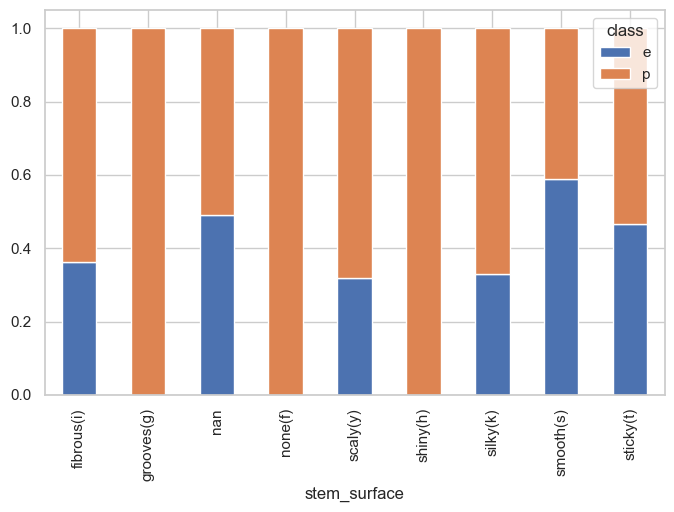

In [128]:

tmp = data_1dc[["class", "stem_surface"]]
tmp["stem_surface"] = tmp["stem_surface"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "stem_surface"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "stem_surface==\""+row["stem_surface"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="stem_surface", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [129]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "stem_surface", "class", 0.05)

Contigency table: 
 class            e     p
stem_surface            
fibrous(i)    1592  2804
grooves(g)       0  1765
none(f)          0  1059
scaly(y)      1579  3361
shiny(h)         0   535
silky(k)       522  1059
smooth(s)     3547  2478
sticky(t)     1232  1412
Statistic: 3382.1485908921586
P-value: 0.0
DOF: 7
probability=0.950, critical=14.067, stat=3382.149
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### 'stem-color

In [130]:
data_1dc.loc[data_1dc["stem_color"] == "n", "stem_color"] = "brown(n)"
data_1dc.loc[data_1dc["stem_color"] == "b", "stem_color"] = "buff(b)"
data_1dc.loc[data_1dc["stem_color"] == "g", "stem_color"] = "gray(g)"
data_1dc.loc[data_1dc["stem_color"] == "r", "stem_color"] = "green(r)"
data_1dc.loc[data_1dc["stem_color"] == "p", "stem_color"] = "pink(p)"
data_1dc.loc[data_1dc["stem_color"] == "u", "stem_color"] = "purple(u)"
data_1dc.loc[data_1dc["stem_color"] == "e", "stem_color"] = "red(e)"
data_1dc.loc[data_1dc["stem_color"] == "w", "stem_color"] = "white(w)"
data_1dc.loc[data_1dc["stem_color"] == "y", "stem_color"] = "yellow(y)"
data_1dc.loc[data_1dc["stem_color"] == "l", "stem_color"] = "blue(l)"
data_1dc.loc[data_1dc["stem_color"] == "o", "stem_color"] = "orange(o)"
data_1dc.loc[data_1dc["stem_color"] == "k", "stem_color"] = "black(k)"
data_1dc.loc[data_1dc["stem_color"] == "f", "stem_color"] = "none(f)"

In [131]:
data_1dc["stem_color"].unique()

array(['white(w)', 'yellow(y)', 'brown(n)', 'purple(u)', 'buff(b)',
       'blue(l)', 'green(r)', 'pink(p)', 'red(e)', 'black(k)', 'gray(g)',
       'orange(o)', 'none(f)'], dtype=object)

stem_color
white(w)     22926
brown(n)     18063
yellow(y)     7865
gray(g)       2626
orange(o)     2187
red(e)        2050
purple(u)     1490
none(f)       1059
pink(p)       1025
black(k)       837
green(r)       542
blue(l)        226
buff(b)        173
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'stem_color ratio Proposanate')

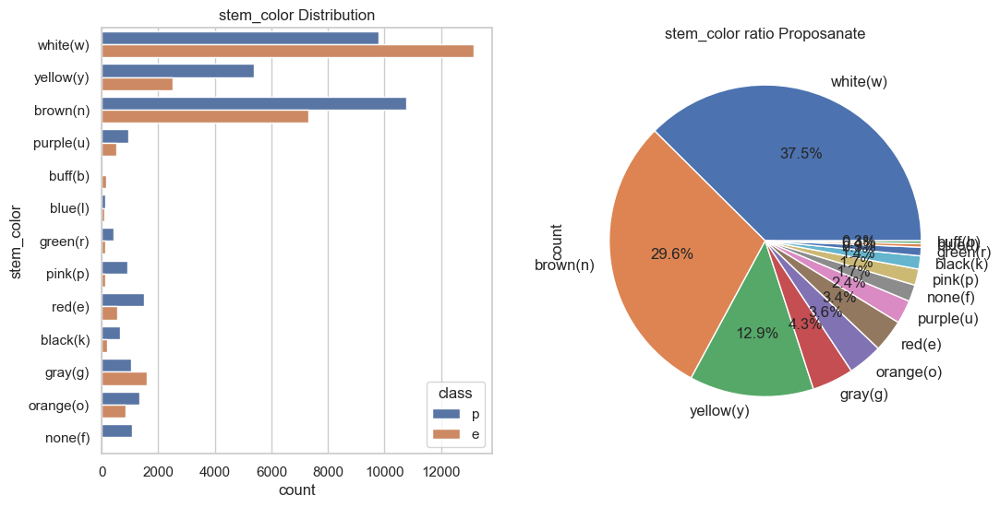

In [132]:
# Distribution of "stem_color"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="stem_color", hue="class", data=data_1dc)
plt.xlabel('count')
plt.ylabel('stem_color')
plt.title('stem_color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['stem_color'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('stem_color ratio Proposanate')

<Axes: xlabel='stem_color'>

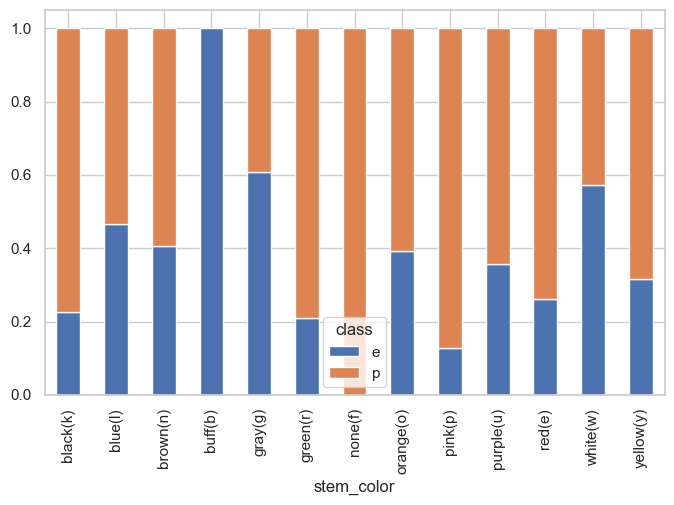

In [133]:

tmp = data_1dc[["class", "stem_color"]]
tmp["stem_color"] = tmp["stem_color"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "stem_color"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "stem_color==\""+row["stem_color"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="stem_color", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [134]:
# Hypothesis testing on "stem_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "stem_color", "class", 0.05)

Contigency table: 
 class           e      p
stem_color              
black(k)      189    648
blue(l)       105    121
brown(n)     7308  10755
buff(b)       173      0
gray(g)      1594   1032
green(r)      114    428
none(f)         0   1059
orange(o)     858   1329
pink(p)       132    893
purple(u)     533    957
red(e)        538   1512
white(w)    13143   9783
yellow(y)    2494   5371
Statistic: 4557.890604759592
P-value: 0.0
DOF: 12
probability=0.950, critical=21.026, stat=4557.891
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### 'veil-type'

In [135]:
data_1dc['veil_type'] = data_1dc['veil_type']
data_1dc.loc[data_1dc['veil_type'] == 'p', 'veil_type'] = 'partial(p)'
data_1dc.loc[data_1dc['veil_type'] == 'u', 'veil_type'] = 'universal(u)'

In [136]:
data_1dc["veil_type"].unique()

array(['universal(u)', nan], dtype=object)

veil_type
universal(u)    3177
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'veil_type ratio Proposanate')

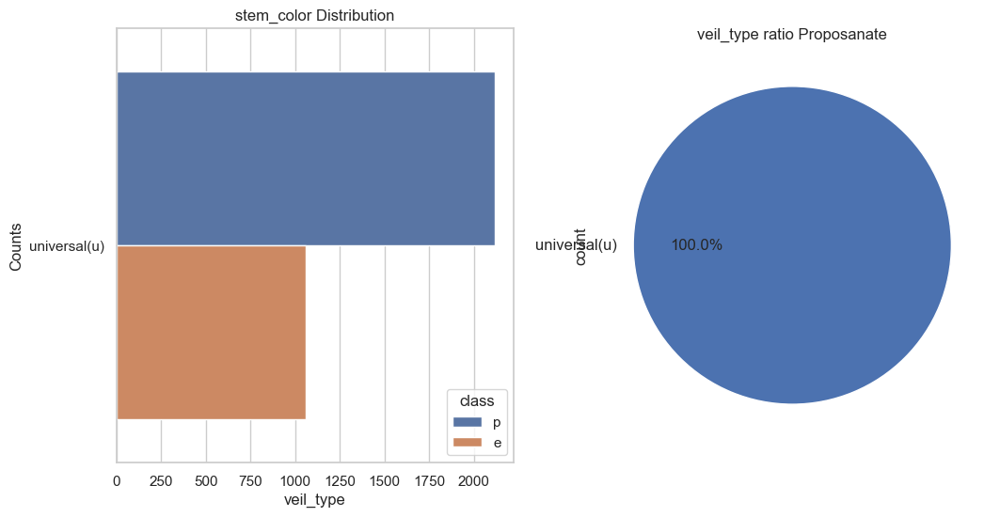

In [137]:
# Distribution of "veil_type"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="veil_type", hue="class", data=data_1dc)
plt.xlabel('veil_type')
plt.ylabel('Counts')
plt.title('stem_color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['veil_type'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('veil_type ratio Proposanate')

<Axes: xlabel='veil_type'>

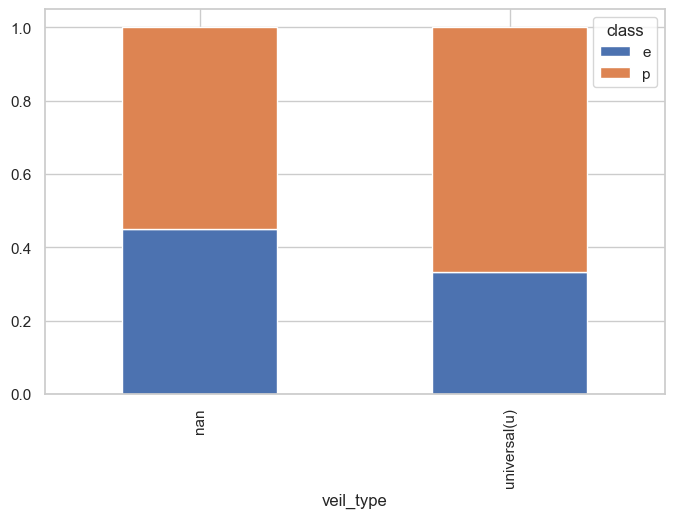

In [138]:

tmp = data_1dc[["class", "veil_type"]]
tmp["veil_type"] = tmp["veil_type"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "veil_type"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "veil_type==\""+row["veil_type"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="veil_type", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [139]:
# Hypothesis testing on "veil_type" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "veil_type", "class", 0.05)

Contigency table: 
 class            e     p
veil_type               
universal(u)  1059  2118
Statistic: 0.0
P-value: 1.0
DOF: 0
probability=0.950, critical=nan, stat=0.000
Independent (fail to reject Null Hypothesis(H0))
Independent (fail to reject Null Hypothesis(H0))


### 'veil-color'

In [140]:
data_1dc.loc[data_1dc["veil_color"] == "n", "veil_color"] = "brown(n)"
data_1dc.loc[data_1dc["veil_color"] == "b", "veil_color"] = "buff(b)"
data_1dc.loc[data_1dc["veil_color"] == "g", "veil_color"] = "gray(g)"
data_1dc.loc[data_1dc["veil_color"] == "r", "veil_color"] = "green(r)"
data_1dc.loc[data_1dc["veil_color"] == "p", "veil_color"] = "pink(p)"
data_1dc.loc[data_1dc["veil_color"] == "u", "veil_color"] = "purple(u)"
data_1dc.loc[data_1dc["veil_color"] == "e", "veil_color"] = "red(e)"
data_1dc.loc[data_1dc["veil_color"] == "w", "veil_color"] = "white(w)"
data_1dc.loc[data_1dc["veil_color"] == "y", "veil_color"] = "yellow(y)"
data_1dc.loc[data_1dc["veil_color"] == "l", "veil_color"] = "blue(l)"
data_1dc.loc[data_1dc["veil_color"] == "o", "veil_color"] = "orange(o)"
data_1dc.loc[data_1dc["veil_color"] == "k", "veil_color"] = "black(k)"
data_1dc.loc[data_1dc["veil_color"] == "f", "veil_color"] = "none(f)"

In [141]:
data_1dc["veil_color"].unique()

array(['white(w)', 'yellow(y)', nan, 'brown(n)', 'red(e)', 'purple(u)',
       'black(k)'], dtype=object)

veil_color
white(w)     5474
yellow(y)     527
brown(n)      525
purple(u)     353
black(k)      353
red(e)        181
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'veil_color ratio Proposanate')

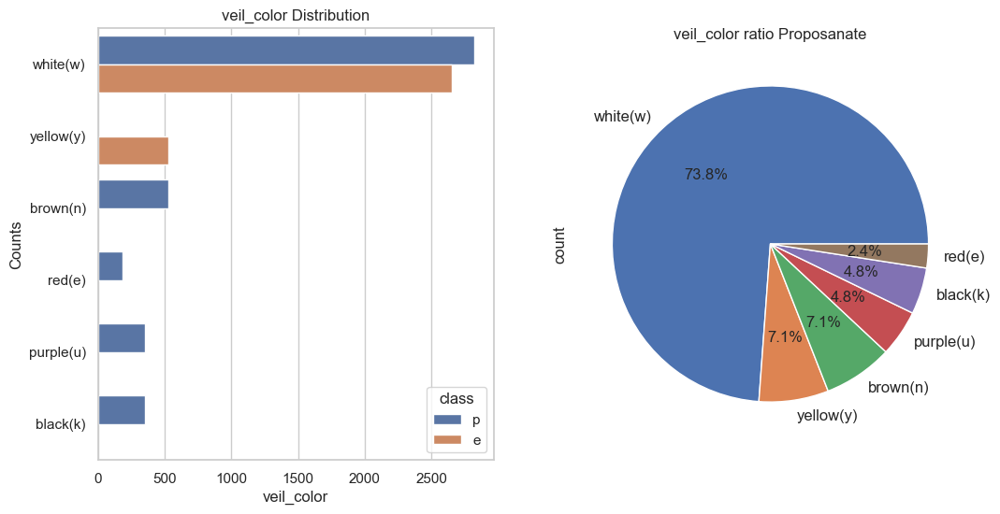

In [142]:
# Distribution of "veil_type"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="veil_color", hue="class", data=data_1dc)
plt.xlabel('veil_color')
plt.ylabel('Counts')
plt.title('veil_color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['veil_color'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 12))
plt.title('veil_color ratio Proposanate')

<Axes: xlabel='veil_color'>

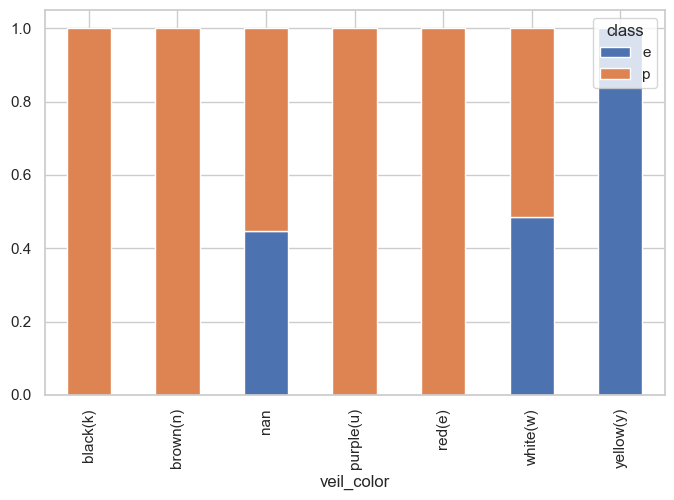

In [143]:

tmp = data_1dc[["class", "veil_color"]]
tmp["veil_color"] = tmp["veil_color"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "veil_color"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "veil_color==\""+row["veil_color"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="veil_color", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [144]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "veil_color", "class", 0.05)

Contigency table: 
 class          e     p
veil_color            
black(k)       0   353
brown(n)       0   525
purple(u)      0   353
red(e)         0   181
white(w)    2650  2824
yellow(y)    527     0
Statistic: 1830.6044330775787
P-value: 0.0
DOF: 5
probability=0.950, critical=11.070, stat=1830.604
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### 'has-ring'

In [145]:
# data_1dc["has_ring"] = data_1dc["has_ring"]
data_1dc.loc[data_1dc["has_ring"] == "t", "has_ring"] == "ring(t)"
data_1dc.loc[data_1dc["has_ring"] == "f", "has_ring"] == "none(f)"

2471     False
2472     False
2473     False
2474     False
2475     False
         ...  
61064    False
61065    False
61066    False
61067    False
61068    False
Name: has_ring, Length: 45890, dtype: bool

has_ring
f    45890
t    15179
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'has-ring ratio Proposanate')

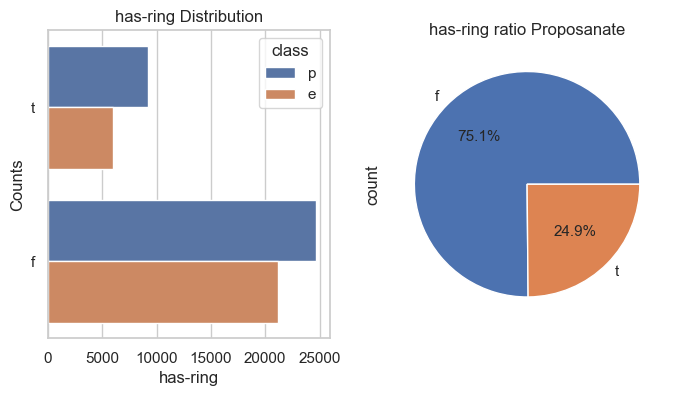

In [146]:
fig, ax = plt.subplots(1,2,figsize=(8,4))
ax1=plt.subplot(1,2,1)
sns.countplot(y="has_ring", hue="class", data=data_1dc)
plt.xlabel('has-ring')
plt.ylabel('Counts')
plt.title('has-ring Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['has_ring'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 11))
plt.title('has-ring ratio Proposanate')

<Axes: xlabel='has_ring'>

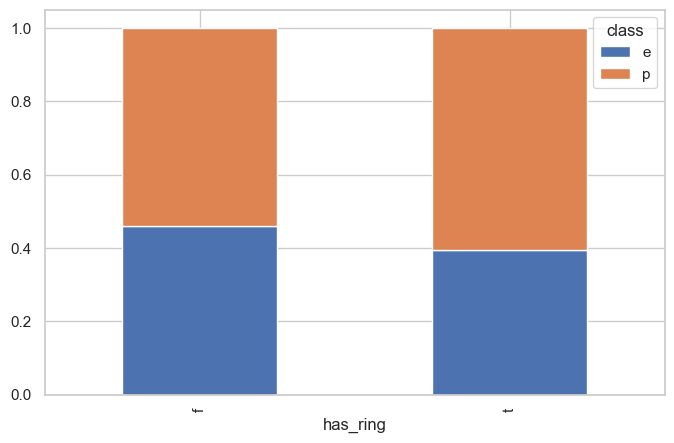

In [147]:

tmp = data_1dc[["class", "has_ring"]]
tmp["has_ring"] = tmp["has_ring"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "has_ring"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "has_ring==\""+row["has_ring"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="has_ring", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [148]:
# Hypothesis testing on "has_ring" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "has_ring", "class", 0.05)

Contigency table: 
 class         e      p
has_ring              
f         21180  24710
t          6001   9178
Statistic: 202.05753638169924
P-value: 7.427498993566696e-46
DOF: 1
probability=0.950, critical=3.841, stat=202.058
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### 'ring-type'

##### Distribution of ring_type before impution

In [149]:
data_1dc["ring_type"] = data_1dc["ring_type"]
data_1dc.loc[data_1dc["ring_type"] == "c", "ring_type"] = "cobwebby(c)"
data_1dc.loc[data_1dc["ring_type"] == "e", "ring_type"] = "evanescent(e)"
data_1dc.loc[data_1dc["ring_type"] == "r", "ring_type"] = "flaring(r)"
data_1dc.loc[data_1dc["ring_type"] == "g", "ring_type"] = "grooved(g)"
data_1dc.loc[data_1dc["ring_type"] == "l", "ring_type"] = "large(l)"
data_1dc.loc[data_1dc["ring_type"] == "p", "ring_type"] = "pendant(p)"
data_1dc.loc[data_1dc["ring_type"] == "s", "sheathing"] = "sheathing(s)"
data_1dc.loc[data_1dc["ring_type"] == "z", "ring_type"] = "zone(z)"
data_1dc.loc[data_1dc["ring_type"] == "y", "ring_type"] = "scaly(y)"
data_1dc.loc[data_1dc["ring_type"] == "m", "ring_type"] = "movable(m)"
data_1dc.loc[data_1dc["ring_type"] == "f", "ring_type"] = "none(f)"


ring_type
none(f)          48361
evanescent(e)     2435
zone(z)           2118
large(l)          1427
flaring(r)        1399
pendant(p)        1265
grooved(g)        1240
movable(m)         353
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'ring-type ratio Proposanate')

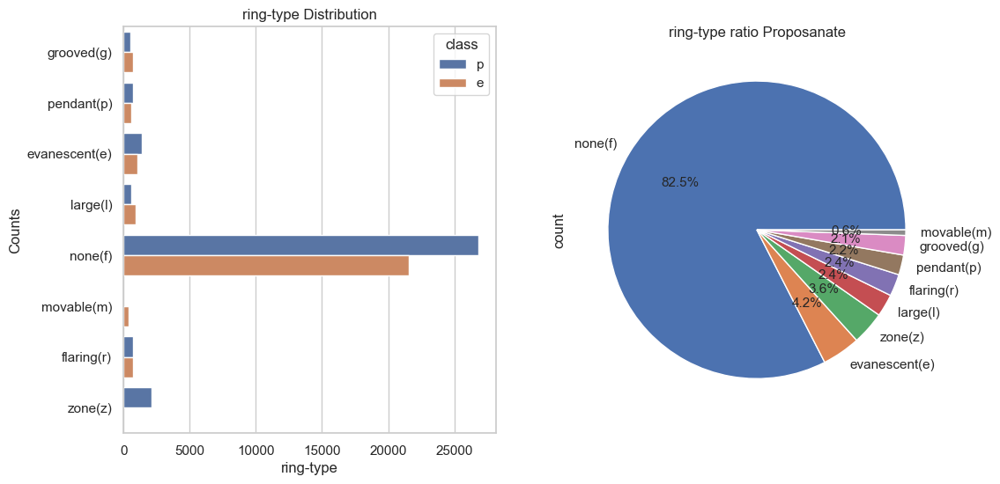

In [150]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="ring_type", hue="class", data=data_1dc)
plt.xlabel('ring-type')
plt.ylabel('Counts')
plt.title('ring-type Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['ring_type'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 11))
plt.title('ring-type ratio Proposanate')

<Axes: xlabel='ring_type'>

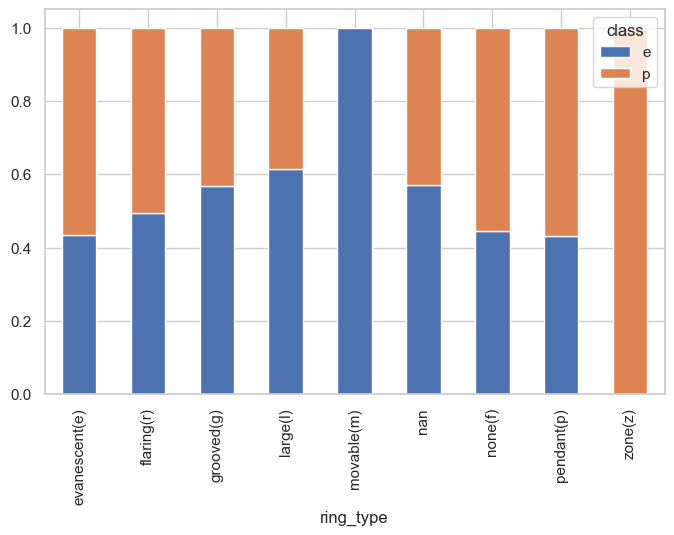

In [151]:

tmp = data_1dc[["class", "ring_type"]]
tmp["ring_type"] = tmp["ring_type"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "ring_type"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "ring_type==\""+row["ring_type"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="ring_type", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [152]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "ring_type", "class", 0.05)

Contigency table: 
 class              e      p
ring_type                  
evanescent(e)   1059   1376
flaring(r)       693    706
grooved(g)       706    534
large(l)         877    550
movable(m)       353      0
none(f)        21533  26828
pendant(p)       548    717
zone(z)            0   2118
Statistic: 2397.7049894095953
P-value: 0.0
DOF: 7
probability=0.950, critical=14.067, stat=2397.705
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


##### Distribution of ring_type after impution

In [153]:
data_1cd.loc[data_1cd["ring_type"] == "c", "ring_type"] = "cobwebby(c)"
data_1cd.loc[data_1cd["ring_type"] == "e", "ring_type"] = "evanescent(e)"
data_1cd.loc[data_1cd["ring_type"] == "r", "ring_type"] = "flaring(r)"
data_1cd.loc[data_1cd["ring_type"] == "g", "ring_type"] = "grooved(g)"
data_1cd.loc[data_1cd["ring_type"] == "l", "ring_type"] = "large(l)"
data_1cd.loc[data_1cd["ring_type"] == "p", "ring_type"] = "pendant(p)"
data_1cd.loc[data_1cd["ring_type"] == "s", "sheathing"] = "sheathing(s)"
data_1cd.loc[data_1cd["ring_type"] == "z", "ring_type"] = "zone(z)"
data_1cd.loc[data_1cd["ring_type"] == "y", "ring_type"] = "scaly(y)"
data_1cd.loc[data_1cd["ring_type"] == "m", "ring_type"] = "movable(m)"
data_1cd.loc[data_1cd["ring_type"] == "f", "ring_type"] = "none(f)"


ring_type
none(f)          50832
evanescent(e)     2435
zone(z)           2118
large(l)          1427
flaring(r)        1399
pendant(p)        1265
grooved(g)        1240
movable(m)         353
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'ring-type ratio Proposanate')

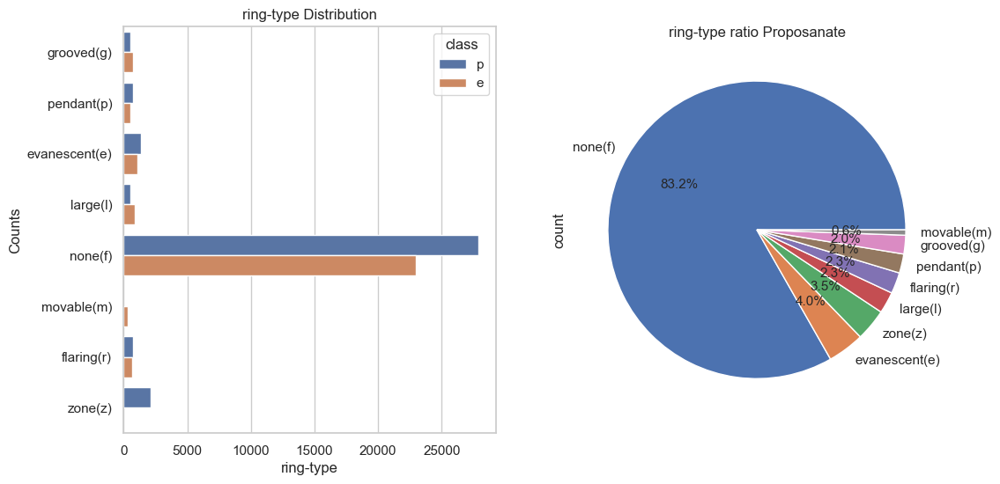

In [154]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="ring_type", hue="class", data=data_1cd)
plt.xlabel('ring-type')
plt.ylabel('Counts')
plt.title('ring-type Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1cd['ring_type'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 11))
plt.title('ring-type ratio Proposanate')

<Axes: xlabel='ring_type'>

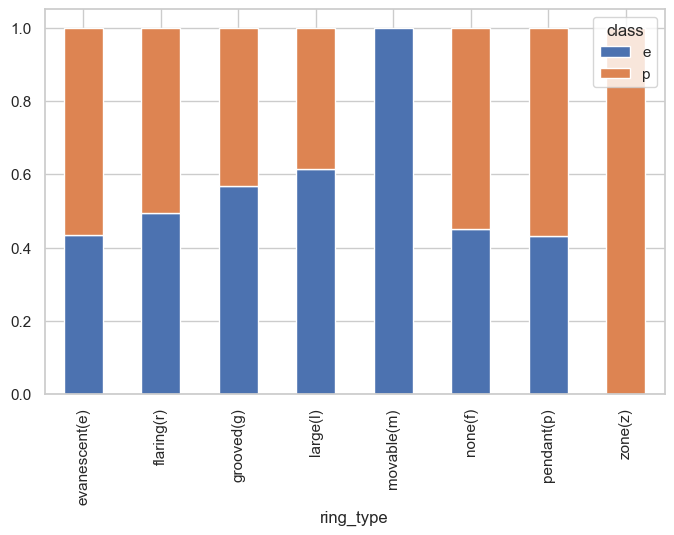

In [155]:

tmp = data_1cd[["class", "ring_type"]]
tmp["ring_type"] = tmp["ring_type"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "ring_type"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "ring_type==\""+row["ring_type"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="ring_type", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [156]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1cd, "ring_type", "class", 0.05)

Contigency table: 
 class              e      p
ring_type                  
evanescent(e)   1059   1376
flaring(r)       693    706
grooved(g)       706    534
large(l)         877    550
movable(m)       353      0
none(f)        22945  27887
pendant(p)       548    717
zone(z)            0   2118
Statistic: 2406.6520736573875
P-value: 0.0
DOF: 7
probability=0.950, critical=14.067, stat=2406.652
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### spore-print-color'       

In [157]:
data_1dc["spore_print_color"].unique()

array([nan, 'w', 'p', 'k', 'r', 'u', 'n', 'g'], dtype=object)

In [158]:
data_1dc.loc[data_1dc["spore_print_color"] == "n", "spore_print_color"] = "brown(n)"
data_1dc.loc[data_1dc["spore_print_color"] == "g", "spore_print_color"] = "gray(g)"
data_1dc.loc[data_1dc["spore_print_color"] == "r", "spore_print_color"] = "green(r)"
data_1dc.loc[data_1dc["spore_print_color"] == "p", "spore_print_color"] = "pink(p)"
data_1dc.loc[data_1dc["spore_print_color"] == "u", "spore_print_color"] = "purple(u)"
data_1dc.loc[data_1dc["spore_print_color"] == "w", "spore_print_color"] = "white(w)"
data_1dc.loc[data_1dc["spore_print_color"] == "k", "spore_print_color"] = "black(k)"

spore_print_color
black(k)     2118
pink(p)      1259
white(w)     1212
brown(n)     1059
gray(g)       353
purple(u)     182
green(r)      171
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'spore-print-color ratio Proposanate')

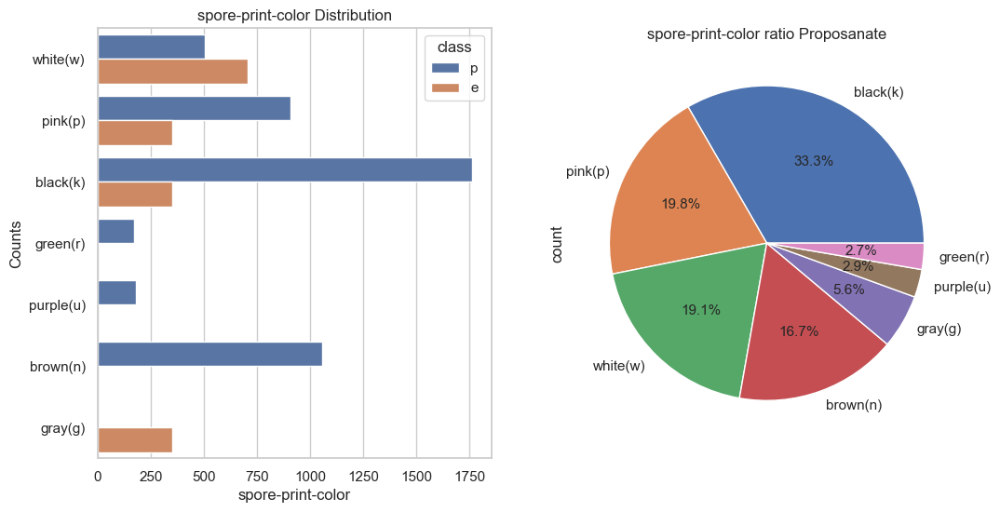

In [159]:
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="spore_print_color", hue="class", data=data_1dc)
plt.xlabel('spore-print-color')
plt.ylabel('Counts')
plt.title('spore-print-color Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['spore_print_color'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 11))
plt.title('spore-print-color ratio Proposanate')

<Axes: xlabel='spore_print_color'>

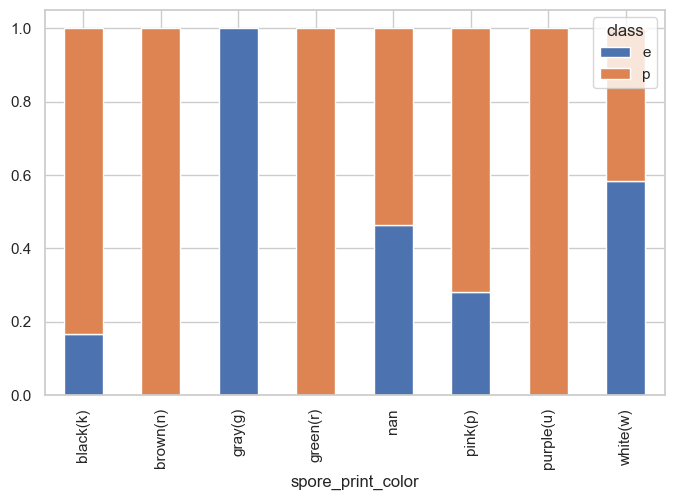

In [160]:

tmp = data_1dc[["class", "spore_print_color"]]
tmp["spore_print_color"] = tmp["spore_print_color"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "spore_print_color"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "spore_print_color==\""+row["spore_print_color"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="spore_print_color", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [161]:
# Hypothesis testing on "spore_print_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "spore_print_color", "class", 0.05)

Contigency table: 
 class                e     p
spore_print_color           
black(k)           353  1765
brown(n)             0  1059
gray(g)            353     0
green(r)             0   171
pink(p)            353   906
purple(u)            0   182
white(w)           706   506
Statistic: 2152.262034146226
P-value: 0.0
DOF: 6
probability=0.950, critical=12.592, stat=2152.262
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### habitat 

In [162]:
data_1dc.loc[data_1dc['habitat'] == 'g', 'habitat'] = 'grasses(g)'
data_1dc.loc[data_1dc['habitat'] == 'l', 'habitat'] = 'leaves(l)'
data_1dc.loc[data_1dc['habitat'] == 'm', 'habitat'] = 'meadows(m)'
data_1dc.loc[data_1dc['habitat'] == 'p', 'habitat'] = 'paths(p)'
data_1dc.loc[data_1dc['habitat'] == 'h', 'habitat'] = 'heaths(h)'
data_1dc.loc[data_1dc['habitat'] == 'u', 'habitat'] = 'urban(u)'
data_1dc.loc[data_1dc['habitat'] == 'w', 'habitat'] = 'waste(w)'
data_1dc.loc[data_1dc['habitat'] == 'd', 'habitat'] = 'woods(d)'

habitat
woods(d)      44209
grasses(g)     7943
leaves(l)      3168
meadows(m)     2920
heaths(h)      2001
paths(p)        360
waste(w)        353
urban(u)        115
Name: count, dtype: int64
Axes(0.547727,0.142727;0.352273x0.704545)


Text(0.5, 1.0, 'habitat ratio Proposanate')

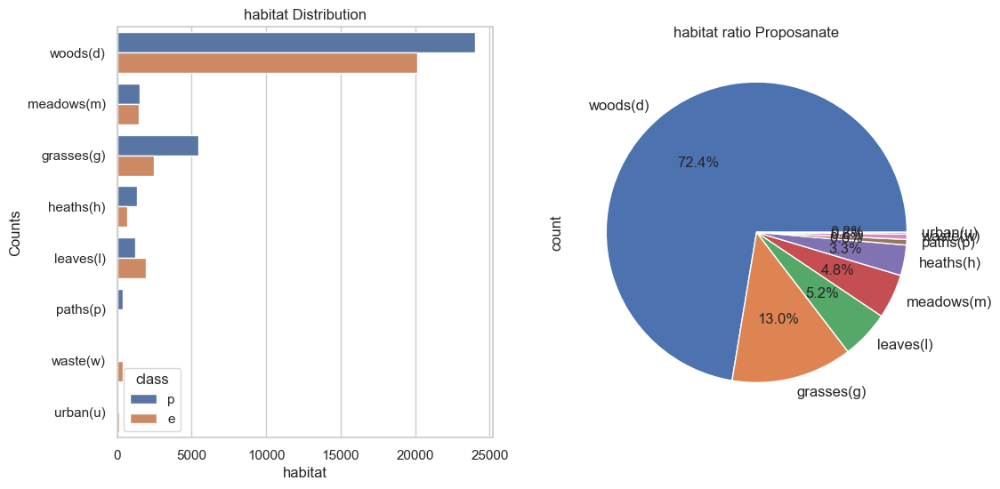

In [163]:
# Distribution of "habitat"
fig, ax = plt.subplots(1,2,figsize=(12,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="habitat", hue="class", data=data_1dc)
plt.xlabel('habitat')
plt.ylabel('Counts')
plt.title('habitat Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['habitat'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize=12, figsize=(12,6)))
plt.title('habitat ratio Proposanate')

<Axes: xlabel='habitat'>

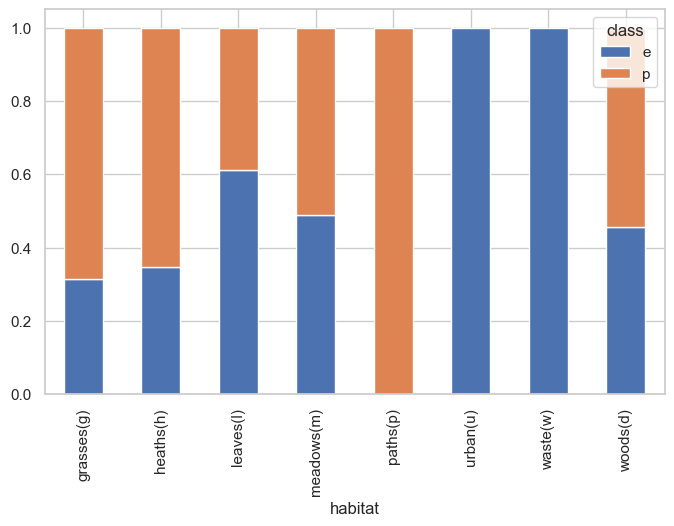

In [164]:

tmp = data_1dc[["class", "habitat"]]
tmp["habitat"] = tmp["habitat"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "habitat"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "habitat==\""+row["habitat"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="habitat", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [165]:
# Hypothesis testing on "gill_color" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "habitat", "class", 0.05)

Contigency table: 
 class           e      p
habitat                 
grasses(g)   2489   5454
heaths(h)     696   1305
leaves(l)    1938   1230
meadows(m)   1427   1493
paths(p)        0    360
urban(u)      115      0
waste(w)      353      0
woods(d)    20163  24046
Statistic: 1907.309416697382
P-value: 0.0
DOF: 7
probability=0.950, critical=14.067, stat=1907.309
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### season

In [166]:
# Missing Values/Null Values Count

print('Is there any missing value present or not?',data_1.isnull().values.any())
print("-"*50)
missing_percentage = data_1.isnull().sum()/len(data_1)*100
missing_percentage_sort = missing_percentage.sort_values(ascending=False)
missing_value_df1 = pd.DataFrame({'missing_count': data_1.isnull().sum().sort_values(ascending=False),
                                 'missing_percentage': missing_percentage_sort})
print("Null value count in each of the variable: ")
print("-"*50)
missing_value_df1

Is there any missing value present or not? True
--------------------------------------------------
Null value count in each of the variable: 
--------------------------------------------------


,missing_count,missing_percentage
veil-type,57892,94.797688
spore-print-color,54715,89.595376
veil-color,53656,87.861272
stem-root,51538,84.393064
stem-surface,38124,62.427746
gill-spacing,25063,41.040462
cap-surface,14120,23.121387
gill-attachment,9884,16.184971
ring-type,2471,4.046243
class,0,0.000000


In [167]:
data_1dc.drop(["Bruises_or_Bleeding", "no_Bruises_or_Bleeding"], axis=1, inplace=True)

In [168]:
data_1dc.columns

Index(['class', 'cap-diameter', 'cap_shape', 'cap_surface', 'cap_color',
       'does_bruise_or_bleed', 'gill_attachment', 'gill_spacing', 'gill_color',
       'stem_height', 'stem_width', 'stem_root', 'stem_surface', 'stem_color',
       'veil_type', 'veil_color', 'has_ring', 'ring_type', 'spore_print_color',
       'habitat', 'season', 'sheathing'],
      dtype='object')

In [169]:
data_1dc.loc[data_1dc['season'] == 's', 'season'] = 'spring(s)'
data_1dc.loc[data_1dc['season'] == 'u', 'season'] = 'summer(u)'
data_1dc.loc[data_1dc['season'] == 'a', 'season'] = 'autumn(a)'
data_1dc.loc[data_1dc['season'] == 'w', 'season'] = 'winter(w)'

season
autumn(a)    30177
summer(u)    22898
winter(w)     5267
spring(s)     2727
Name: count, dtype: int64
Axes(0.547727,0.201439;0.352273x0.587121)


Text(0.5, 1.0, 'season ratio Proposanate')

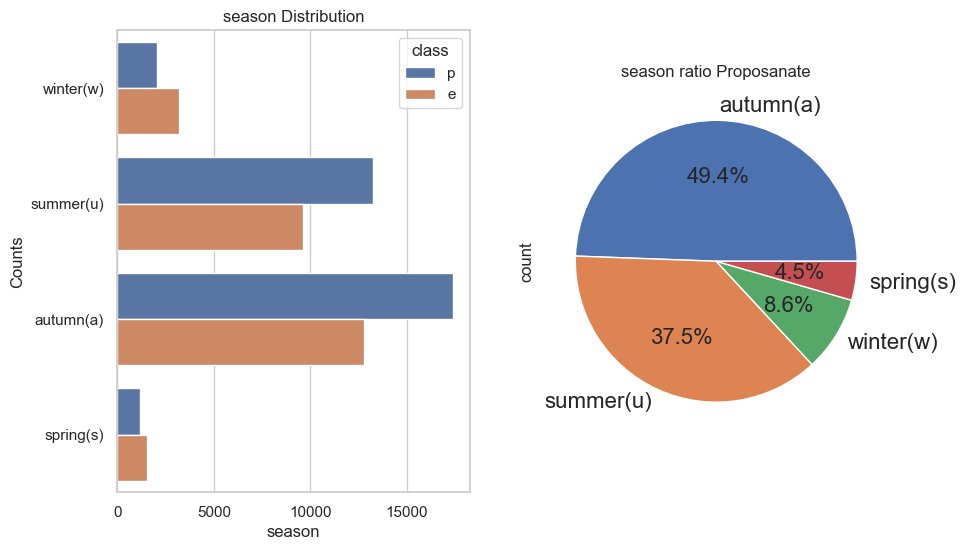

In [170]:
# Distribution of "season"
fig, ax = plt.subplots(1,2,figsize=(10,6))
ax1=plt.subplot(1,2,1)
sns.countplot(y="season", hue="class", data=data_1dc)
plt.xlabel('season')
plt.ylabel('Counts')
plt.title('season Distribution')
ax2=plt.subplot(1,2,2)
val_counts = data_1dc['season'].value_counts()
print(val_counts)
print(val_counts.plot(kind='pie', autopct='%1.1f%%', fontsize = 16))
plt.title('season ratio Proposanate')

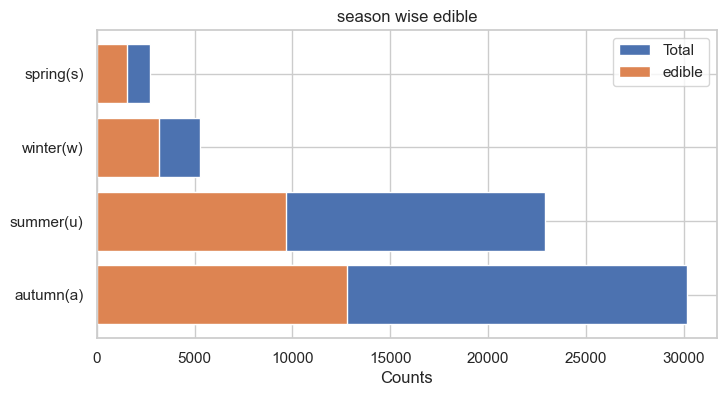

,season,Total_Count,% of Total,edible,poisonous,%edible,%poisonous
0,autumn(a),30177,49.414597,12785,17392,42.367,57.633
2,summer(u),22898,8.624670,9647,13251,42.130,57.870
3,winter(w),5267,4.465441,3196,2071,60.680,39.320
1,spring(s),2727,37.495292,1553,1174,56.949,43.051


In [171]:
Univariate_Analysis1dc("season")

<Axes: xlabel='season'>

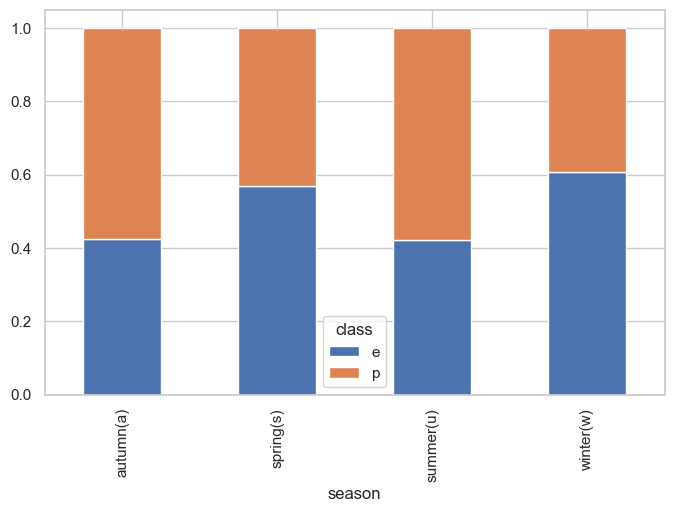

In [172]:

tmp = data_1dc[["class", "season"]]
tmp["season"] = tmp["season"].astype(str)
tmp["count"] = 1
tmp = tmp.groupby(["class", "season"], as_index=False).count()
tmp["count_norm"] = 1
def get_norm_count(row):
    q = "season==\""+row["season"]+"\""
    val = tmp.query(q)["count"].sum()
    row["count_norm"] = row["count"]/val
    return row
tmp = tmp.apply(get_norm_count, axis=1)
# display(tmp)
tmp.pivot(columns="class", index="season", values="count_norm").plot.bar(stacked=True,
                                                                                figsize=(8,5))

In [173]:
# Hypothesis testing on "season" column
stat, p_val, dof = chi_sqred_ind_test(data_1dc, "season", "class", 0.05)

Contigency table: 
 class          e      p
season                 
autumn(a)  12785  17392
spring(s)   1553   1174
summer(u)   9647  13251
winter(w)   3196   2071
Statistic: 837.0349697811023
P-value: 4.0178666316236727e-181
DOF: 3
probability=0.950, critical=7.815, stat=837.035
Dependent (reject Null Hypothesis(H0))
Dependent (reject Null Hypothesis(H0))


### Bivariate Analysis

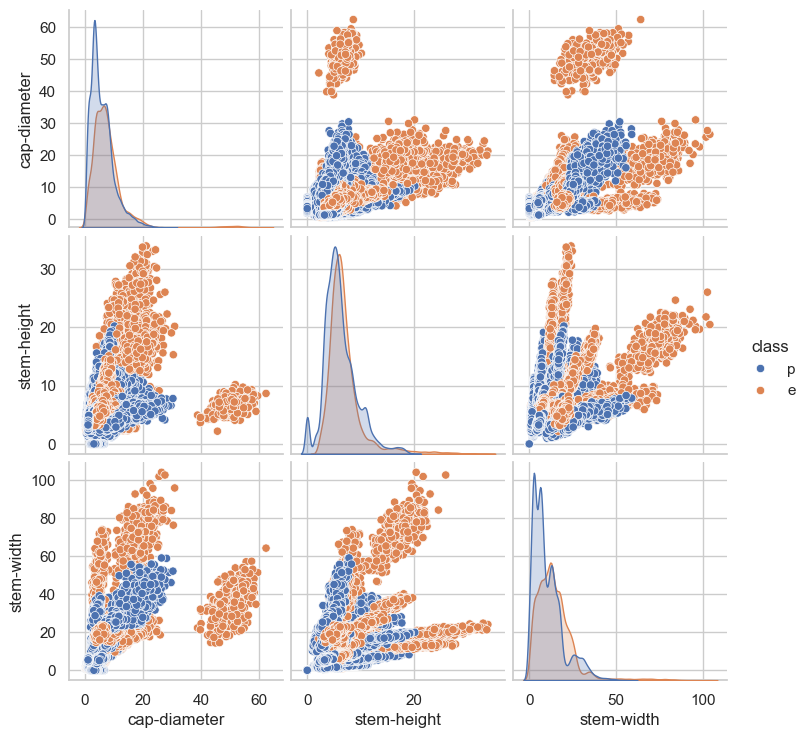

In [174]:
sns.pairplot(data=data_1c, hue="class")

In [175]:
#### Checking Feature Importance

In [176]:
data_1c = data_1c[["class", 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color', 'does-bruise-or-bleed', 
                   'gill-attachment', 'gill-color', 'stem-height', 'stem-width', 'stem-color', 'has-ring', 'ring-type', 
                  'habitat', 'season']]

In [177]:
data_1c.isnull().sum()/data_1c.shape[0]*100

class                   0.0
cap-diameter            0.0
cap-shape               0.0
cap-surface             0.0
cap-color               0.0
does-bruise-or-bleed    0.0
gill-attachment         0.0
gill-color              0.0
stem-height             0.0
stem-width              0.0
stem-color              0.0
has-ring                0.0
ring-type               0.0
habitat                 0.0
season                  0.0
dtype: float64

In [178]:
data_1c.dtypes

class                    object
cap-diameter            float64
cap-shape                object
cap-surface              object
cap-color                object
does-bruise-or-bleed     object
gill-attachment          object
gill-color               object
stem-height             float64
stem-width              float64
stem-color               object
has-ring                 object
ring-type                object
habitat                  object
season                   object
dtype: object

In [179]:
data_1c = pd.DataFrame({col: data_1c[col].astype('category').cat.codes for col in data_1c}, index=data_1c.index)

data_1c.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,1,1481,6,2,6,0,2,10,1577,1656,11,1,2,0,3
1,1,1614,6,2,6,0,2,10,1681,1766,11,1,2,0,2
2,1,1362,6,2,6,0,2,10,1662,1721,11,1,2,0,3
3,1,1372,2,3,1,0,2,10,1463,1545,11,1,5,0,3
4,1,1419,6,3,6,0,2,10,1537,1667,11,1,5,0,3


In [180]:
data_1c.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color', 'stem-height',
       'stem-width', 'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season'],
      dtype='object')

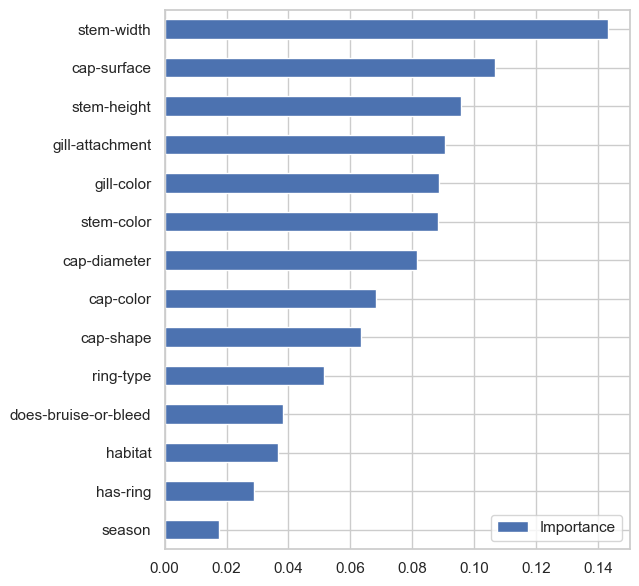

In [181]:
# Using Random Forest to gain an insight on Feature Importance
clf = RandomForestClassifier()
clf.fit(data_1c.drop(['class'], axis=1), data_1c['class'])

# plt.style.use('seaborn-whitegrid')
importance = clf.feature_importances_
importance = pd.DataFrame(importance, index=data_1c.drop('class', axis=1).columns, columns=["Importance"])
importance.sort_values(by='Importance', ascending=True).plot(kind='barh', figsize=(6,len(importance)/2));


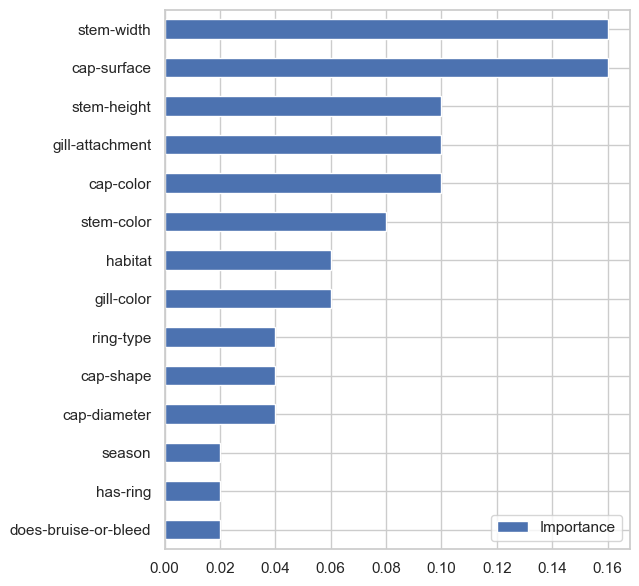

In [182]:
# Using AdaBoostClassifier to gain an insight on Feature Importance
clf = AdaBoostClassifier()
clf.fit(data_1c.drop(['class'], axis=1), data_1c['class'])

# plt.style.use('seaborn-whitegrid')
importance = clf.feature_importances_
importance = pd.DataFrame(importance, index=data_1c.drop('class', axis=1).columns, columns=["Importance"])
importance.sort_values(by='Importance', ascending=True).plot(kind='barh', figsize=(6,len(importance)/2));


Text(0.5, 0, 'Relative Importance')

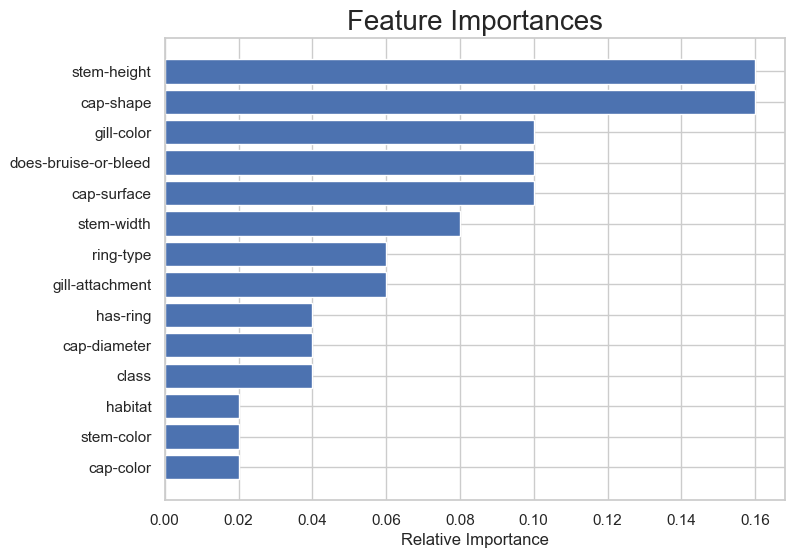

In [183]:
# Plotting the barplot to determine which feature is contributing the most
features = data_1c.columns
importances = clf.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(8,6))
plt.grid(zorder=0)
plt.title('Feature Importances', fontsize=20)
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')
     

,Variable,Importance
2,cap-surface,16.0
8,stem-width,16.0
3,cap-color,10.0
5,gill-attachment,10.0
7,stem-height,10.0
9,stem-color,8.0
6,gill-color,6.0
12,habitat,6.0
0,cap-diameter,4.0
1,cap-shape,4.0


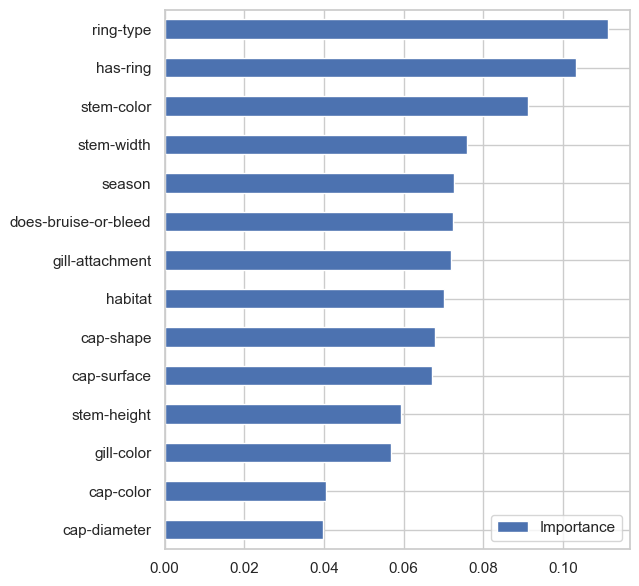

In [184]:
# Using XGBClassifier to gain an insight on Feature Importance
clf = XGBClassifier()
clf.fit(data_1c.drop(['class'], axis=1), data_1c['class'])

# plt.style.use('seaborn-whitegrid')
importance = clf.feature_importances_
importance = pd.DataFrame(importance, index=data_1c.drop('class', axis=1).columns, columns=["Importance"])
importance.sort_values(by='Importance', ascending=True).plot(kind='barh', figsize=(6,len(importance)/2));


# Checking the percentage of feature importance
feature_imp = pd.DataFrame(columns = ['Variable','Importance'])
feature_imp.Variable = features[1:]
feature_imp.Importance = importances*100
feature_imp.sort_values(by="Importance",axis=0,ascending=False)


# Hypothesis Test

## Perform t-test on Numerical Features

In [185]:
numerical_columns = ["cap-diameter","stem-height", "stem-width"]



t_score = {}
p_value = {}
Yes_mean = {}
Yes_std = {}
No_mean = {}
No_std = {}


for column in data_1c[numerical_columns]:
    statistics, p_val = stats.ttest_ind(data_1c[column][data_1c["class"]==1], 
                                     data_1c[column][data_1c["class"]==0], equal_var=True)
    print(f"t_score for {column} : {statistics}")
    print(f"p_value for {column} : {p_val}")
    
    Yes_mean[column] = data_1c[column][data_1c["class"]==1].mean()
    Yes_std[column] = data_1c[column][data_1c["class"]==1].std()
    No_mean[column] = data_1c[column][data_1c["class"]==0].mean()
    No_std[column] = data_1c[column][data_1c["class"]==0].std()
    t_score[column] = statistics
    p_value[column] = p_val


t_score for cap-diameter : -46.36137268773573
p_value for cap-diameter : 0.0
t_score for stem-height : -28.39740896590092
p_value for stem-height : 3.067390872355588e-176
t_score for stem-width : -49.50926987021327
p_value for stem-width : 0.0


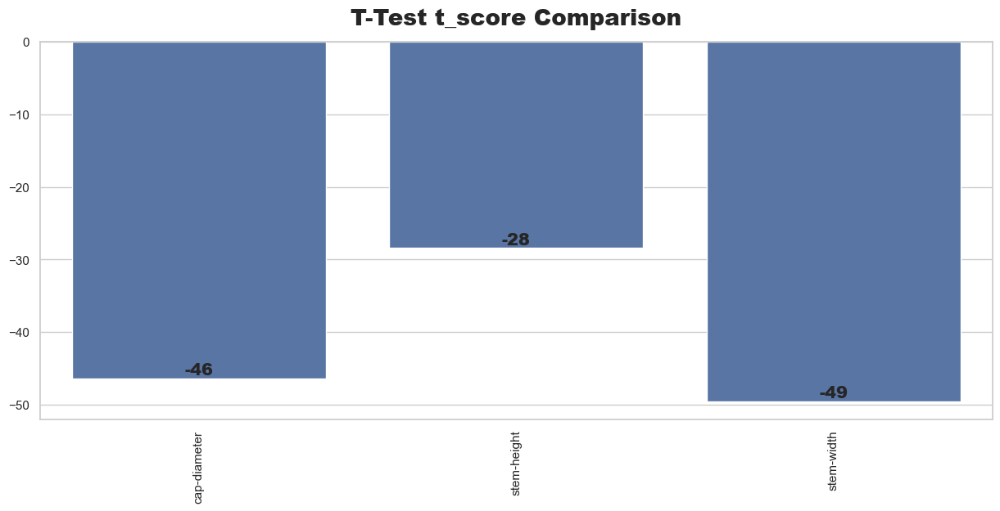

In [186]:
plt.figure(figsize=(15,6))
keys = list(t_score.keys())
values = list(t_score.values())

sns.barplot(x=keys, y=values)
plt.title("T-Test t_score Comparison",fontweight="black",size=20,pad=15)
plt.xticks(rotation=90)

for index,value in enumerate(values):
    plt.text(index,value,int(value), ha="center", va="bottom",fontweight="black",size=15)
plt.show()

In [187]:
test_df = pd.DataFrame({"Features":keys,"T_Score":values})
test_df["P_value"] = [format(p, '.20f') for p in list(p_value.values())]
test_df["Yes_mean"] = [format(i, '.4f') for i in list(Yes_mean.values())]
test_df["No_mean"] = [format(i, '.4f') for i in list(No_mean.values())]
test_df["Yes_std"] = [format(i, '.4f') for i in list(Yes_std.values())]
test_df["No_std"] = [format(i, '.4f') for i in list(No_std.values())]


test_df

,Features,T_Score,P_value,Yes_mean,No_mean,Yes_std,No_std
0,cap-diameter,-46.361373,0.00000000000000000000,542.1817,700.3594,393.2321,449.1014
1,stem-height,-28.397409,0.00000000000000000000,514.7638,588.2739,307.2541,330.7302
2,stem-width,-49.509270,0.00000000000000000000,981.6006,1334.7403,856.6141,899.5901


## PERFORM CHI-SQUARE TEST ON CATEGORICAL FEATURES

In [188]:
cat_cols = ["cap-shape", "cap-surface", "cap-color", "does-bruise-or-bleed", "gill-attachment", "gill-color", "stem-color", "has-ring", "ring-type", "habitat", "season"]
cat_cols

['cap-shape',
 'cap-surface',
 'cap-color',
 'does-bruise-or-bleed',
 'gill-attachment',
 'gill-color',
 'stem-color',
 'has-ring',
 'ring-type',
 'habitat',
 'season']

In [189]:
chi2_statistic = {}
p_values = {}
# dof = {}

# Perform chi-square test for each column
for col in cat_cols:
    contingency_table = pd.crosstab(data_1c[col], data_1c['class'])
    chi2, p_value, dof, _ = chi2_contingency(contingency_table)
    chi2_statistic[col] = chi2
    p_values[col] = p_value
#     dof[col] = dof

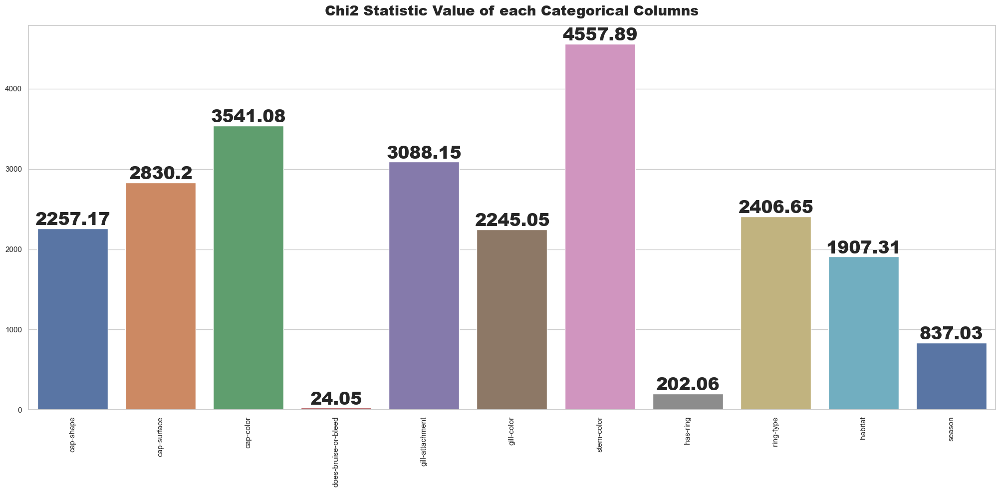

In [190]:
columns = list(chi2_statistic.keys())
values = list(chi2_statistic.values())

plt.figure(figsize=(25, 10))
sns.barplot(x=columns, y=values, palette=sns.color_palette())
plt.xticks(rotation=90)
plt.title("Chi2 Statistic Value of each Categorical Columns",fontweight="black",size=20,pad=15)
for index,value in enumerate(values):
    plt.text(index,value,round(value,2),ha="center",va="bottom",fontweight="black",size=25)

plt.show()


# Data Pre-processing

## a)Class Distribution

In [191]:
Y_value_counts = data_1.groupby('class')['class'].count()
print('The number of users that are accepted the coupon is ',Y_value_counts[1],',',round(Y_value_counts[1]/data_1.shape[0]*100,3),'%')
print('The number of users that are rejected the coupon is ',Y_value_counts[0],',',round(Y_value_counts[0]/data_1.shape[0]*100,3),'%')

The number of users that are accepted the coupon is  33888 , 55.491 %
The number of users that are rejected the coupon is  27181 , 44.509 %


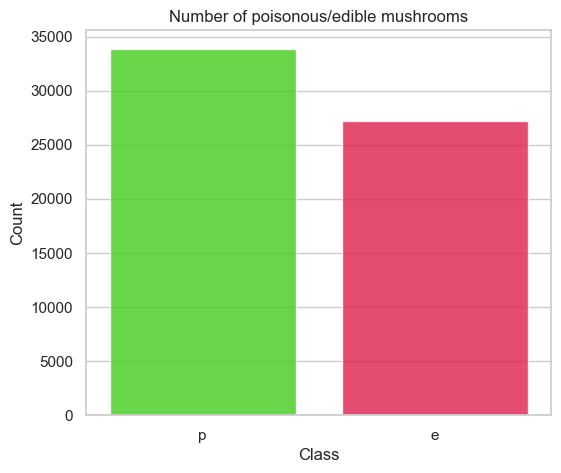

In [192]:
count = data_1['class'].value_counts()
plt.figure(figsize=(6,5))
sns.barplot(x=count.index, y=count.values, alpha=0.8, palette="prism")
plt.ylabel('Count', fontsize=12)
plt.xlabel('Class', fontsize=12)
plt.title('Number of poisonous/edible mushrooms')
#plt.savefig("mushrooms1.png", format='png', dpi=900)
plt.show()

Dataset is partially Balanced.

## b) Duplicate Values

In [193]:
# Dataset Duplicate Value Count

print(f"The total number of duplicated observations in the data_1 : {data_1.duplicated().sum()}")


The total number of duplicated observations in the data_1 : 146


In [194]:
dups = data_1.duplicated()
print("No of duplicate rows = %d" %(dups.sum()))
data_1[dups]

No of duplicate rows = 146


,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-spacing,gill-color,stem-height,stem-width,stem-root,stem-surface,stem-color,veil-type,veil-color,has-ring,ring-type,spore-print-color,habitat,season
9863,p,1.14,x,g,w,f,a,d,w,3.13,1.78,NaN,NaN,e,NaN,NaN,f,f,NaN,d,u
12978,p,0.72,x,g,y,f,NaN,NaN,y,3.51,0.77,NaN,NaN,y,NaN,NaN,f,f,NaN,d,u
56526,p,4.27,o,s,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56533,p,4.29,o,t,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56576,p,4.59,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56582,p,3.92,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,a
56602,p,4.62,o,t,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56637,p,4.74,o,t,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56663,p,4.49,o,s,w,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,u
56670,p,3.50,o,s,n,f,NaN,c,w,0.00,0.00,f,f,f,NaN,NaN,f,f,n,d,a


In [195]:
# Remove duplicates
duplicate = data_1[data_1.duplicated(keep = 'last')]

data_1 = data_1.drop_duplicates()
print(data_1.shape)

(60923, 21)


In [196]:
# Dataset Duplicate Value Count
print(f"The total number of duplicated observations in the dataset: {data_1.duplicated().sum()}")

The total number of duplicated observations in the dataset: 0


## c) Dropping columns 

In [197]:
# Missing values
print("Is there any missing value present or not ?", data_1.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = data_1.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = data_1.isnull().sum()/len(data_1)*100
print(missing_percentage.sort_values(ascending=False))

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
class                       0
cap-diameter                0
cap-shape                   0
cap-surface             14120
cap-color                   0
does-bruise-or-bleed        0
gill-attachment          9855
gill-spacing            25062
gill-color                  0
stem-height                 0
stem-width                  0
stem-root               51536
stem-surface            38122
stem-color                  0
veil-type               57746
veil-color              53510
has-ring                    0
ring-type                2471
spore-print-color       54597
habitat                     0
season                      0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
veil-type              

In [198]:
missing_value_df = pd.DataFrame({'missing_count': data_1.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage
cap-surface,14120,23.176797
gill-attachment,9855,16.176157
gill-spacing,25062,41.137173
stem-root,51536,84.592026
stem-surface,38122,62.574069
veil-type,57746,94.785221
veil-color,53510,87.832182
ring-type,2471,4.055939
spore-print-color,54597,89.616401


<Axes: >

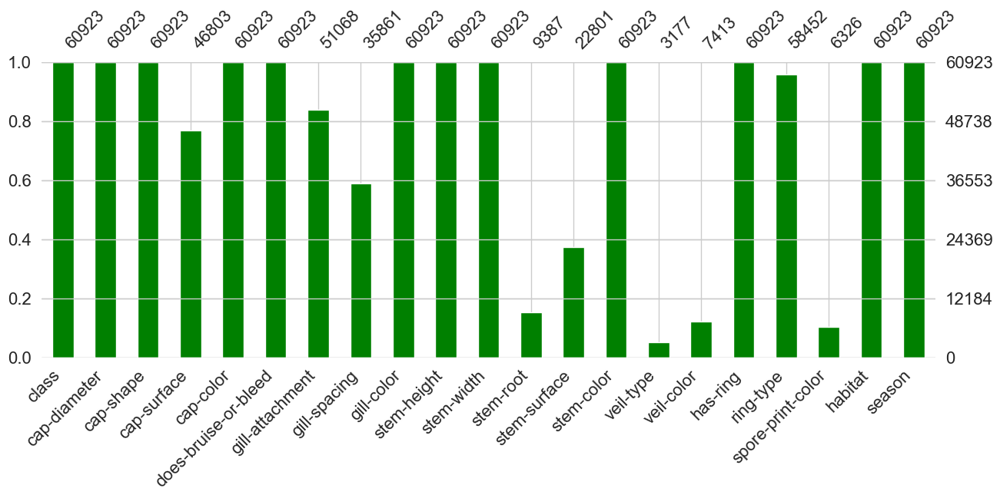

In [199]:
# Visualizing the missing values
missingno.bar(data_1,figsize=(15,5), color="green")

##### Dropping Columns with more than 25% missing values

#### Checking effect of mode imputation and checking statistics before dropping some attributes with morew than 25% missing value.

In [200]:
print("Before Dropping")
print("*"*50)
print("*"*50)
print(" "*50)
print(" "*50)
gill_spacing_mode = data_1["gill-spacing"].mode().values[0]
print(f"The mode in gill-spacing : {gill_spacing_mode}")
print("*"*50)
stem_root_mode = data_1["stem-root"].mode()[0]
print(f"The mode in stem-root : {stem_root_mode}")
print("*"*50)
stem_surface_mode = data_1["stem-surface"].mode()
print(f"The mode in stem-surface : {stem_surface_mode}")
print("*"*50)
veil_type_mode = data_1["veil-type"].mode()
print(f"The mode in veil-type : {veil_type_mode}")
print("*"*50)
veil_color_mode = data_1["veil-color"].mode()
print(f"The mode in veil-color : {veil_color_mode}")
print("*"*50)
spore_print_color_mode = data_1["spore-print-color"].mode()
print(f"The mode in spore-print-color : {spore_print_color_mode}")
print("*"*50)

Before Dropping
**************************************************
**************************************************
                                                  
                                                  
The mode in gill-spacing : c
**************************************************
The mode in stem-root : b
**************************************************
The mode in stem-surface : 0    s
Name: stem-surface, dtype: object
**************************************************
The mode in veil-type : 0    u
Name: veil-type, dtype: object
**************************************************
The mode in veil-color : 0    w
Name: veil-color, dtype: object
**************************************************
The mode in spore-print-color : 0    k
Name: spore-print-color, dtype: object
**************************************************


In [201]:
# mode before dropping
features_af_imp = ["gill-spacing", "stem-root", "stem-surface", "veil-type", "veil-color", "spore-print-color"]
mode = ["c", "b", "s","u", "w", "k"]
df_data = {"features" : features_af_imp, "mode" : mode}
df_af_clt = pd.DataFrame(df_data)
df_af_clt

,features,mode
0,gill-spacing,c
1,stem-root,b
2,stem-surface,s
3,veil-type,u
4,veil-color,w
5,spore-print-color,k


In [202]:
data_1.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-spacing', 'gill-color',
       'stem-height', 'stem-width', 'stem-root', 'stem-surface', 'stem-color',
       'veil-type', 'veil-color', 'has-ring', 'ring-type', 'spore-print-color',
       'habitat', 'season'],
      dtype='object')

In [203]:
# Dropping columns with more than 25% missing values
data_1 = data_1[["class", 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color', 'does-bruise-or-bleed', 
                   'gill-attachment', 'gill-color', 'stem-height', 'stem-width', 'stem-color', 'has-ring', 'ring-type', 
                  'habitat', 'season']]

As veil-type, spore-print-color, veil-color, stem-root, stem-surface, gill-spacing are have more than 25% missing value, so these columns are dropped.


In [204]:
data_1.head()

,class,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
0,p,15.26,x,g,o,f,e,w,16.95,17.09,w,t,g,d,w
1,p,16.60,x,g,o,f,e,w,17.99,18.19,w,t,g,d,u
2,p,14.07,x,g,o,f,e,w,17.80,17.74,w,t,g,d,w
3,p,14.17,f,h,e,f,e,w,15.77,15.98,w,t,p,d,w
4,p,14.64,x,h,o,f,e,w,16.53,17.20,w,t,p,d,w


In [205]:
data_1.describe()

,cap-diameter,stem-height,stem-width
count,60923.000000,60923.000000,60923.000000
mean,6.741957,6.597202,12.178484
std,5.268435,3.358757,10.030361
min,0.380000,0.000000,0.000000
25%,3.490000,4.650000,5.250000
50%,5.880000,5.960000,10.220000
75%,8.550000,7.750000,16.580000
max,62.340000,33.920000,103.910000


In [206]:
# statistics of numerical columns 
features_af_imp = ["cap-diameter", "stem-height", "stem-width"]
mean = [6.74157, 6.597202, 12.178484]
std = [5.268435, 3.358757, 10.030361]
min = [0.380000, 0.000000, 0.000000]
percent_25 = [3.490000, 4.650000, 5.250000]
median = [5.880000, 5.960000, 10.220000]
percent_75 = [8.550000, 5.960000, 10.220000]
max	 = [62.340000, 33.920000, 16.580000]
df_data = {"features" : features_af_imp, "mean" : mean, "std" : std, "min" : min, "25%" : percent_25, "median" : median, 
           "75%":percent_75, "max":max}
df_af_clt = pd.DataFrame(df_data)
df_af_clt

,features,mean,std,min,25%,median,75%,max
0,cap-diameter,6.741570,5.268435,0.38,3.49,5.88,8.55,62.34
1,stem-height,6.597202,3.358757,0.00,4.65,5.96,5.96,33.92
2,stem-width,12.178484,10.030361,0.00,5.25,10.22,10.22,16.58


In [207]:
for i in data_1.columns:
    print("******************************", i, "******************************************")
    print()
    print(set(data_1c[i].tolist()))
    print()

****************************** class ******************************************

{0, 1}

****************************** cap-diameter ******************************************

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 18

In [208]:
data_1.isnull().sum()/data_1.shape[0]*100

class                    0.000000
cap-diameter             0.000000
cap-shape                0.000000
cap-surface             23.176797
cap-color                0.000000
does-bruise-or-bleed     0.000000
gill-attachment         16.176157
gill-color               0.000000
stem-height              0.000000
stem-width               0.000000
stem-color               0.000000
has-ring                 0.000000
ring-type                4.055939
habitat                  0.000000
season                   0.000000
dtype: float64

## d) Data Splitting

In [209]:
# Splitting our data to train and test. Choose Splitting ratio wisely.
x= data_1.drop(columns='class',axis=1)
y= data_1[['class']]

## Importing train_test_split from sklearn
from sklearn.model_selection import train_test_split

## Spliting data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0, stratify=y)
     


In [210]:
# Checking the distribution of classes in training and testing sets
print("Distribution of classes of dependent variable in train :")
print(y_train.value_counts())

print("Distribution of classes of dependent variable in test :")
print(y_test.value_counts())
     

Distribution of classes of dependent variable in train :
class
p        26993
e        21745
Name: count, dtype: int64
Distribution of classes of dependent variable in test :
class
p        6749
e        5436
Name: count, dtype: int64


## e) Handling Missing Value

#### e)1) x_train Missing value Treatment

In [211]:
# Missing values
print("Is there any missing value present or not ?", x_train.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_train.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_train.isnull().sum()/len(x_train)*100
print(missing_percentage.sort_values(ascending=False))

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
cap-diameter                0
cap-shape                   0
cap-surface             11338
cap-color                   0
does-bruise-or-bleed        0
gill-attachment          7850
gill-color                  0
stem-height                 0
stem-width                  0
stem-color                  0
has-ring                    0
ring-type                2000
habitat                     0
season                      0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
cap-surface             23.263162
gill-attachment         16.106529
ring-type                4.103574
cap-diameter             0.000000
cap-shape                0.000000
cap-color                0.000000
does-bruise-or-bleed     0.00

In [212]:
missing_value_df = pd.DataFrame({'missing_count': x_train.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage
cap-surface,11338,23.263162
gill-attachment,7850,16.106529
ring-type,2000,4.103574


<Axes: >

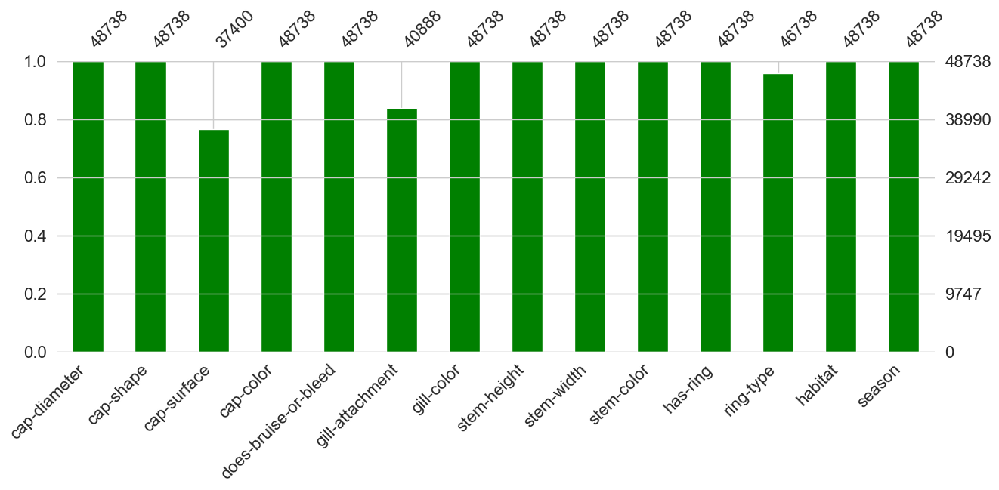

In [213]:
# Visualizing the missing values
missingno.bar(x_train,figsize=(15,5), color="green")


cap-surface, gill-attachment, ring-type	attributes have missing values less than 25%, here we can impute mode for missing values.

In [214]:
# Checking mode of 3 features having missing values
print("mode of cap-surface")
print(x_train["cap-surface"].mode())
print("*"*50)
print("mode of gill-attachment")
print(x_train["gill-attachment"].mode())
print("*"*50)
print("mode of ring-type")
print(x_train["ring-type"].mode())

mode of cap-surface
0    t
Name: cap-surface, dtype: object
**************************************************
mode of gill-attachment
0    a
Name: gill-attachment, dtype: object
**************************************************
mode of ring-type
0    f
Name: ring-type, dtype: object


In [215]:
# mode before impution
features_af_imp = ["cap-surface", "gill-attachment", "ring-type"]
mode = ["t", "a", "f"]
df_data = {"features" : features_af_imp, "mode" : mode}
df_af_clt = pd.DataFrame(df_data)
df_af_clt

,features,mode
0,cap-surface,t
1,gill-attachment,a
2,ring-type,f


In [216]:
missing_value_df = pd.DataFrame({'missing_count': x_train.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage
cap-surface,11338,23.263162
gill-attachment,7850,16.106529
ring-type,2000,4.103574


#### Missing Value Imputation x_train

In [217]:
mode1 = x_train["cap-surface"].mode().values[0]
mode2 = x_train["gill-attachment"].mode().values[0]
mode3 = x_train["ring-type"].mode().values[0]

x_train["cap-surface"].replace(np.nan, mode1, inplace=True)
x_train["gill-attachment"].replace(np.nan, mode2, inplace=True)
x_train["ring-type"].replace(np.nan, mode3, inplace=True)

In [218]:
missing_value_df = pd.DataFrame({'missing_count': x_train.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage


#### e)2) x_test Missing value Treatment

In [219]:
# Missing values
print("Is there any missing value present or not ?", x_test.isnull().values.any())
print("**************************************************************************")
print("Number of missing values")
print("-------------------------------------")
missing_values = x_test.isnull().sum()
print(missing_values)
print("**************************************************************************")
print("Missing Percentage of Null Values")
print("-------------------------------------")
missing_percentage = x_test.isnull().sum()/len(data_1)*100
print(missing_percentage.sort_values(ascending=False))

Is there any missing value present or not ? True
**************************************************************************
Number of missing values
-------------------------------------
cap-diameter               0
cap-shape                  0
cap-surface             2782
cap-color                  0
does-bruise-or-bleed       0
gill-attachment         2005
gill-color                 0
stem-height                0
stem-width                 0
stem-color                 0
has-ring                   0
ring-type                471
habitat                    0
season                     0
dtype: int64
**************************************************************************
Missing Percentage of Null Values
-------------------------------------
cap-surface             4.566420
gill-attachment         3.291040
ring-type               0.773107
cap-diameter            0.000000
cap-shape               0.000000
cap-color               0.000000
does-bruise-or-bleed    0.000000
gill-color      

<Axes: >

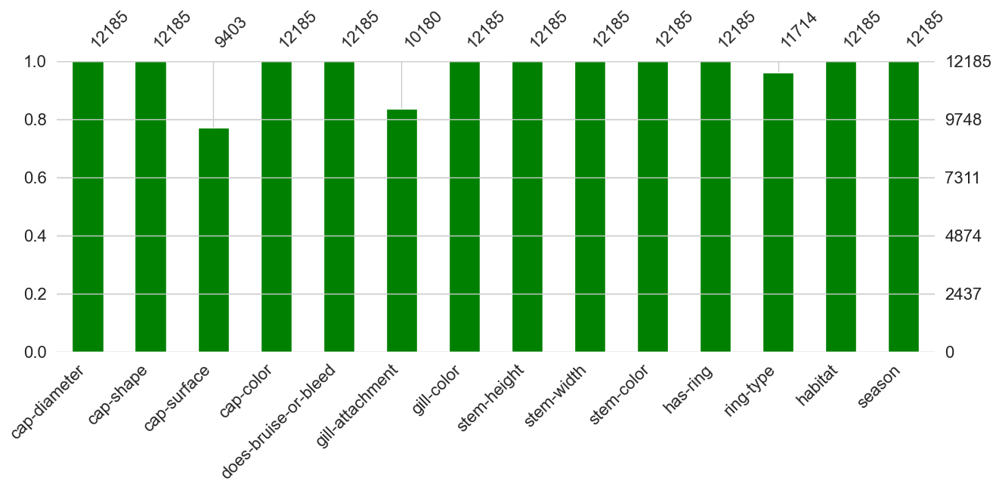

In [220]:
# Visualizing the missing values
missingno.bar(x_test,figsize=(15,5), color="green")

In [221]:
missing_value_df = pd.DataFrame({'missing_count': x_test.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage
cap-surface,2782,4.566420
gill-attachment,2005,3.291040
ring-type,471,0.773107



cap-surface, gill-attachment, ring-type	attributes have missing values less than 25%, here we can impute mode for missing values.

In [222]:
# checking mode 3 features in test data having missing values
x_test["cap-surface"].mode().values[0]
x_test["gill-attachment"].mode().values[0]
x_test["ring-type"].mode().values[0]


'f'

In [223]:
mode1 = x_test["cap-surface"].mode().values[0]
mode2 = x_test["gill-attachment"].mode().values[0]
mode3 = x_test["ring-type"].mode().values[0]

x_test["cap-surface"].replace(np.nan, mode1, inplace=True)
x_test["gill-attachment"].replace(np.nan, mode2, inplace=True)
x_test["ring-type"].replace(np.nan, mode3, inplace=True)

In [224]:
missing_value_df = pd.DataFrame({'missing_count': x_test.isnull().sum(),'missing_percentage': missing_percentage})
missing_value_df[missing_value_df.missing_count != 0]

,missing_count,missing_percentage


In [225]:
for i in x_train.columns:
    print("******************************", i, "******************************************")
    print()
    print(set(x_train[i].tolist()))
    print()

****************************** cap-diameter ******************************************

{0.75, 1.0, 1.5, 1.25, 4.43, 5.66, 6.0, 4.0, 8.57, 9.3, 9.89, 10.18, 5.5, 6.75, 6.25, 6.5, 16.66, 16.0, 18.63, 18.13, 20.52, 20.25, 19.53, 18.54, 19.82, 22.32, 21.49, 18.5, 19.78, 4.25, 4.5, 22.22, 5.75, 5.25, 5.0, 1.75, 7.5, 7.25, 7.0, 38.79, 7.75, 8.5, 8.75, 8.25, 44.76, 42.27, 9.0, 9.25, 48.63, 47.82, 50.62, 51.42, 10.0, 10.75, 50.46, 9.75, 11.5, 11.25, 2.75, 2.0, 11.75, 12.0, 12.75, 2.25, 2.5, 11.0, 13.0, 13.5, 12.5, 13.75, 13.25, 14.5, 14.0, 14.75, 14.25, 15.0, 15.5, 15.75, 15.25, 3.0, 16.5, 3.75, 3.25, 3.5, 17.5, 17.0, 17.25, 16.25, 5.22, 18.0, 17.75, 18.25, 6.72, 6.97, 19.0, 19.25, 19.5, 7.47, 19.75, 20.0, 20.5, 4.75, 21.75, 21.25, 21.0, 24.25, 24.75, 25.5, 0.5, 8.44, 8.94, 9.19, 9.44, 9.69, 10.69, 10.44, 10.94, 11.69, 11.19, 11.94, 11.44, 12.19, 12.94, 12.44, 13.44, 13.19, 13.69, 13.94, 14.19, 14.69, 14.44, 15.69, 15.44, 8.0, 15.94, 45.25, 9.5, 46.0, 47.0, 48.75, 49.25, 0.84, 10.25, 10.5, 0.

In [226]:
for i in x_test.columns:
    print("******************************", i, "******************************************")
    print()
    print(set(x_test[i].tolist()))
    print()

****************************** cap-diameter ******************************************

{0.5, 1.0, 1.5, 3.25, 4.16, 5.52, 5.43, 7.5, 4.5, 9.84, 9.54, 9.59, 12.8, 5.5, 14.29, 15.48, 16.73, 16.95, 18.39, 19.46, 20.04, 12.25, 13.25, 23.62, 24.2, 3.5, 5.75, 18.75, 20.03, 20.75, 4.0, 1.75, 6.25, 6.75, 6.0, 5.25, 7.25, 7.0, 7.75, 1.25, 0.75, 8.75, 8.25, 40.02, 44.43, 45.32, 9.25, 9.5, 48.31, 49.95, 50.22, 10.0, 52.3, 53.3, 54.3, 9.0, 2.75, 11.75, 2.0, 2.5, 11.0, 12.75, 2.25, 11.5, 12.0, 57.4, 13.0, 12.5, 14.25, 15.0, 15.75, 15.5, 15.25, 3.75, 3.0, 16.5, 4.22, 17.0, 17.25, 18.25, 6.72, 6.47, 7.47, 7.97, 20.5, 21.5, 4.25, 21.25, 4.75, 22.5, 23.5, 24.5, 5.0, 6.5, 8.69, 9.44, 9.19, 9.69, 9.94, 10.19, 10.69, 10.94, 11.44, 11.94, 11.19, 12.69, 12.19, 12.94, 12.44, 13.19, 13.69, 13.94, 14.69, 14.94, 14.44, 15.94, 15.69, 8.0, 8.5, 15.44, 15.19, 9.75, 10.5, 10.75, 0.59, 10.25, 0.84, 52.0, 52.75, 11.25, 16.38, 16.63, 16.13, 16.88, 17.38, 17.88, 17.63, 18.13, 18.38, 19.13, 19.88, 20.88, 20.63, 22.63, 2

In [227]:
x_train.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
37657,2.04,p,t,n,f,a,n,5.63,2.38,y,t,e,m,u
4007,3.67,x,y,y,f,a,w,4.99,3.46,n,t,r,h,u
1878,5.24,x,t,y,f,e,w,5.90,11.99,w,t,g,d,u
6280,7.45,f,t,g,f,d,y,6.33,11.17,n,f,f,l,w
43656,10.88,x,y,n,t,e,p,9.20,18.34,w,t,p,l,a


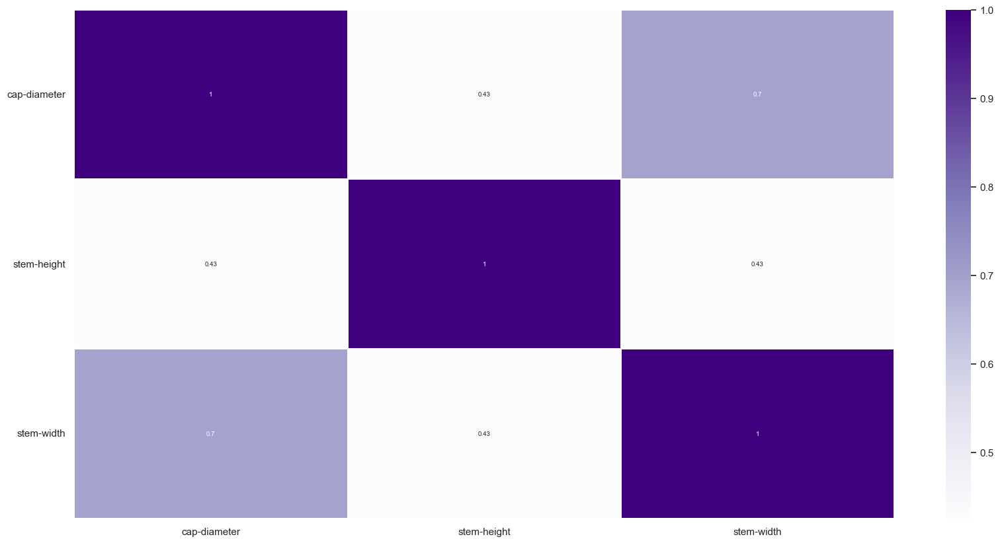

In [228]:
plt.figure(figsize=(20,10))
sns.heatmap(x_train.corr(numeric_only=True),linewidths=.1,cmap="Purples", annot=True, annot_kws={"size": 7})
plt.yticks(rotation=0);
#plt.savefig("corr.png", format='png', dpi=900, bbox_inches='tight')

## f) Encoding

In [229]:
x_train.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
37657,2.04,p,t,n,f,a,n,5.63,2.38,y,t,e,m,u
4007,3.67,x,y,y,f,a,w,4.99,3.46,n,t,r,h,u
1878,5.24,x,t,y,f,e,w,5.90,11.99,w,t,g,d,u
6280,7.45,f,t,g,f,d,y,6.33,11.17,n,f,f,l,w
43656,10.88,x,y,n,t,e,p,9.20,18.34,w,t,p,l,a


In [230]:
x_test.head()

,cap-diameter,cap-shape,cap-surface,cap-color,does-bruise-or-bleed,gill-attachment,gill-color,stem-height,stem-width,stem-color,has-ring,ring-type,habitat,season
2674,5.52,c,t,n,f,e,w,12.10,10.91,n,f,f,d,a
30203,9.84,s,t,p,t,d,p,6.76,14.07,p,t,f,d,u
5482,7.31,x,t,n,f,s,g,5.50,19.91,u,f,f,d,w
52594,6.54,x,h,y,f,p,y,8.16,15.46,y,t,f,d,u
51506,4.16,x,t,o,f,p,n,5.56,12.32,e,f,f,d,u


In [231]:
ohe_cols_train = x_train.dtypes[x_train.dtypes==object].index.values
ohe_cols_train

array(['cap-shape', 'cap-surface', 'cap-color', 'does-bruise-or-bleed',
       'gill-attachment', 'gill-color', 'stem-color', 'has-ring',
       'ring-type', 'habitat', 'season'], dtype=object)

In [232]:
from feature_engine.encoding import OneHotEncoder

ohe_enc = OneHotEncoder(drop_last=True)
x_train = ohe_enc.fit_transform(x_train)
x_test = ohe_enc.transform(x_test)
x_train.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
37657,2.04,5.63,2.38,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
4007,3.67,4.99,3.46,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
1878,5.24,5.90,11.99,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
6280,7.45,6.33,11.17,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
43656,10.88,9.20,18.34,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1


In [233]:
x_test.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
2674,5.52,12.10,10.91,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
30203,9.84,6.76,14.07,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
5482,7.31,5.50,19.91,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
52594,6.54,8.16,15.46,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
51506,4.16,5.56,12.32,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0


In [234]:
# # Applying one hot encoder on object type variables
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import OneHotEncoder

# encoder = OneHotEncoder(drop="first", sparse_output=False)

# ohe = ColumnTransformer(
#     transformers=[("ohe", encoder, ohe_cols_train),],
#     remainder="passthrough",
# )
# ohe.set_output(transform="pandas")

# x_train = ohe.fit_transform(x_train)
# x_test = ohe.transform(x_test)


In [235]:
x_train.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
37657,2.04,5.63,2.38,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
4007,3.67,4.99,3.46,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
1878,5.24,5.90,11.99,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
6280,7.45,6.33,11.17,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
43656,10.88,9.20,18.34,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1


In [236]:
x_test.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
2674,5.52,12.10,10.91,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
30203,9.84,6.76,14.07,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
5482,7.31,5.50,19.91,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
52594,6.54,8.16,15.46,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
51506,4.16,5.56,12.32,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0


In [237]:
# # Applying one hot encoder on object type variables

# ohe_cols_train = x_train.dtypes[x_train.dtypes==object].index.values
# ohe_cols_test = x_test.dtypes[x_test.dtypes==object].index.values 

# x_train = pd.get_dummies(x_train, columns=ohe_cols_train, drop_first=True)
# x_test = pd.get_dummies(x_test, columns=ohe_cols_test, drop_first=True)


In [238]:
# # Applying label encoder

# from sklearn.preprocessing import LabelEncoder,OneHotEncoder
# for c in x_train.columns[x_train.dtypes == 'object']:
#     le = LabelEncoder()
#     x_train[c] = le.fit_transform(x_train[c])
#     x_test[c] = le.transform(x_test[c])

In [239]:
x_test.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
2674,5.52,12.10,10.91,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
30203,9.84,6.76,14.07,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
5482,7.31,5.50,19.91,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
52594,6.54,8.16,15.46,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
51506,4.16,5.56,12.32,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0


In [240]:
data_1.columns

Index(['class', 'cap-diameter', 'cap-shape', 'cap-surface', 'cap-color',
       'does-bruise-or-bleed', 'gill-attachment', 'gill-color', 'stem-height',
       'stem-width', 'stem-color', 'has-ring', 'ring-type', 'habitat',
       'season'],
      dtype='object')

## g) Data Scaling

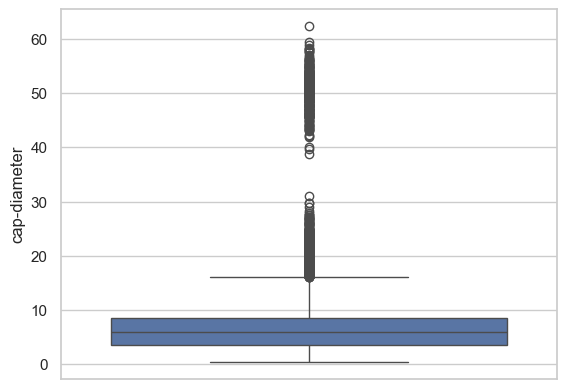

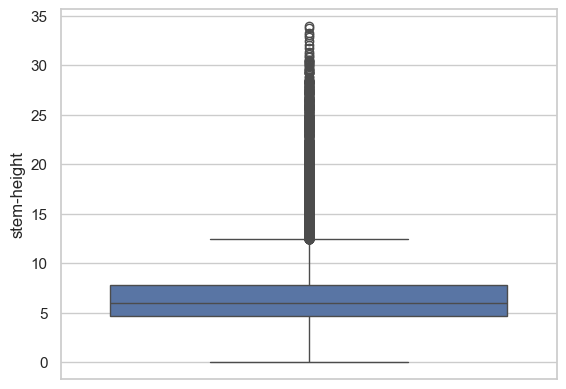

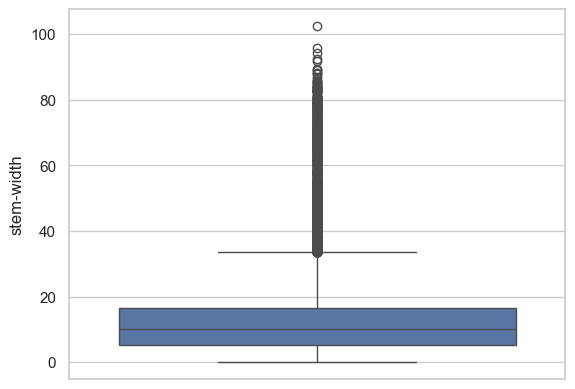

In [241]:
def boxplots(col):
    sns.boxplot(x_train[col])
    plt.show()
    
for i in list(["cap-diameter", "stem-height", "stem-width"]):
    boxplots(i)

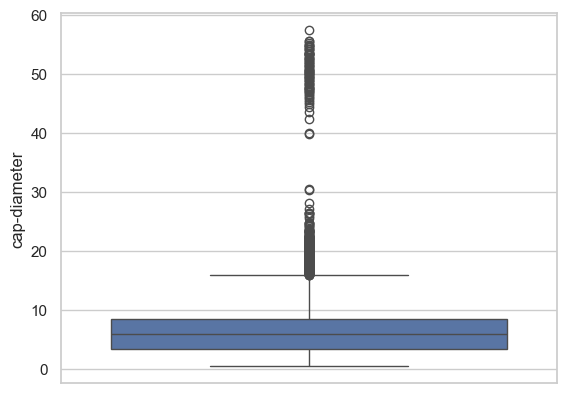

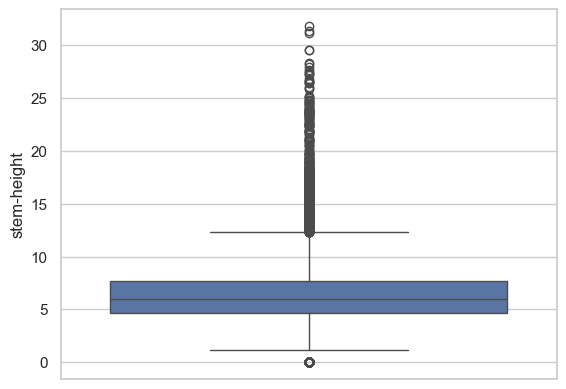

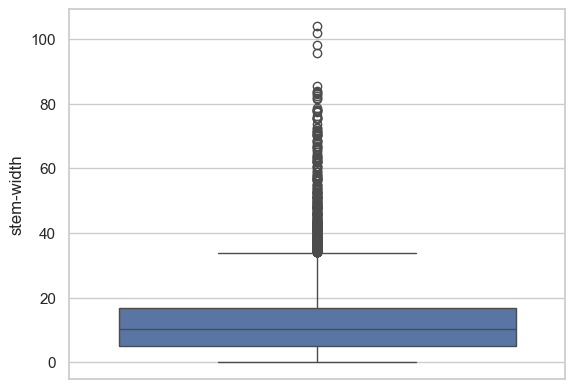

In [242]:
def boxplots(col):
    sns.boxplot(x_test[col])
    plt.show()
    
for i in list(["cap-diameter", "stem-height", "stem-width"]):
    boxplots(i)

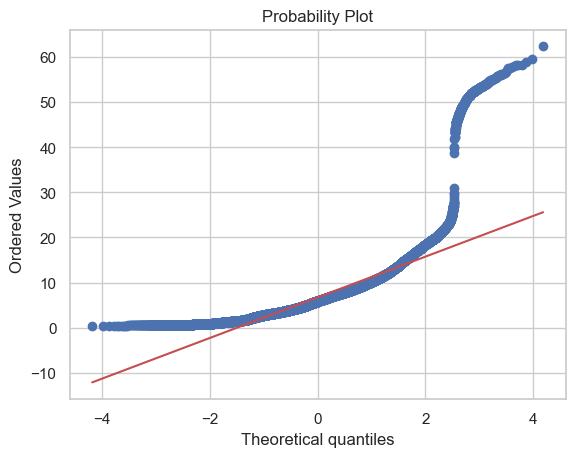

stat=40445.530, p=0.000

probably non gaussian


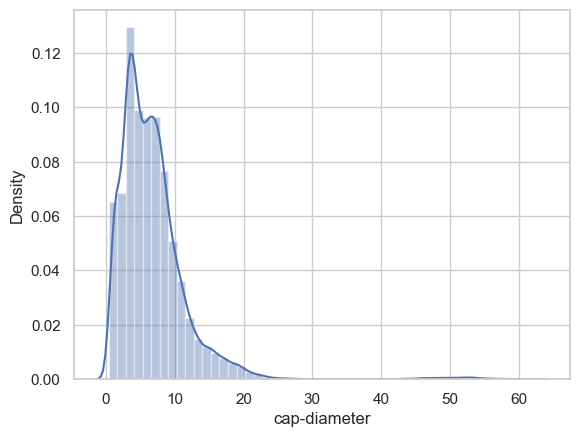

In [243]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_train['cap-diameter']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

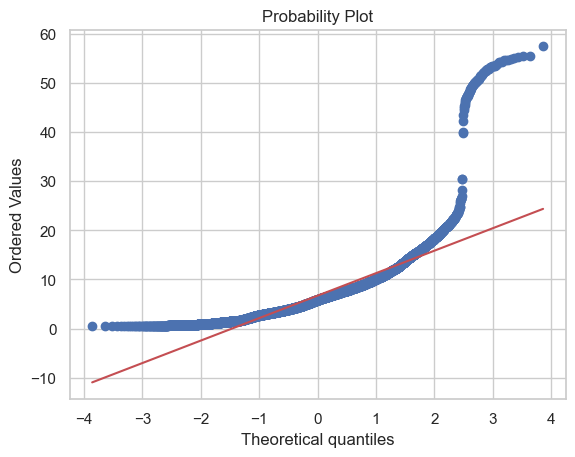

stat=10382.001, p=0.000

probably non gaussian


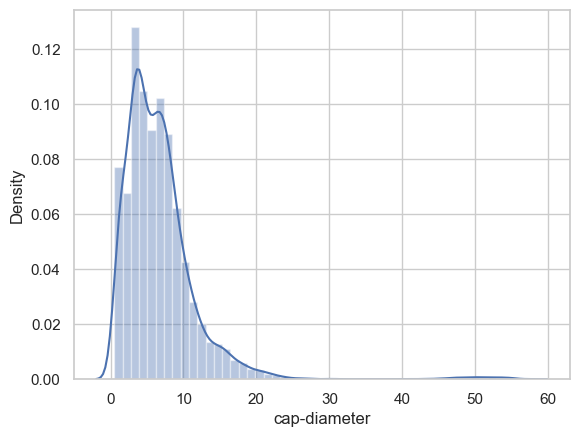

In [244]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_test['cap-diameter']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

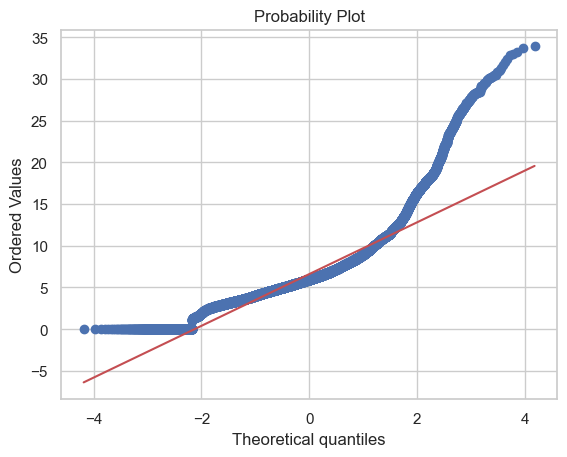

stat=22248.643, p=0.000

probably non gaussian


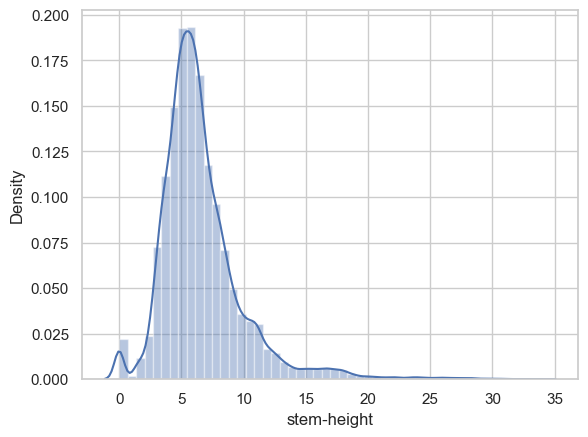

In [245]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_train['stem-height']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

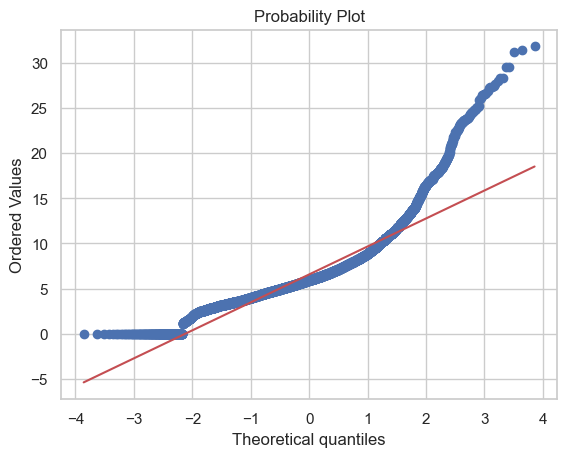

stat=5324.568, p=0.000

probably non gaussian


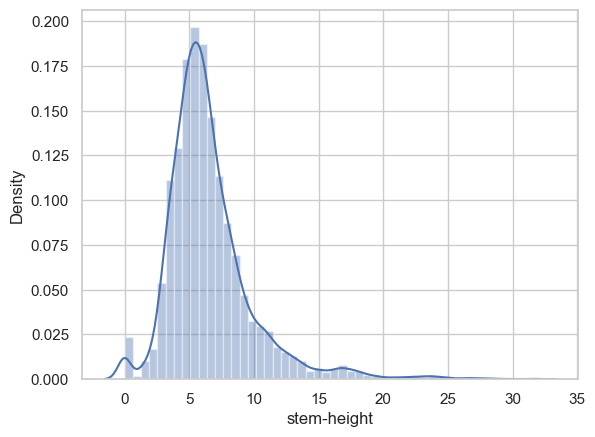

In [246]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_test['stem-height']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

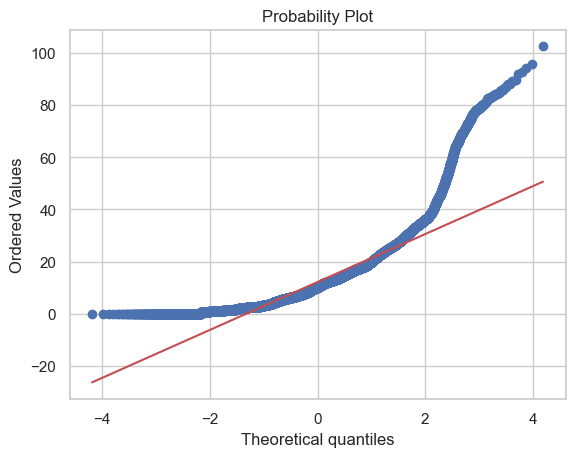

stat=23711.798, p=0.000

probably non gaussian


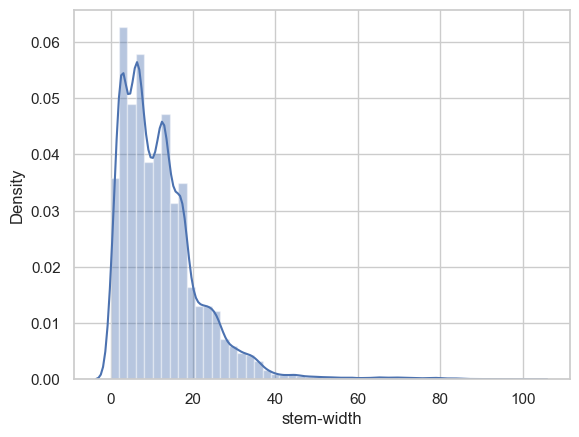

In [247]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_train['stem-width']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

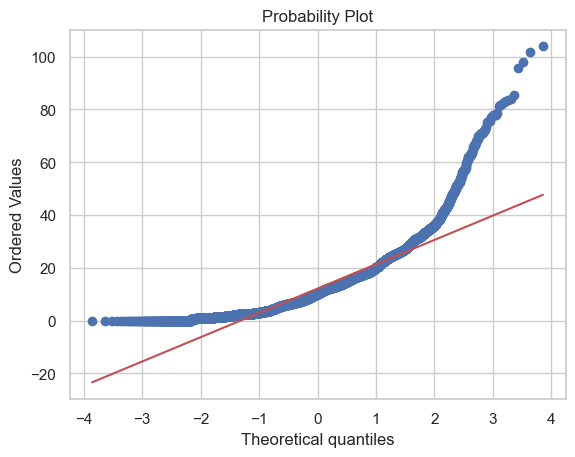

stat=5781.987, p=0.000

probably non gaussian


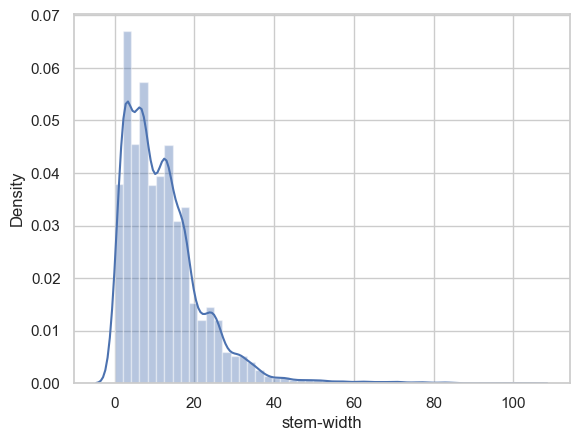

In [248]:
import pylab
import scipy.stats as stats
import seaborn as sns
from scipy.stats import normaltest

measurements = x_test['stem-width']
stats.probplot(measurements, dist='norm', plot=pylab)
pylab.show()
ax = sns.distplot(measurements)
stat,p = normaltest(measurements)

print('stat=%.3f, p=%.3f\n' % (stat, p))
if p > 0.05:
  print('probably gaussian')
else:
  print('probably non gaussian')

As from the above explanation, we found that there is outliers and numerical columns are non gaussian. So, we need to to standardization.

In [249]:
x_train[["cap-diameter", "stem-height", "stem-width"]].describe()

,cap-diameter,stem-height,stem-width
count,48738.000000,48738.000000,48738.000000
mean,6.747553,6.601928,12.191543
std,5.237868,3.361529,10.031911
min,0.380000,0.000000,0.000000
25%,3.500000,4.650000,5.280000
50%,5.880000,5.960000,10.240000
75%,8.570000,7.760000,16.580000
max,62.340000,33.920000,102.480000


In [250]:
x_train.dtypes

cap-diameter              float64
stem-height               float64
stem-width                float64
cap-shape_p                 int32
cap-shape_x                 int32
cap-shape_f                 int32
cap-shape_b                 int32
cap-shape_s                 int32
cap-shape_o                 int32
cap-surface_t               int32
cap-surface_y               int32
cap-surface_i               int32
cap-surface_g               int32
cap-surface_h               int32
cap-surface_s               int32
cap-surface_l               int32
cap-surface_w               int32
cap-surface_d               int32
cap-surface_k               int32
cap-color_n                 int32
cap-color_y                 int32
cap-color_g                 int32
cap-color_k                 int32
cap-color_l                 int32
cap-color_o                 int32
cap-color_w                 int32
cap-color_e                 int32
cap-color_b                 int32
cap-color_u                 int32
cap-color_r   

In [251]:
# # Importing StandardScaler for Data Scaling
# from sklearn.preprocessing import StandardScaler

# # Creating object
# std_scaler = StandardScaler()

# # Fit and Transform
# x_scaled_train= std_scaler.fit_transform(x_train)
# x_scaled_train = pd.DataFrame(x_scaled_train, columns=x_train.columns)
# x_scaled_test= std_scaler.transform(x_test)
# x_scaled_test = pd.DataFrame(x_scaled_test, columns=x_test.columns)


In [252]:
# Importing StandardScaler for Data Scaling
from sklearn.preprocessing import StandardScaler

# Creating object
std_scaler = StandardScaler().set_output(transform="pandas")


# Fit and Transform
x_train[["cap-diameter", "stem-height", "stem-width"]]= std_scaler.fit_transform(x_train[["cap-diameter", "stem-height", "stem-width"]])
# x_scaled_train = pd.DataFrame(x_train, columns=x_train.columns)
x_test[["cap-diameter", "stem-height", "stem-width"]]= std_scaler.transform(x_test[["cap-diameter", "stem-height", "stem-width"]])
# x_scaled_test = pd.DataFrame(x_test, columns=x_test.columns)
x_test.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
2674,-0.234364,1.635603,-0.127748,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1
30203,0.590408,0.047024,0.187250,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
5482,0.107382,-0.327809,0.769398,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
52594,-0.039626,0.463506,0.325809,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
51506,-0.494014,-0.309960,0.012805,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0


In [253]:
x_train.head()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
37657,-0.898763,-0.289136,-0.978043,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
4007,-0.587564,-0.479527,-0.870386,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
1878,-0.287821,-0.208814,-0.020090,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0
6280,0.134111,-0.080895,-0.101830,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0
43656,0.788964,0.772892,0.612896,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1


In [254]:
# # Importing StandardScaler for Data Scaling
# from sklearn.preprocessing import StandardScaler

# # Creating object
# std_scaler = StandardScaler()

# # Fit and Transform
# x_train[["cap-diameter", "stem-height", "stem-width"]]= std_scaler.fit_transform(x_train[["cap-diameter", "stem-height", "stem-width"]])
# x_scaled_train = pd.DataFrame(x_train, columns=x_train.columns)
# x_test[["cap-diameter", "stem-height", "stem-width"]]= std_scaler.transform(x_test[["cap-diameter", "stem-height", "stem-width"]])
# x_scaled_test = pd.DataFrame(x_test, columns=x_test.columns)


In [255]:
print("class distribution on y_train : ", y_train.value_counts())
print("class distribution on y_test : ", y_test.value_counts())

class distribution on y_train :  class
p        26993
e        21745
Name: count, dtype: int64
class distribution on y_test :  class
p        6749
e        5436
Name: count, dtype: int64


In [256]:
# Label encoding of revenue
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

y_train = le.fit_transform(y_train)
y_train = pd.DataFrame(y_train, columns=["class"])
print("class distribution on y_train : ", y_train.value_counts())

y_test = le.transform(y_test)
y_test = pd.DataFrame(y_test, columns=["class"])
print("class distribution on y_test : ", y_test.value_counts())

class distribution on y_train :  class
1        26993
0        21745
Name: count, dtype: int64
class distribution on y_test :  class
1        6749
0        5436
Name: count, dtype: int64


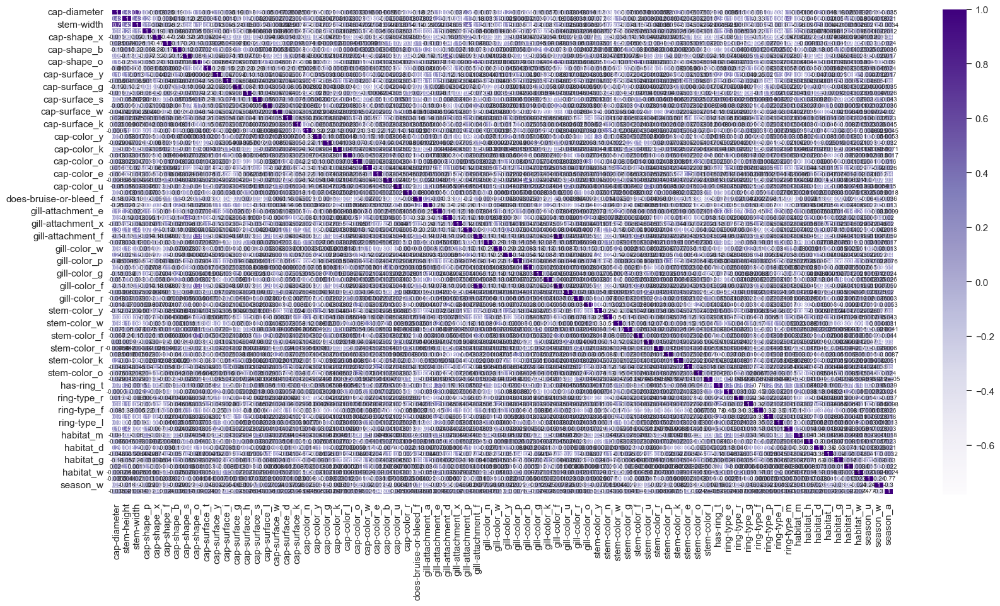

In [257]:
plt.figure(figsize=(20,10))
sns.heatmap(x_train.corr(),linewidths=.1,cmap="Purples", annot=True, annot_kws={"size": 7})
plt.yticks(rotation=0);
#plt.savefig("corr.png", format='png', dpi=900, bbox_inches='tight')

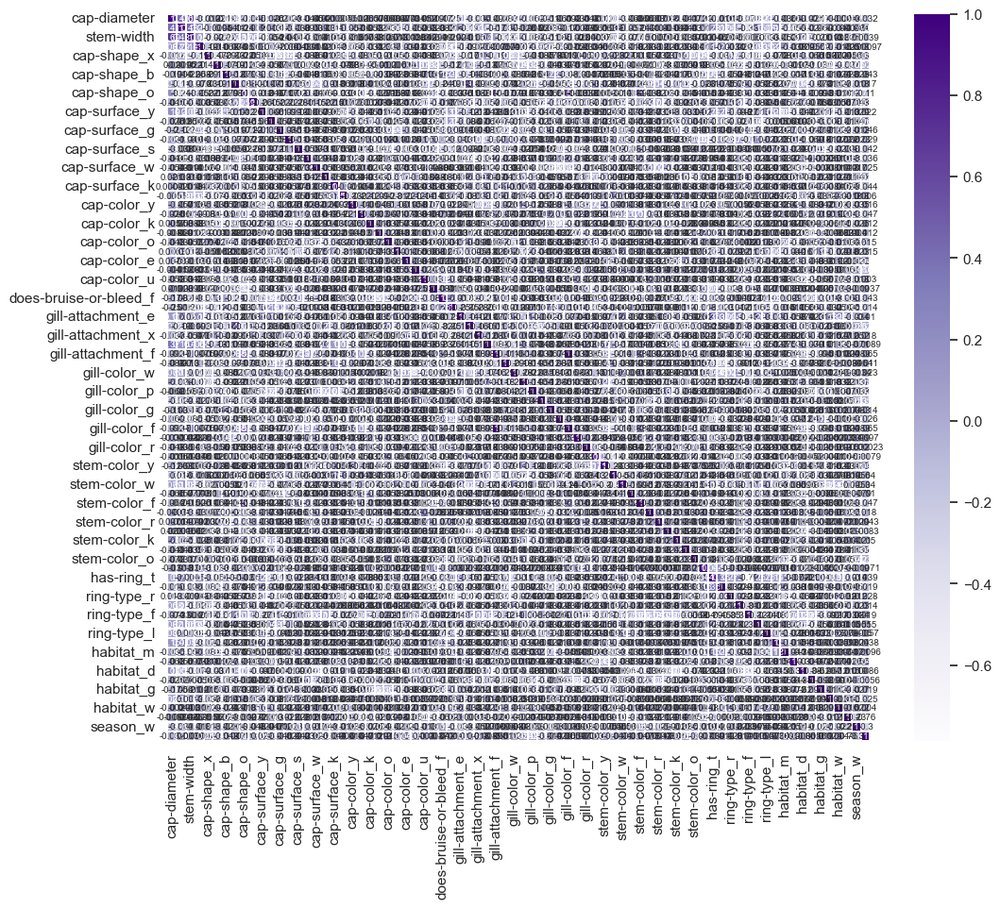

In [258]:
plt.figure(figsize=(12,10))
sns.heatmap(x_test.corr(),linewidths=.1,cmap="Purples", annot=True, annot_kws={"size": 7})
plt.yticks(rotation=0);
#plt.savefig("corr.png", format='png', dpi=900, bbox_inches='tight')

In [259]:
x_train.shape

(48738, 78)

In [260]:
x_train.corr()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
cap-diameter,1.000000,0.425145,0.695448,0.095146,-0.012634,0.024762,-0.189788,0.050059,0.142205,-0.039586,0.163079,-0.036309,-0.192290,-0.018202,0.029474,-0.050026,-0.046705,0.026221,0.024619,-0.006621,0.054329,-0.028892,0.031472,-0.013206,-0.032968,0.015776,-0.004046,-0.005555,-0.050384,0.028380,-0.181372,-0.252277,0.122036,0.036233,-0.036703,0.357419,-0.104043,-0.078451,0.085716,0.215957,-0.059582,0.055878,-0.106748,-0.057223,-0.104043,-0.032973,-0.048444,-0.014189,-0.122426,0.032936,0.087732,-0.071445,-0.066503,0.009963,-0.000579,0.024537,0.205239,-0.045815,-0.076204,-0.029031,0.078085,-0.009533,0.015250,0.088386,-0.080955,0.075918,0.033789,0.156700,-0.041315,-0.065648,0.210641,-0.048201,-0.178348,0.025738,-0.003237,-0.005483,0.051785,-0.034546
stem-height,0.425145,1.000000,0.433356,0.284713,0.063375,0.003411,0.015386,-0.116912,-0.245839,-0.008411,0.188115,0.001092,-0.103676,0.074344,-0.052439,-0.095488,-0.027499,-0.022937,-0.099253,0.123590,-0.058138,-0.066640,-0.051102,-0.033205,-0.023423,0.042613,0.033553,-0.055001,-0.056128,-0.013193,-0.073166,-0.020574,0.254588,-0.192188,0.046748,0.165532,-0.182451,-0.033473,0.179326,-0.024518,-0.004581,-0.031105,-0.038912,0.095979,-0.182451,0.005268,-0.030966,-0.070123,-0.072285,0.031401,0.152275,-0.059725,-0.242351,0.003921,-0.041826,0.001610,-0.041547,-0.048107,-0.031740,-0.012155,0.280834,0.114498,0.044571,0.172202,-0.328800,0.136409,0.065852,0.416944,0.032572,-0.045535,0.061759,-0.031263,-0.056785,0.157010,-0.047961,0.004415,-0.018133,0.021124
stem-width,0.695448,0.433356,1.000000,0.145499,0.019711,-0.025460,-0.219517,0.066242,0.120807,0.062576,0.012565,-0.065125,-0.214763,-0.049678,0.002156,0.070603,-0.000293,0.024582,0.007360,0.053134,-0.016833,-0.025857,0.031024,-0.015901,-0.046772,0.026572,-0.013231,-0.009920,-0.037709,0.013688,-0.181018,-0.287863,0.021867,-0.017704,-0.052929,0.405189,0.118950,-0.125854,0.059565,0.163713,-0.086250,0.062689,-0.102192,-0.082972,0.118950,-0.024528,-0.038934,-0.001623,-0.090834,0.072689,0.082987,-0.077950,-0.149964,0.050375,-0.000376,-0.000586,0.053529,-0.045087,-0.081669,-0.028642,-0.001498,-0.025081,-0.006051,0.045128,-0.005036,0.061423,-0.000800,0.058759,-0.059852,-0.097718,0.222441,-0.006371,-0.210316,0.001091,0.002590,-0.021430,0.049784,-0.003411
cap-shape_p,0.095146,0.284713,0.145499,1.000000,-0.188190,-0.113196,-0.067635,-0.077353,-0.050796,-0.008115,0.100950,0.001056,0.042967,-0.063639,0.006824,-0.031425,-0.008422,-0.001115,-0.041826,0.091581,-0.085369,0.039939,-0.030962,-0.025185,-0.032846,0.063318,-0.036135,-0.030493,-0.035871,-0.036571,0.029923,0.037069,0.150664,-0.095427,-0.079215,0.077146,-0.014259,-0.008123,0.013541,-0.069387,0.053209,-0.026631,0.088208,0.067471,-0.014259,-0.027957,-0.032227,-0.047689,0.003657,-0.026637,0.093455,-0.007508,-0.026145,-0.033462,-0.020037,-0.027923,-0.024825,-0.039525,-0.041023,-0.012756,0.151433,0.223900,0.006474,-0.030713,-0.221465,0.121795,0.045581,0.160654,0.196874,-0.039023,-0.073687,-0.000979,-0.011609,0.101385,-0.

In [261]:
x_test.corr()

,cap-diameter,stem-height,stem-width,cap-shape_p,cap-shape_x,cap-shape_f,cap-shape_b,cap-shape_s,cap-shape_o,cap-surface_t,cap-surface_y,cap-surface_i,cap-surface_g,cap-surface_h,cap-surface_s,cap-surface_l,cap-surface_w,cap-surface_d,cap-surface_k,cap-color_n,cap-color_y,cap-color_g,cap-color_k,cap-color_l,cap-color_o,cap-color_w,cap-color_e,cap-color_b,cap-color_u,cap-color_r,does-bruise-or-bleed_f,gill-attachment_a,gill-attachment_e,gill-attachment_d,gill-attachment_x,gill-attachment_p,gill-attachment_f,gill-color_n,gill-color_w,gill-color_y,gill-color_p,gill-color_b,gill-color_g,gill-color_k,gill-color_f,gill-color_u,gill-color_r,gill-color_o,stem-color_y,stem-color_n,stem-color_w,stem-color_g,stem-color_f,stem-color_u,stem-color_r,stem-color_p,stem-color_k,stem-color_e,stem-color_o,stem-color_l,has-ring_t,ring-type_e,ring-type_r,ring-type_g,ring-type_f,ring-type_p,ring-type_l,ring-type_m,habitat_m,habitat_h,habitat_d,habitat_l,habitat_g,habitat_u,habitat_w,season_u,season_w,season_a
cap-diameter,1.000000,0.408501,0.693712,0.086967,-0.012052,0.020184,-0.190008,0.043637,0.175527,-0.045341,0.189833,-0.025874,-0.203189,-0.020763,0.034018,-0.044353,-0.053896,0.021069,0.000922,-0.005533,0.070015,-0.026099,0.005705,-0.008612,-0.043336,0.006693,0.007330,-0.004090,-0.052472,0.018980,-0.169361,-0.254760,0.112803,0.033447,-0.037417,0.366550,-0.091706,-0.088012,0.079298,0.228375,-0.062001,0.063657,-0.113913,-0.060542,-0.091706,-0.031425,-0.048286,-0.011326,-0.122059,0.037935,0.078945,-0.065950,-0.066284,-0.000302,0.007094,0.023249,0.206111,-0.040536,-0.072262,-0.029514,0.070087,-0.011221,0.013081,0.068427,-0.073813,0.081711,0.032127,0.153975,-0.035952,-0.062728,0.191320,-0.024522,-0.172397,0.024261,-0.002039,-0.005791,0.039023,-0.032180
stem-height,0.408501,1.000000,0.432625,0.287821,0.071607,-0.009546,0.014269,-0.113473,-0.242049,-0.008966,0.195904,0.013473,-0.115405,0.077528,-0.038101,-0.095452,-0.038566,-0.030096,-0.107216,0.123257,-0.057051,-0.060340,-0.053159,-0.029071,-0.038897,0.049416,0.039929,-0.051835,-0.063035,-0.023009,-0.081503,-0.016386,0.261911,-0.192027,0.035688,0.161784,-0.173464,-0.036758,0.175889,-0.026176,-0.005553,-0.029456,-0.038945,0.093028,-0.173464,-0.000476,-0.035451,-0.060787,-0.067845,0.018066,0.166948,-0.057439,-0.243323,-0.010044,-0.039847,-0.001591,-0.043685,-0.043881,-0.030836,-0.012811,0.280253,0.119256,0.044853,0.147795,-0.332547,0.150337,0.070137,0.414200,0.044189,-0.055928,0.058068,-0.024376,-0.056470,0.154509,-0.044479,-0.000456,-0.023876,0.029729
stem-width,0.693712,0.432625,1.000000,0.138452,0.024840,-0.022387,-0.224370,0.072855,0.122909,0.061625,0.029607,-0.053902,-0.235363,-0.049172,0.014075,0.084530,-0.013790,0.018741,-0.017802,0.063026,-0.016361,-0.017393,0.008848,-0.012037,-0.057015,0.013156,-0.001284,-0.008251,-0.042119,0.009910,-0.188724,-0.290686,0.020582,-0.010449,-0.054190,0.402515,0.125994,-0.134191,0.053185,0.172259,-0.089380,0.075822,-0.105963,-0.084901,0.125994,-0.023493,-0.039647,0.000375,-0.089548,0.071595,0.083288,-0.076994,-0.149791,0.036939,0.007920,0.000606,0.045646,-0.035402,-0.079049,-0.029855,-0.004553,-0.022982,-0.009388,0.042100,-0.005979,0.063353,0.003774,0.058955,-0.051779,-0.096899,0.205347,0.025522,-0.211147,0.001285,0.002954,-0.025147,0.040013,0.003894
cap-shape_p,0.086967,0.287821,0.138452,1.000000,-0.186514,-0.107708,-0.068241,-0.075802,-0.049986,-0.003019,0.105196,0.009208,0.028211,-0.060091,0.004293,-0.030611,-0.005202,-0.011062,-0.041835,0.076559,-0.084610,0.054720,-0.030671,-0.023111,-0.027256,0.070264,-0.038561,-0.029506,-0.035774,-0.036707,0.034171,0.053309,0.122308,-0.092817,-0.075922,0.063659,-0.007478,-0.007889,0.016969,-0.070116,0.053143,-0.026559,0.086428,0.046006,-0.007478,-0.026073,-0.032832,-0.045548,0.006859,-0.016280,0.084854,-0.018028,-0.025720,-0.033227,-0.019826,-0.026352,-0.025219,-0.038760,-0.039536,-0.013333,0.147754,0.211909,-0.003117,-0.029255,-0.213967,0.093258,0.051891,0.201878,0.215790,-0.038367,-0.079452,0.005632,-0.019654,0.100668,-0.0

# ML Model Implementation

In [262]:
# Defining a function to train the input model and print evaluation matrics such as classification report, confusion matrix and AUC-ROC curve in visualize format
def analyse_model(model, x_train, x_test, y_train, y_test):
    
    '''Takes classifier model, train-set and test-set as input and prints the evaluation matrices in visualize format and returns the model'''

    # Fitting the model
    model.fit(x_train,y_train)

    # Finding best parameters
    try:
        print(f"The best parameters are: {model.best_params_}")
    except:
        pass

    # Plotting Evaluation Metrics for train and test dataset
    for x, act, label in ((x_train, y_train, 'Train-Set'),(x_test, y_test, "Test-Set")):
        
        # Getting required metrics
        pred = model.predict(x)
        pred_proba = model.predict_proba(x)[:,1]
        report = pd.DataFrame(classification_report(y_pred=pred, y_true=act, output_dict=True))
        fpr, tpr, thresholds = roc_curve(act, pred_proba)

        # Classification report
        plt.figure(figsize=(18,3))
        plt.subplot(1,3,1)
        sns.heatmap(report.iloc[:-1, :-2].T, annot=True, cmap=sns.color_palette("crest", as_cmap=True),fmt=".2f",annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
        plt.title(f'{label} Classification Report')

        # Confusion Matrix
        plt.subplot(1,3,2)
        matrix= confusion_matrix(y_true=act, y_pred=pred)
        sns.heatmap(matrix, annot=True, cmap=sns.color_palette("flare", as_cmap=True),fmt=".2f", annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
        plt.title(f'{label} Confusion Matrix')
        plt.xlabel('Predicted labels')
        plt.ylabel('Actual labels')
    
        # AUC_ROC Curve
        plt.subplot(1,3,3)
        plt.plot([0,1],[0,1],'k--')
        plt.plot(fpr,tpr,label=f'AUC = {np.round(np.trapz(tpr,fpr),3)}')
        plt.legend(loc=4)
        plt.title(f'{label} AUC_ROC Curve')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.tight_layout()
        

    plt.show()

    return model

## 1) ML Model - 1 Logistic Regression

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

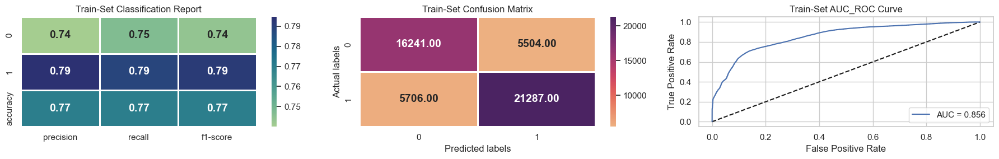

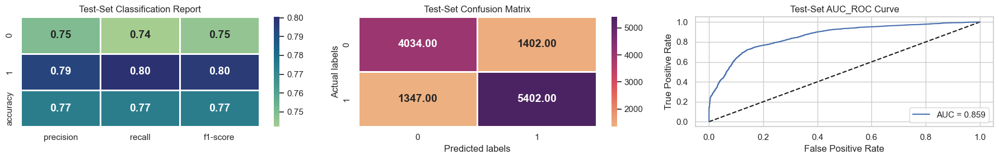

LogisticRegression(random_state=0)

In [263]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression Model and Visualizing evaluation Metric Score chart
logistic_classifier = LogisticRegression(fit_intercept=True, penalty='l2',random_state=0)
analyse_model(logistic_classifier, x_train, x_test, y_train, y_test)

In [264]:
from sklearn.linear_model import LogisticRegression
logit_model = LogisticRegression()
logit_model.fit(x_train, y_train)

# Predict Result
y_predict_train = logit_model.predict(x_train)
y_predict_test = logit_model.predict(x_test)

Confusion matrix (test)
[[4034 1402]
 [1347 5402]]
********************************************************************
Confusion matrix (train)
[[16241  5504]
 [ 5706 21287]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.75      0.74      0.75      5436
           1       0.79      0.80      0.80      6749

    accuracy                           0.77     12185
   macro avg       0.77      0.77      0.77     12185
weighted avg       0.77      0.77      0.77     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.74      0.75      0.74     21745
           1       0.79      0.79      0.79     26993

    accuracy                           0.77     48738
   macro avg       0.77      0.77      0.77     48738
weighted avg       0.77   

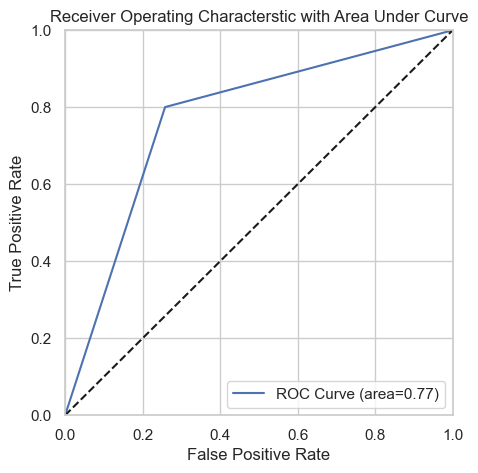

In [265]:
y_predict_train = logistic_classifier.predict(x_train)
y_predict_test = logistic_classifier.predict(x_test)

print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 2 - SGDClassifier

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

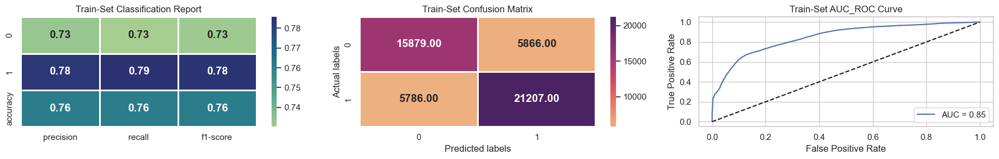

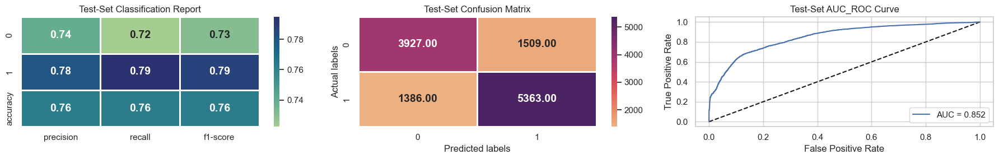

SGDClassifier(loss='log_loss')

In [266]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import SGDClassifier

# Fitting SCDCClassifier Model and Visualizing evaluation Metric Score chart
SGDC_classifier = SGDClassifier(loss="log_loss")
analyse_model(SGDC_classifier, x_train, x_test, y_train, y_test)

## ML Model - 3 Decision Treee

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

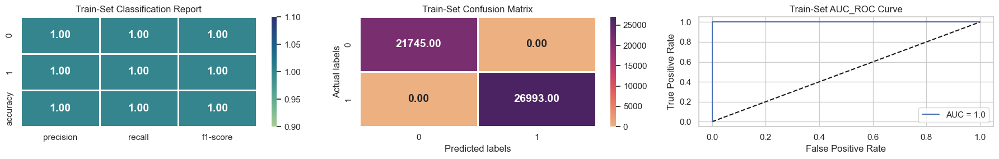

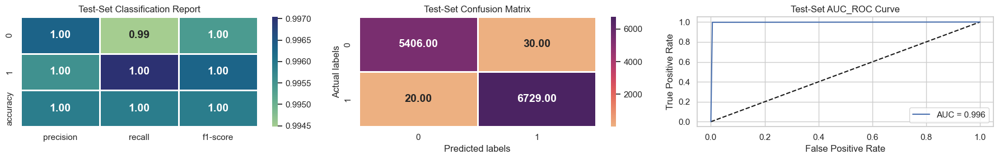

DecisionTreeClassifier(random_state=0)

In [269]:
# Importing RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Fitting RandomForestClassifier Model
DT_classifier = DecisionTreeClassifier(random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(DT_classifier, x_train, x_test, y_train, y_test)

In [270]:
from sklearn.tree import DecisionTreeClassifier

# Criterion = Gini
dtree = DecisionTreeClassifier(criterion='gini')
dtree.fit(x_train, y_train)

# Prediction
y_predict_train = dtree.predict(x_train)
y_predict_test = dtree.predict(x_test)

Confusion matrix (test)
[[5403   33]
 [  20 6729]]
********************************************************************
Confusion matrix (train)
[[21745     0]
 [    0 26993]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      5436
           1       1.00      1.00      1.00      6749

    accuracy                           1.00     12185
   macro avg       1.00      1.00      1.00     12185
weighted avg       1.00      1.00      1.00     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     21745
           1       1.00      1.00      1.00     26993

    accuracy                           1.00     48738
   macro avg       1.00      1.00      1.00     48738
weighted avg       1.00   

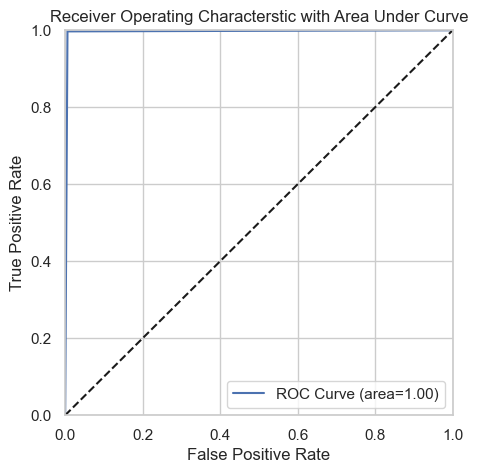

In [271]:
# Prediction
y_predict_train = dtree.predict(x_train)
y_predict_test = dtree.predict(x_test)


print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 4 BaggingClassifier

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

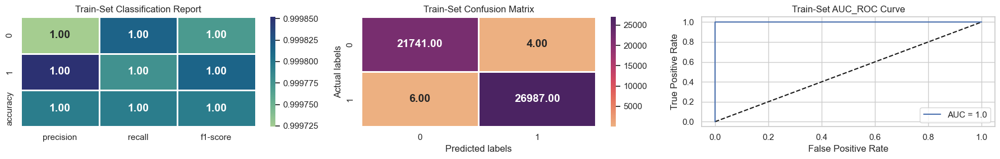

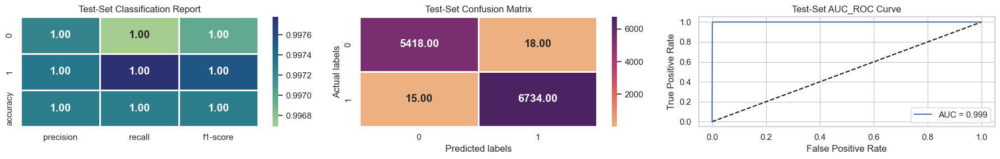

BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1, oob_score=True,
                  random_state=0)

In [272]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier, x_train, x_test, y_train, y_test)

In [273]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)
BG_classifier.fit(x_train, y_train)

# Prediction
y_predict_train = BG_classifier.predict(x_train)
y_predict_test = BG_classifier.predict(x_test)

Confusion matrix (test)
[[5418   18]
 [  15 6734]]
********************************************************************
Confusion matrix (train)
[[21741     4]
 [    6 26987]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5436
           1       1.00      1.00      1.00      6749

    accuracy                           1.00     12185
   macro avg       1.00      1.00      1.00     12185
weighted avg       1.00      1.00      1.00     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     21745
           1       1.00      1.00      1.00     26993

    accuracy                           1.00     48738
   macro avg       1.00      1.00      1.00     48738
weighted avg       1.00   

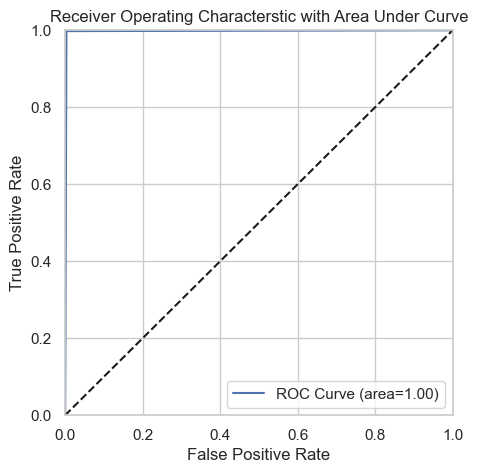

In [274]:
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

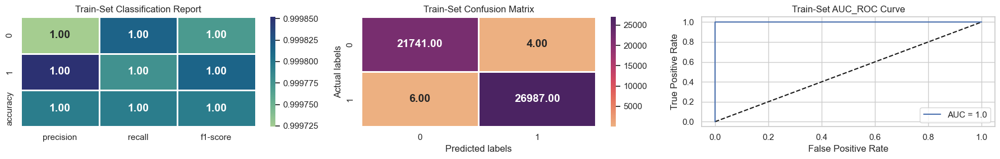

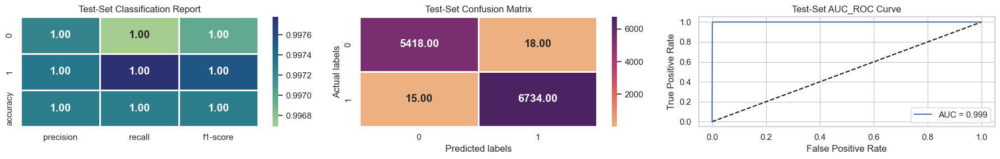

BaggingClassifier(estimator=DecisionTreeClassifier(), n_jobs=-1, oob_score=True,
                  random_state=0)

In [275]:
# Importing RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

# Fitting RandomForestClassifier Model
BG_classifier1 = BaggingClassifier(DecisionTreeClassifier(), n_jobs=-1,oob_score=True, random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(BG_classifier1, x_train, x_test, y_train, y_test)

## ML Model - 5 Random Forest

### 1. Explain the ML Model and it's performance using Evaluation metric Score Chart.

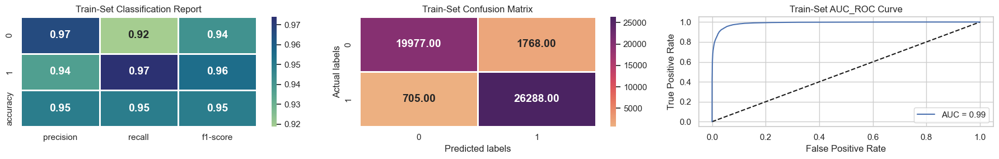

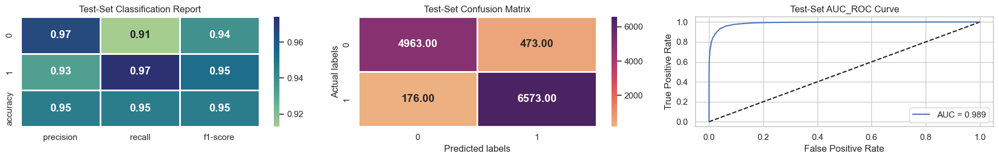

RandomForestClassifier(max_samples=200, n_estimators=600, n_jobs=-1,
                       oob_score=True, random_state=0)

In [276]:
# Importing RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Fitting RandomForestClassifier Model
RF_classifier = RandomForestClassifier(n_estimators=600,max_samples=200,oob_score=True,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(RF_classifier, x_train, x_test, y_train, y_test)

In [279]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=600,max_samples=200,oob_score=True,n_jobs=-1,random_state=0)
rf.fit(x_train, y_train)

# Predict
y_predict_train = rf.predict(x_train)
y_predict_test = rf.predict(x_test)

Confusion matrix (test)
[[4963  473]
 [ 176 6573]]
********************************************************************
Confusion matrix (train)
[[19977  1768]
 [  705 26288]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.97      0.91      0.94      5436
           1       0.93      0.97      0.95      6749

    accuracy                           0.95     12185
   macro avg       0.95      0.94      0.95     12185
weighted avg       0.95      0.95      0.95     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.97      0.92      0.94     21745
           1       0.94      0.97      0.96     26993

    accuracy                           0.95     48738
   macro avg       0.95      0.95      0.95     48738
weighted avg       0.95   

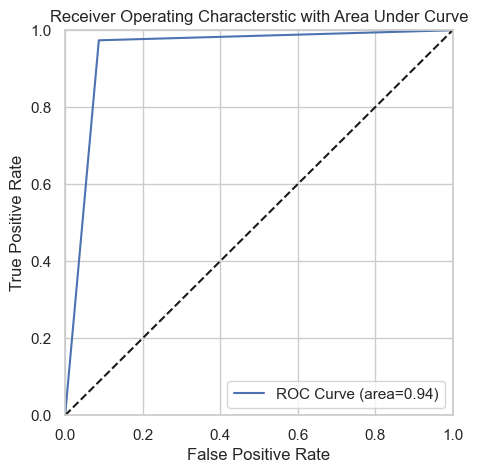

In [280]:
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

<Axes: ylabel='Feature'>

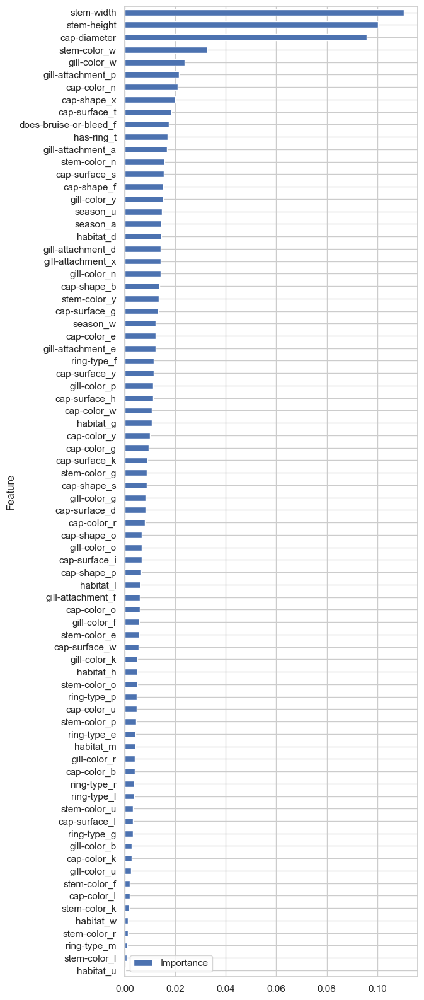

In [281]:
feature_importance = pd.DataFrame({'Feature': x_train.columns, 'Importance': np.abs(RF_classifier.feature_importances_)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(6, 20))

## ML Model - 6 AdaBoost

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

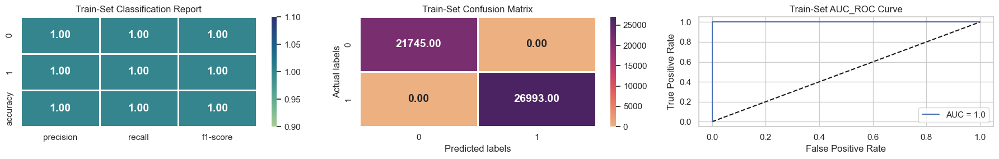

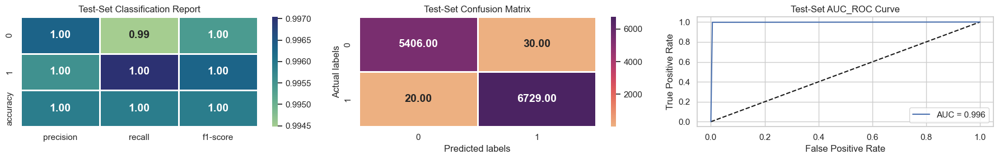

AdaBoostClassifier(estimator=DecisionTreeClassifier(), learning_rate=1)

In [282]:
# Importing AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

# Fitting AdaBoostClassifier Model
adboost_classifier1 = AdaBoostClassifier(DecisionTreeClassifier(), learning_rate=1,algorithm="SAMME.R")

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(adboost_classifier1, x_train, x_test, y_train, y_test)

<Axes: ylabel='Feature'>

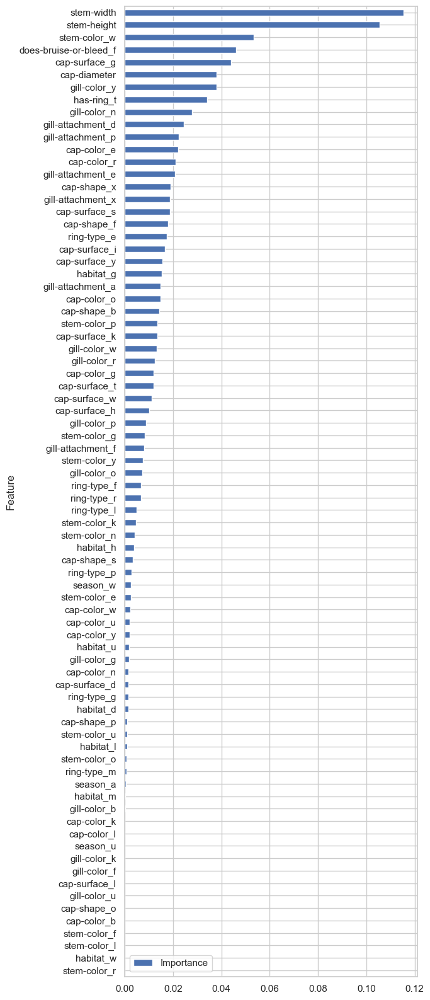

In [283]:
feature_importance = pd.DataFrame({'Feature': x_train.columns, 'Importance': np.abs(adboost_classifier1.feature_importances_)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(6, 20))

In [286]:
from sklearn.ensemble import AdaBoostClassifier
adacls = AdaBoostClassifier(random_state=1)
adacls.fit(x_train, y_train)

# prediction
y_predict_train = adacls.predict(x_train)
y_predict_test = adacls.predict(x_test)

Confusion matrix (test)
[[3969 1467]
 [1256 5493]]
********************************************************************
Confusion matrix (train)
[[16007  5738]
 [ 5204 21789]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       0.76      0.73      0.74      5436
           1       0.79      0.81      0.80      6749

    accuracy                           0.78     12185
   macro avg       0.77      0.77      0.77     12185
weighted avg       0.78      0.78      0.78     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       0.75      0.74      0.75     21745
           1       0.79      0.81      0.80     26993

    accuracy                           0.78     48738
   macro avg       0.77      0.77      0.77     48738
weighted avg       0.78   

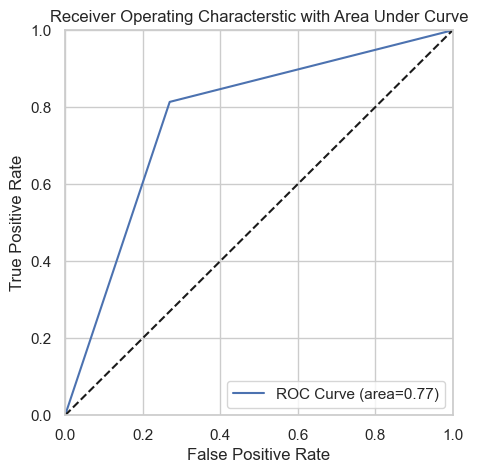

In [287]:
print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 7 XGboost

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

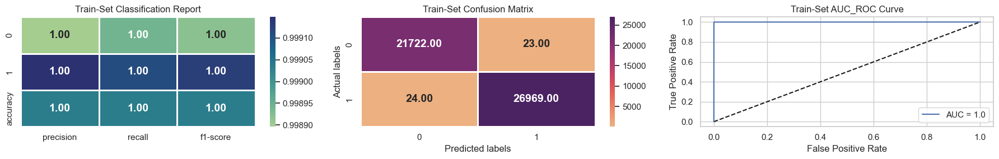

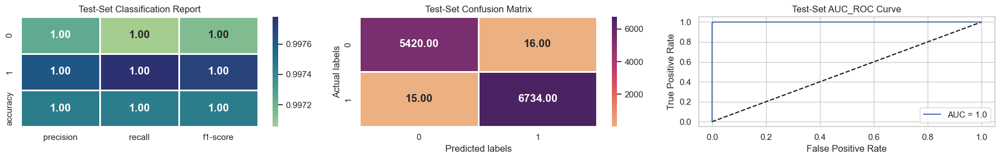

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [290]:
# Importing RandomForestClassifier
from xgboost import XGBClassifier

# Fitting XGBClassifier Model
XGB_classifier = XGBClassifier()

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(XGB_classifier, x_train, x_test, y_train, y_test)
     


Confusion matrix (test)
[[5420   16]
 [  15 6734]]
********************************************************************
Confusion matrix (train)
[[21722    23]
 [   24 26969]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5436
           1       1.00      1.00      1.00      6749

    accuracy                           1.00     12185
   macro avg       1.00      1.00      1.00     12185
weighted avg       1.00      1.00      1.00     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     21745
           1       1.00      1.00      1.00     26993

    accuracy                           1.00     48738
   macro avg       1.00      1.00      1.00     48738
weighted avg       1.00   

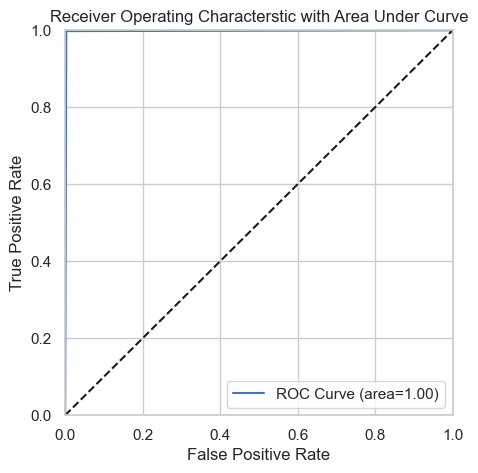

In [291]:
# prediction
y_predict_train = XGB_classifier.predict(x_train)
y_predict_test = XGB_classifier.predict(x_test)


print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

## ML Model - 8 Naive Bayes

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

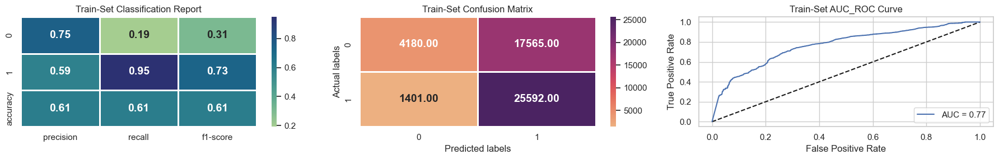

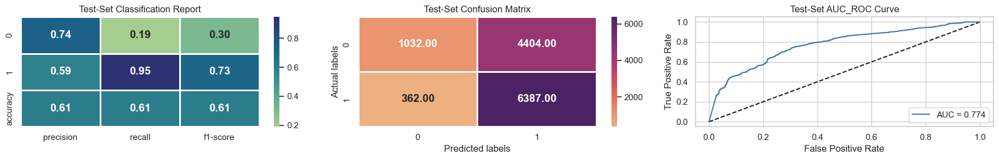

GaussianNB()

In [292]:
# Importing GaussianNB
from sklearn.naive_bayes import GaussianNB

# Fitting GaussianNB Model
NB_classifier1 = GaussianNB()

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(NB_classifier1, x_train, x_test, y_train, y_test)

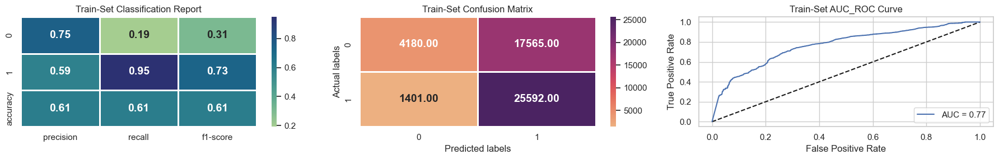

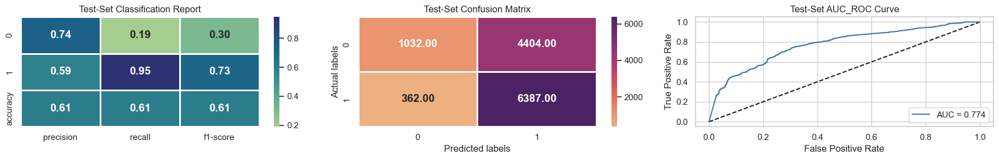

GaussianNB()

In [293]:
# Importing GaussianNB
from sklearn.naive_bayes import GaussianNB

# Fitting GaussianNB Model
NB_classifier1 = GaussianNB()

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(NB_classifier1, x_train, x_test, y_train, y_test)

## ML Model - 10 SVC

### 1.  Explain the ML Model and it's performance using Evaluation metric Score Chart.

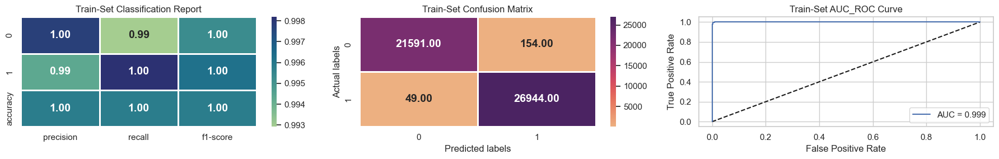

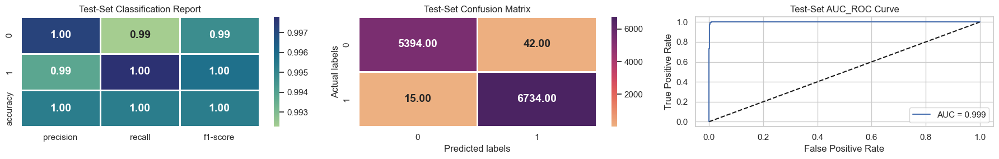

SVC(probability=True, random_state=0)

In [296]:
# Importing SVC
from sklearn.svm import SVC

# Fitting SVC Model
SVC_classifier = SVC(probability= True,random_state=0)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(SVC_classifier, x_train, x_test, y_train, y_test)

Confusion matrix (test)
[[5394   42]
 [  15 6734]]
********************************************************************
Confusion matrix (train)
[[21591   154]
 [   49 26944]]
**********************************************************************
Classification Report(test)
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      5436
           1       0.99      1.00      1.00      6749

    accuracy                           1.00     12185
   macro avg       1.00      1.00      1.00     12185
weighted avg       1.00      1.00      1.00     12185

**********************************************************************
Classification Report(train)
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     21745
           1       0.99      1.00      1.00     26993

    accuracy                           1.00     48738
   macro avg       1.00      1.00      1.00     48738
weighted avg       1.00   

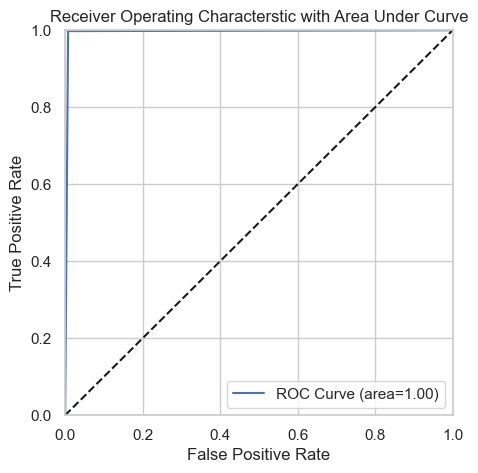

In [297]:
# prediction
y_predict_train = SVC_classifier.predict(x_train)
y_predict_test = SVC_classifier.predict(x_test)


print('Confusion matrix (test)')
print(confusion_matrix(y_test, y_predict_test))
print("********************************************************************")
print('Confusion matrix (train)')
print(confusion_matrix(y_train, y_predict_train))
print("**********************************************************************")
print("Classification Report(test)")
print(classification_report(y_test, y_predict_test))
print("**********************************************************************")
print('Classification Report(train)')
print(classification_report(y_train, y_predict_train))
print("**********************************************************************")
print('Training Accuracy', accuracy_score(y_train, y_predict_train))
print('**********************************************************************')
print('Test Accuracy', accuracy_score(y_test, y_predict_test))
print("**********************************************************************")
print("***********************************************************************")
logistic_roc_auc = roc_auc_score(y_test, y_predict_test)
print(f"roc_auc_score : {logistic_roc_auc}")

# ROC-AUC 
fpr, tpr, thresholds = roc_curve(y_test, y_predict_test)

plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, label='ROC Curve (area=%0.2f)' %logistic_roc_auc)
plt.plot([0,1], [0,1], 'k--')
plt.xlim(0.0,1.0)
plt.ylim(0.0,1.0)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characterstic with Area Under Curve')
plt.legend(loc='lower right')
plt.show()

### Which ML model did we choose from the above created models as our final prediction model and why?



In [278]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Decision_tree","Random_forest","AdaBoost","XGboost","SVM"]
Precision = [] 
Recall = []
F1_Score= []
Accuracy = []
AUCROC = []

# Create dataframe from the lists
data = {'Models': models, 
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUCROC': AUCROC,
       }
metric_df = pd.DataFrame(data)

# Printing dataframe

ValueError: All arrays must be of the same length